In [1]:
import brian2 as b2 # used for neural simulation
from brian2 import *

import numpy as np # used for array operations
from scipy.stats import poisson, binom, f, multivariate_normal, stats # used for stats (mean, s.d.)
from scipy import stats
from scipy.special import gammaln

import matplotlib.pyplot as plt # used for plotting
from matplotlib import gridspec
import matplotlib.colors as mcolors
from matplotlib.lines import Line2D

import math
import random
import warnings
import json

b2.prefs.codegen.target = "numpy" # set Brian2 to use numpy backend

# from sklearn.feature_selection import f_classif
# from brian2 import NeuronGroup, Synapses, PoissonGroup, SpikeMonitor, run, ms, Hz, PoissonInput, clear_cache, device, get_unit, second

In [2]:
%run neural_simulation_functions.py
# %run neural_simulation_functions.ipynb

#fix it to be a .py file not a .ipynb file

In [3]:
#import the python file
# once everything is good run this

#from neural_simulation_functions import *

Parameters.

In [5]:
num_neurons = 10 # try 10 just to see covariance matrices
rate = 10 # change back to 10
rates = np.linspace(5, 15, num_neurons) # change back to np.linspace(5, 14, num_neurons)
time = 1000
num_samples = 1000 # change to 100 to show Alex next time, but plot the first five trajectories or random five 
t0 = 200
time_points = np.arange(0, 1000)

In [6]:
# Single rate absolute (perturbation magnitude with rate): std_dev = perturbation_magnitude * base_rates[neuron]
#perturbed_rate1 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, relative=True)
# each neuron has a rate of 10 hz
#print(perturbed_rate1)

# Single rate relative (perturbation magnitude without rate): std_dev = perturbation_magnitude
#perturbed_rate2 = generate_perturbed_rates(num_neurons, rate, perturbation_magnitude = 0.1, relative=False)
# each neuron has a rate of 10 hz
#print(perturbed_rate2)

In [7]:
perturbed_rates1 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, relative=True)
print(perturbed_rates1)

#perturbed_rates2 = generate_perturbed_rates(num_neurons, rates, perturbation_magnitude = 0.1, relative=False)
#print(perturbed_rates2)

[ 4.84703761  5.4295095   6.28599787 10.28367952  9.00193228 10.94357445
 12.6760246  11.0196497  15.14423582 16.29770798]


In [8]:
# Simulation control parameters

# Network parameters
N_E = 1000
#gamma = 0.25                    # ratio of inhibitory to excitatory neurons
#N_I = round(gamma * N_E)
#N = N_E + N_I
epsilon = 0.1                   # Sparsity of connections.  changed from 0.1, 0.2 was fine...
#C_E = epsilon * N_E             # number of excitatory connections per neuron
#C_ext = C_E                     # external connections per neuron


# Neuron parameters
#tau = 20  * ms                  # Membrane time constant. previously 20, tried 50 it was weird, larger numbers more spikes, smaller numbers less spikes
                                # Higher Tau means slower decay, more spikes.
                                # Lower Tau means faster decay, fewer spikes
#theta = 20  * mV                # spike threshold voltage, neuron fires when hitting this value
#V_r = 10  * mV                  # reset potential, voltage neuron goes back to after firing
#tau_rp = 2  * ms                # refractory period (neuron needs to wait some time before spiking again)

# Synapse parameters
#J = 0.1 * mV                    # Synaptic strength # Previously 0.1 * mV, previouysly 0.075, 0.2 was too varied need to be more consistent
                                # larger J, stronger synaptic input, higher firing rate
                                # smaller J, weaker input, lower firing rates
#D = 1.5  * ms                   # synaptic delay, time between a pre spike and its effect on postsynap neuron

# Simulation settings
#dt = 0.1  * ms
g = 4                           # g is a good control for manipulating the firing rate, smaller numbers more spikes, bigger numbers less spikes
                                # Higher g, stronger inhibition, suppresses network activity
                                # Lower g, weaker inhibition, increase network activity
nu_ext_over_nu_thr = 1          # Previously 2, 1.2 was weird, 1 (made 2d plot nice), 0.5 not good,
# t_range = [1000, 1200]
# rate_range = [0, 200]
# rate_tick_step = 50

#nu_thr = theta / (J * C_E * tau) # minimal input rate needed to reach threshold
#nu_ext = nu_ext_over_nu_thr * nu_thr # external input rate

# adjust g and nu_ext so that nu_ext is approximately the number of spikes that are occuring, influenced by g. 
# epsilon 0.2 and g = 2.6, g = 2.8 is too much,tau = 50
# epsilon 0.5 and g = 4, tau = 20

In [9]:
N_E = 1000
gamma = 0.25                    # ratio of inhibitory to excitatory neurons
N_I = round(gamma * N_E)
N = N_E + N_I

In [10]:
N

1250

Generating spike trains, then counting the spikes.

In [12]:
raw_spike_train = independent_poisson_processes(num_neurons, time, num_samples, rate = rate)
# print(raw_spike_train)

In [13]:
save_spike_trains(raw_spike_train, "spike_trains.json")
loaded_spike_trains = load_spike_trains("spike_trains.json")
# print(loaded_spike_trains)

Spike trains saved to spike_trains.json


In [14]:
spike_train = standardize_units(raw_spike_train)
# print(spike_train)

In [15]:
raw_multi_rate_spike_train = multivariate_constant_poisson(num_neurons, time, num_samples, rates = rates)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([ 5.        ,  6.11111111,  7.22222222,  8.33333333,  9.44444444,
       10.55555556, 11.66666667, 12.77777778, 13.88888889, 15.        ]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [16]:
save_spike_trains(raw_multi_rate_spike_train, "multi_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("multi_rate_spike_trains.json")

Spike trains saved to multi_rate_spike_trains.json


In [17]:
multi_rate_spike_train = standardize_units(raw_multi_rate_spike_train)

In [18]:
raw_perturbed_rate_spike_train = multivariate_constant_poisson(num_neurons, time, num_samples, rates = perturbed_rates1)

WARNING    'rates' is an internal variable of group 'poissongroup', but also exists in the run namespace with the value array([ 4.84703761,  5.4295095 ,  6.28599787, 10.28367952,  9.00193228,
       10.94357445, 12.6760246 , 11.0196497 , 15.14423582, 16.29770798]). The internal variable will be used. [brian2.groups.group.Group.resolve.resolution_conflict]


In [19]:
save_spike_trains(raw_perturbed_rate_spike_train, "perturbed_rate_spike_trains.json")
loaded_spike_trains = load_spike_trains("perturbed_rate_spike_trains.json")

Spike trains saved to perturbed_rate_spike_trains.json


In [20]:
perturbed_rate_spike_train = standardize_units(raw_perturbed_rate_spike_train)

In [21]:
# first_spike = find_nth_earliest_spike(spike_train, n=2)

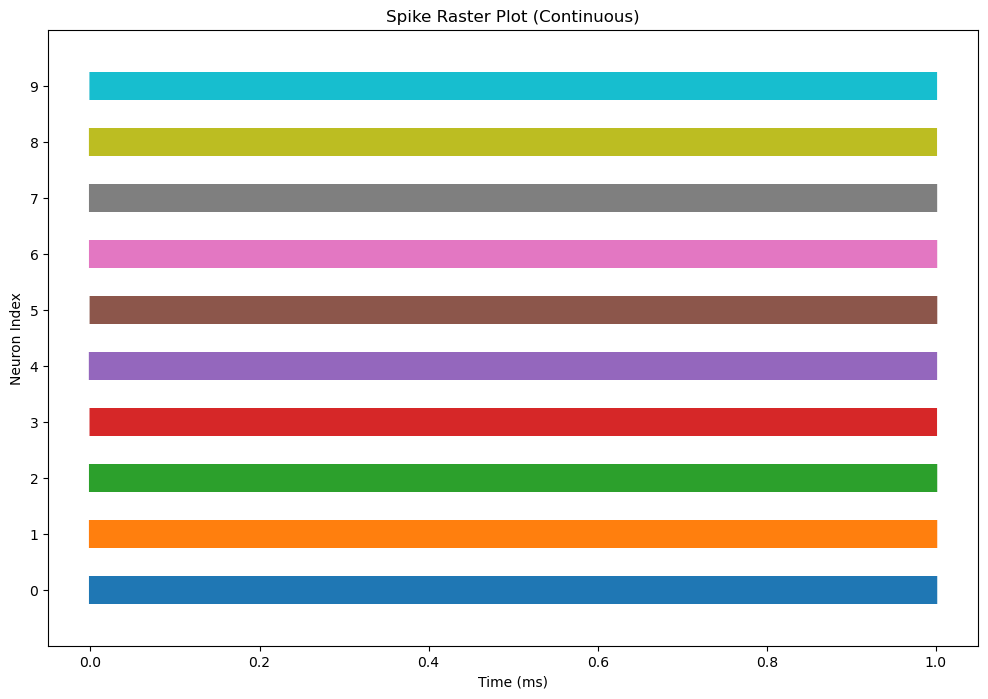

In [22]:
raster_plot(spike_train, colors=None, linelengths=None, figsize=(12,8))

In [23]:
binary_spikes = spikes_to_binary(spike_train, num_neurons, time)
multi_rate_binary_spikes = spikes_to_binary(multi_rate_spike_train, num_neurons, time)
perturbed_rate_binary_spikes = spikes_to_binary(perturbed_rate_spike_train, num_neurons, time)

In [24]:
spike_count = count_spikes(binary_spikes)
count = np.array(spike_count)
# print(count)
# print(count.shape)
multi_rate_spike_count = count_spikes(multi_rate_binary_spikes)
multi_rate_count = np.array(multi_rate_spike_count)

perturbed_rate_spike_count = count_spikes(perturbed_rate_binary_spikes)
perturbed_rate_count = np.array(perturbed_rate_spike_count)

In [25]:
random_indices = np.random.choice(count.shape[0], size=5, replace=False)  # No duplicates
random_samples = count[random_indices]  # Shape: (5, neurons, time)

Getting spike trains from excitatory and inhibitory neurons, then counting the spikes.

In [27]:
# results = sim(params["g"], params["nu_ext_over_nu_thr"], params["t_range"][1] * ms, ax_spikes, ax_rates, params["rate_tick_step"], num_neurons, num_samples)
results = sim(N_E, epsilon, g, nu_ext_over_nu_thr, time, num_neurons, num_samples)

raw_excitatory_spike_trains = results['excitatory']['spike_trains']
raw_inhibitory_spike_trains = results['inhibitory']['spike_trains']
# print(raw_excitatory_spike_trains)

In [28]:
save_spike_trains(raw_excitatory_spike_trains, "spike_trains_ex.json")
loaded_spike_trains_ex = load_spike_trains("spike_trains_ex.json")

save_spike_trains(raw_inhibitory_spike_trains, "spike_trains_in.json")
loaded_spike_trains_in = load_spike_trains("spike_trains_in.json")

Spike trains saved to spike_trains_ex.json
Spike trains saved to spike_trains_in.json


In [29]:
excitatory_spike_trains = standardize_units(raw_excitatory_spike_trains)
inhibitory_spike_trains = standardize_units(raw_inhibitory_spike_trains)

#print(excitatory_spike_trains[0])
#print(inhibitory_spike_trains[0])

In [30]:
#first_spike_ex = find_nth_earliest_spike(excitatory_spike_trains, n=2)
#first_spike_in = find_nth_earliest_spike(inhibitory_spike_trains, n=2)

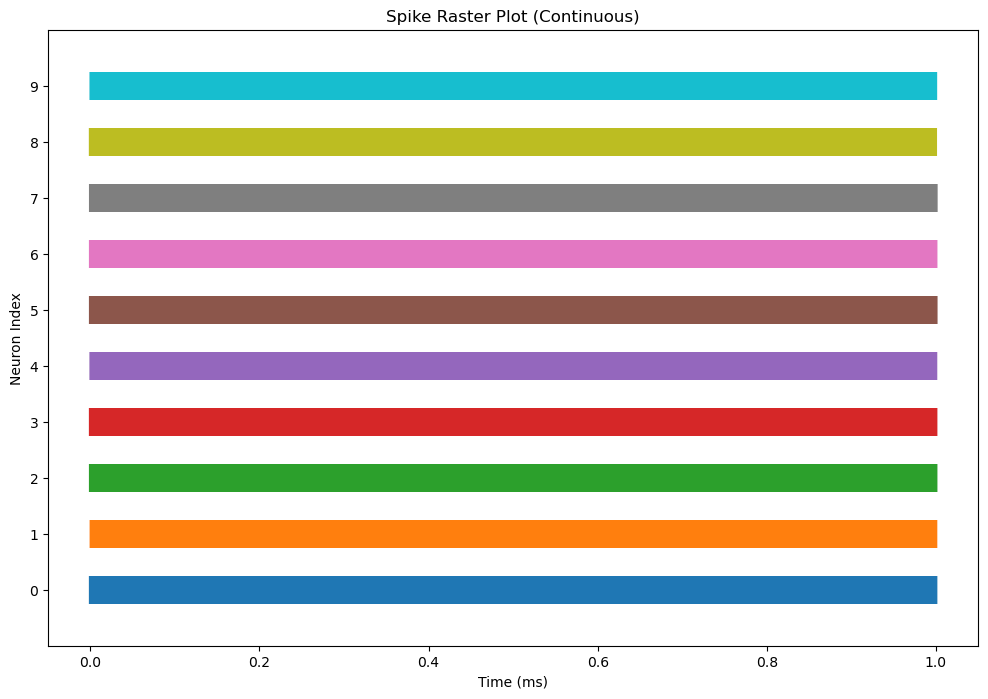

In [31]:
raster_plot(excitatory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

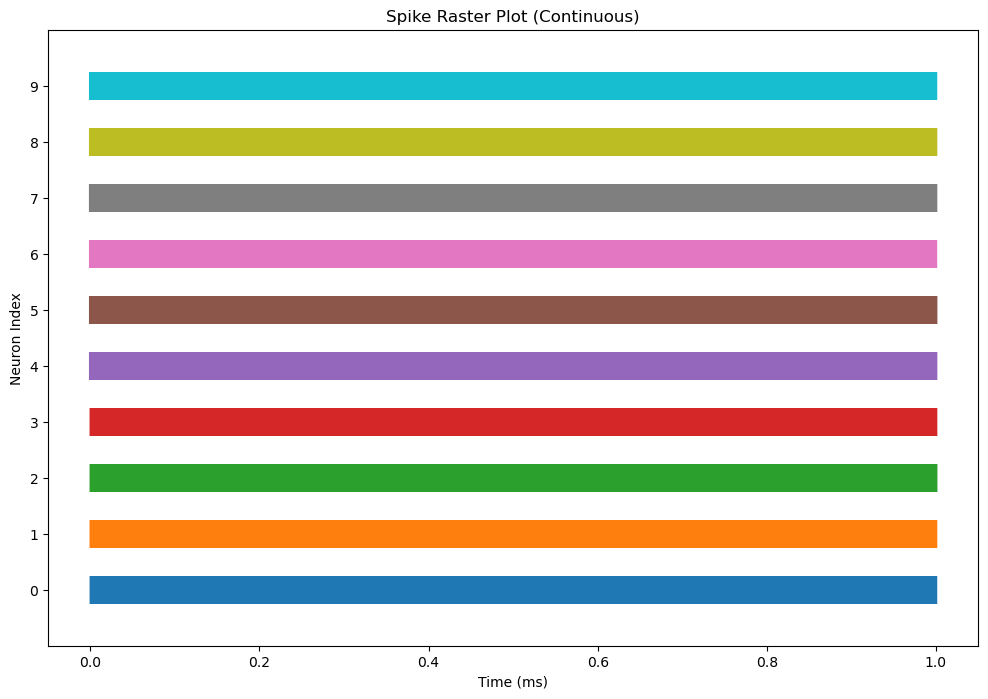

In [32]:
raster_plot(inhibitory_spike_trains, colors=None, linelengths=None, figsize=(12,8))

In [33]:
binary_ex_spikes = spikes_to_binary(excitatory_spike_trains, num_neurons, time)
binary_in_spikes = spikes_to_binary(inhibitory_spike_trains, num_neurons, time)
# print(binary_ex_spikes[0][0]) # first sample of first neuron

In [34]:
spike_count_ex = count_spikes(binary_ex_spikes)
count_ex = np.array(spike_count_ex)
#print(spike_count_ex[0])
#print(count_ex[0])
#print(count_ex[1])
#print(count_ex.shape)

spike_count_in = count_spikes(binary_in_spikes)
count_in = np.array(spike_count_in)
#print(count_in.shape)

In [35]:
random_indices_ex = np.random.choice(count_ex.shape[0], size=5, replace=False)  # No duplicates
random_samples_ex = count_ex[random_indices_ex]  # Shape: (5, neurons, time)

random_indices_in = np.random.choice(count_in.shape[0], size=5, replace=False)  # No duplicates
random_samples_in = count_in[random_indices_in]  # Shape: (5, neurons, time)

Theoretical and Empirical stats of raw counts.

In [37]:
# empirical_mean = empirical_means(count) # np.mean(count, axis=0), count.mean(axis=0)
empirical_mean = count.mean(axis=0)
#print(empirical_mean.shape)
count_rate = empirical_mean[:, -1]
#print(count_rate.shape)
#print(empirical_mean)
#print(empirical_mean.shape)
#print(count_rate)

# empirical_std_dev = std_dev_empirical_mean(empirical_mean, num_samples, count)
empirical_std_dev = np.sqrt(empirical_mean) #count.std(axis=0, ddof=1)
# empirical_std_dev = (count.std(axis=0)) #newly added, should be the same but isn't
# i fixed the above by using empirical_std_dev = (count.std(axis=0, ddof=1))
#print(empirical_std_dev)
#print(empirical_std_dev.shape)

empirical_lower_bound, empirical_upper_bound = confidence_intervals(empirical_mean, empirical_std_dev, num_samples, confidence_level=0.95)
# print(empirical_lower_bound)
# print(empirical_upper_bound)

In [38]:
multi_rate_empirical_mean = multi_rate_count.mean(axis=0)
multi_rate_count_rate = multi_rate_empirical_mean[:, -1]
multi_rate_empirical_std_dev = np.sqrt(multi_rate_empirical_mean) #count.std(axis=0, ddof=1)

multi_rate_empirical_lower_bound, multi_rate_empirical_upper_bound = confidence_intervals(multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [39]:
perturbed_rate_empirical_mean = perturbed_rate_count.mean(axis=0)
perturbed_rate_count_rate = perturbed_rate_empirical_mean[:, -1]
perturbed_rate_empirical_std_dev = np.sqrt(perturbed_rate_empirical_mean) #count.std(axis=0, ddof=1)

perturbed_rate_empirical_lower_bound, perturbed_rate_empirical_upper_bound = confidence_intervals(perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, confidence_level=0.95)

In [40]:
exclude_times, global_exclude = last_zero_std_time(empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [41]:
multi_rate_exclude_times, multi_rate_global_exclude = last_zero_std_time(multi_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [42]:
perturbed_rate_exclude_times, perturbed_rate_global_exclude = last_zero_std_time(perturbed_rate_empirical_std_dev, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [43]:
theoretical_means = calculate_theoretical_mean(count_rate, time)
#print(theoretical_means)
#print(theoretical_means.shape)

theoretical_std_dev = calculate_theoretical_std_dev(theoretical_means)
#print(theoretical_std_dev)
#print(theoretical_std_dev.shape)

theoretical_lower_bound, theoretical_upper_bound = confidence_intervals(theoretical_means, theoretical_std_dev, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound)
# print(theoretical_upper_bound)

In [44]:
multi_rate_theoretical_means = calculate_theoretical_mean(multi_rate_count_rate, time)
multi_rate_theoretical_std_dev = calculate_theoretical_std_dev(multi_rate_theoretical_means)

multi_rate_theoretical_lower_bound, multi_rate_theoretical_upper_bound = confidence_intervals(multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [45]:
perturbed_rate_theoretical_means = calculate_theoretical_mean(perturbed_rate_count_rate, time)
perturbed_rate_theoretical_std_dev = calculate_theoretical_std_dev(perturbed_rate_theoretical_means)

perturbed_rate_theoretical_lower_bound, perturbed_rate_theoretical_upper_bound = confidence_intervals(perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, confidence_level=0.95)

In [46]:
res_var = variance_of_residuals(empirical_mean, theoretical_means)
#print(res_var)

In [47]:
centers = center_counts_loop(count, theoretical_means, num_samples, num_neurons)

centers_mean = np.mean(centers, axis = 0)
centers_std_dev = np.std(centers, axis = 0, ddof = 1)

centers_emp = center_counts_loop(count, empirical_mean, num_samples, num_neurons)

centers_mean_emp = np.mean(centers_emp, axis = 0)
centers_std_dev_emp = np.std(centers_emp, axis = 0, ddof = 1)

In [48]:
multi_rate_centers = center_counts_loop(multi_rate_count, theoretical_means, num_samples, num_neurons)
# multi_rate_centers = center_counts_loop(multi_rate_count, multi_rate_theoretical_means, num_samples, num_neurons)

multi_rate_centers_mean = np.mean(multi_rate_centers, axis = 0)
multi_rate_centers_std_dev = np.std(multi_rate_centers, axis = 0, ddof = 1)

multi_rate_centers_emp = center_counts_loop(multi_rate_count, empirical_mean, num_samples, num_neurons)
# multi_rate_centers_emp = center_counts_loop(multi_rate_count, multi_rate_empirical_mean, num_samples, num_neurons)

multi_rate_centers_mean_emp = np.mean(multi_rate_centers_emp, axis = 0)
multi_rate_centers_std_dev_emp = np.std(multi_rate_centers_emp, axis = 0, ddof = 1)

In [49]:
perturbed_rate_centers = center_counts_loop(perturbed_rate_count, theoretical_means, num_samples, num_neurons)
# perturbed_rate_centers = center_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, num_samples, num_neurons)

perturbed_rate_centers_mean = np.mean(perturbed_rate_centers, axis = 0)
perturbed_rate_centers_std_dev = np.std(perturbed_rate_centers, axis = 0, ddof = 1)

perturbed_rate_centers_emp = center_counts_loop(perturbed_rate_count, empirical_mean, num_samples, num_neurons)
#perturbed_rate_centers_emp = center_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, num_samples, num_neurons)

perturbed_rate_centers_mean_emp = np.mean(perturbed_rate_centers_emp, axis = 0)
perturbed_rate_centers_std_dev_emp = np.std(perturbed_rate_centers_emp, axis = 0, ddof = 1)

Poisson Standardization 

In [51]:
stands = standardize_counts_loop(count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
#print(stands)
#print(stands.shape)
# we removed the very first time point for this dataset

stands_emp = standardize_counts_loop(count, empirical_mean, empirical_std_dev, num_samples, num_neurons, global_exclude)
#print(stands_emp)
# cleaned_stands_emp = stands_emp[:, ~np.isnan(stands_emp).all(axis=0)]

#print(stands_emp.shape)
# we need to remove a few of the first time points for this dataset

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, time , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global = np.mean(stands)
standardized_std_global = np.std(stands)

standardized_mean_emp_global = np.mean(stands_emp)
standardized_std_emp_global = np.std(stands_emp)

standardized_mean = np.mean(stands, axis=0)
standardized_std = np.std(stands, axis=0, ddof = 1)

standardized_mean_emp = np.mean(stands_emp, axis = 0)
standardized_std_emp = np.std(stands_emp, axis = 0, ddof = 1)

In [52]:
stands.shape # trials, num neurons, 

(1000, 10, 999)

In [53]:
has_negatives = np.any(stands < 0)
print(f"Array has negative numbers: {has_negatives}")
# this is why log-likelihood doesn't like me

Array has negative numbers: True


In [54]:
multi_rate_stands = standardize_counts_loop(multi_rate_count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# multi_rate_stands = standardize_counts_loop(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# standardize relative to theoretical means is above

## from Alex: for multirate, standardize relative to theoretical means and empirical means ##

multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, empirical_mean, empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)
# multi_rate_stands_emp = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)
# standardize relative to empirical means is above

multi_rate_standardized_mean_global = np.mean(multi_rate_stands)
multi_rate_standardized_std_global = np.std(multi_rate_stands)

multi_rate_standardized_mean_emp_global = np.mean(multi_rate_stands_emp)
multi_rate_standardized_std_emp_global = np.std(multi_rate_stands_emp)

multi_rate_standardized_mean = np.mean(multi_rate_stands, axis=0)
multi_rate_standardized_std = np.std(multi_rate_stands, axis=0, ddof = 1)

multi_rate_standardized_mean_emp = np.mean(multi_rate_stands_emp, axis = 0)
multi_rate_standardized_std_emp = np.std(multi_rate_stands_emp, axis = 0, ddof = 1)

In [55]:
perturbed_rate_stands = standardize_counts_loop(perturbed_rate_count, theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# perturbed_rate_stands = standardize_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, num_neurons, exclude = 1)
# standardize relative to theoretical means is above

## from Alex: for perturbation, standardize relative to theoretical means and empirical means ##
# these only gets used later in the cov matrix, it doesn't appear in plot_stats

perturbed_rate_stands_emp = standardize_counts_loop(perturbed_rate_count, empirical_mean, empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)
# perturbed_rate_stands_emp = standardize_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)
# standardize relative to empirical means is above
# this only gets used later in the cov matrix, it doesn't appear in plot_stats

perturbed_rate_standardized_mean_global = np.mean(perturbed_rate_stands)
perturbed_rate_standardized_std_global = np.std(perturbed_rate_stands)

perturbed_rate_standardized_mean_emp_global = np.mean(perturbed_rate_stands_emp)
perturbed_rate_standardized_std_emp_global = np.std(perturbed_rate_stands_emp)

perturbed_rate_standardized_mean = np.mean(perturbed_rate_stands, axis=0)
perturbed_rate_standardized_std = np.std(perturbed_rate_stands, axis=0, ddof = 1)

perturbed_rate_standardized_mean_emp = np.mean(perturbed_rate_stands_emp, axis = 0)
perturbed_rate_standardized_std_emp = np.std(perturbed_rate_stands_emp, axis = 0, ddof = 1)

In [56]:
perturbed_rate_stands_with_self_center = standardize_counts_loop(perturbed_rate_count, perturbed_rate_theoretical_means, theoretical_std_dev, num_samples, num_neurons, exclude = 1)
perturbed_rate_stands_emp_with_self_center = standardize_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)

In [57]:
## Then try the 3rd option: center with their own mean, scale by the null std.  ##
# Only empirical here
multi_rate_stands_emp_test = standardize_counts_loop(multi_rate_count, multi_rate_empirical_mean, empirical_std_dev, num_samples, num_neurons, multi_rate_global_exclude)

multi_rate_standardized_mean_emp_test = np.mean(multi_rate_stands_emp_test, axis = 0)
multi_rate_standardized_std_emp_test = np.std(multi_rate_stands_emp_test, axis = 0, ddof = 1)


perturbed_rate_stands_emp_test = standardize_counts_loop(perturbed_rate_count, perturbed_rate_empirical_mean, empirical_std_dev, num_samples, num_neurons, perturbed_rate_global_exclude)

perturbed_rate_standardized_mean_emp_test = np.mean(perturbed_rate_stands_emp_test, axis = 0)
perturbed_rate_standardized_std_emp_test = np.std(perturbed_rate_stands_emp_test, axis = 0, ddof = 1)

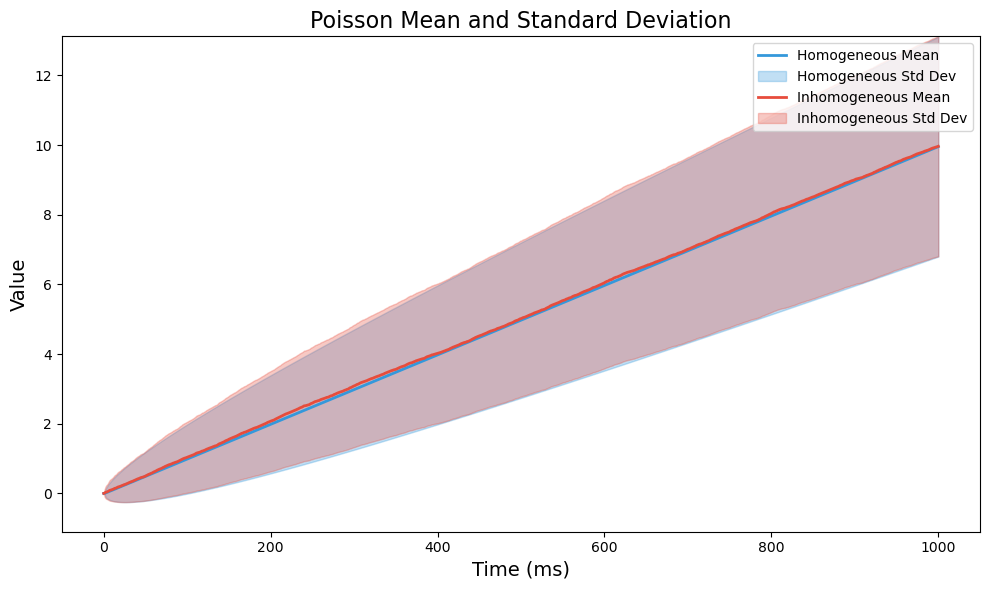

In [58]:
plot_stats(theoretical_means, empirical_mean, theoretical_std_dev, empirical_std_dev, title = 'Poisson Mean and Standard Deviation', show_hline=False, data_type='standardized')

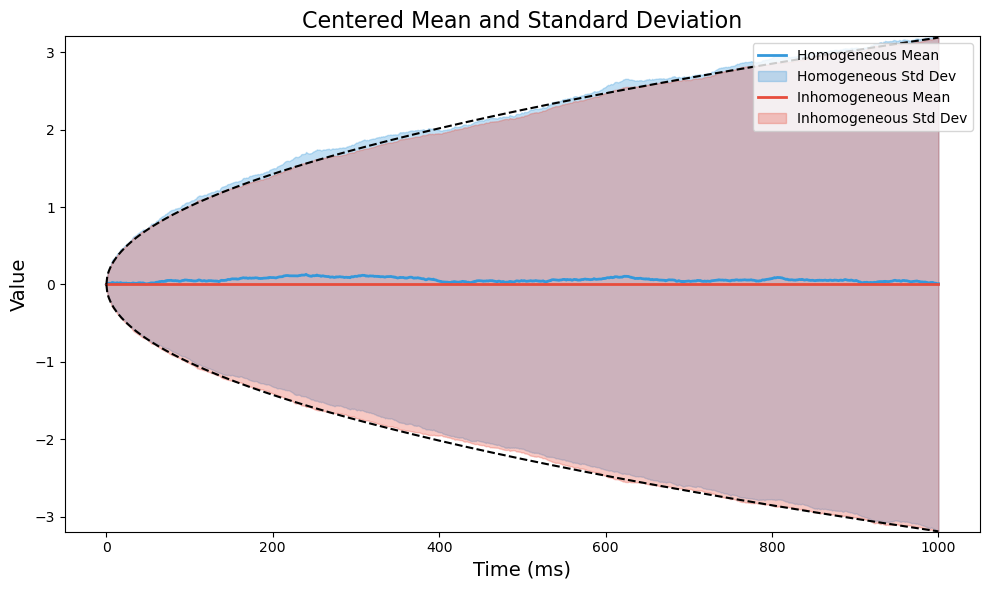

In [59]:
plot_stats(centers_mean, centers_mean_emp, centers_std_dev, centers_std_dev_emp, title = 'Centered Mean and Standard Deviation', show_hline=True, data_type='centered')

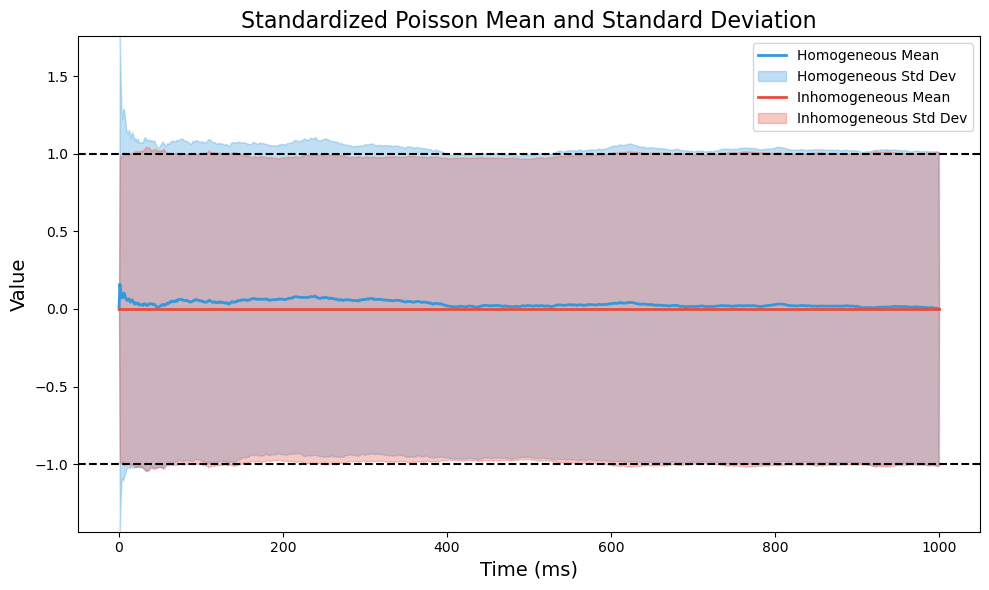

In [60]:
plot_stats(standardized_mean, standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Standardized Poisson Mean and Standard Deviation', show_hline=True, data_type='standardized')

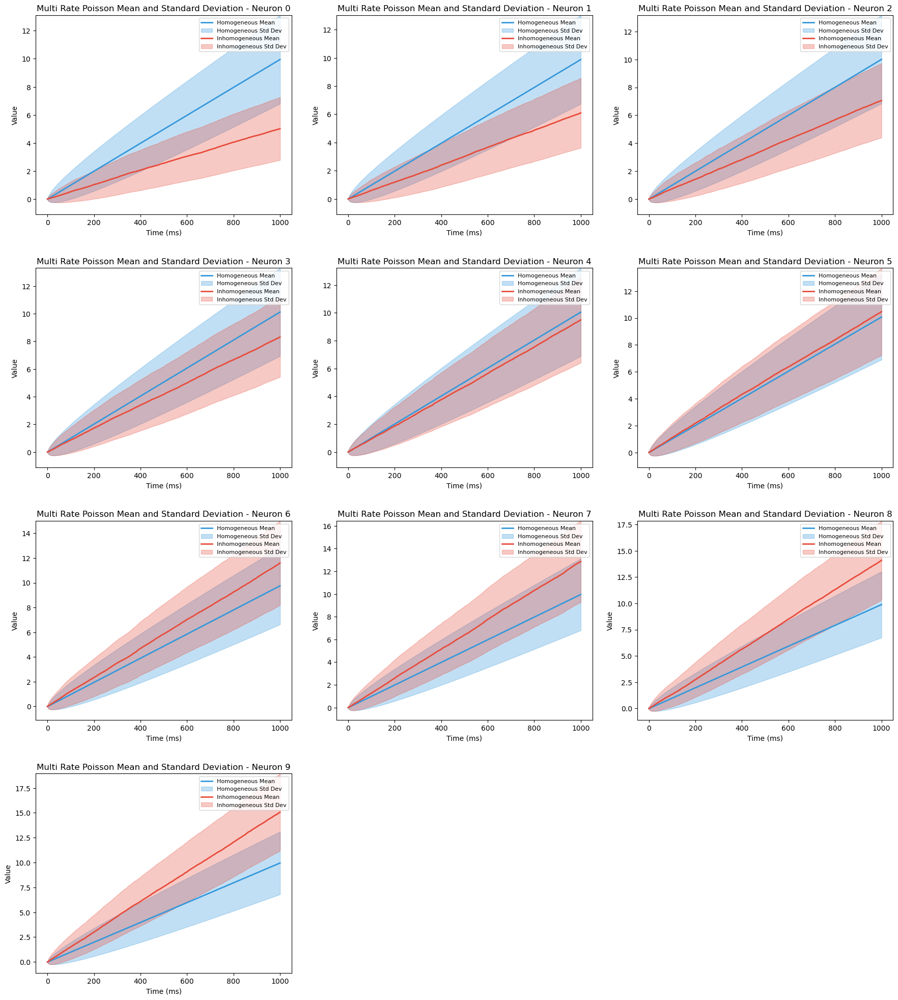

In [61]:
plot_multiple_stats(theoretical_means, multi_rate_empirical_mean, theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation', show_hline=False, data_type='standardized')
# plot_multiple_stats(multi_rate_theoretical_means, multi_rate_empirical_mean, multi_rate_theoretical_std_dev, multi_rate_empirical_std_dev, title = 'Multi Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

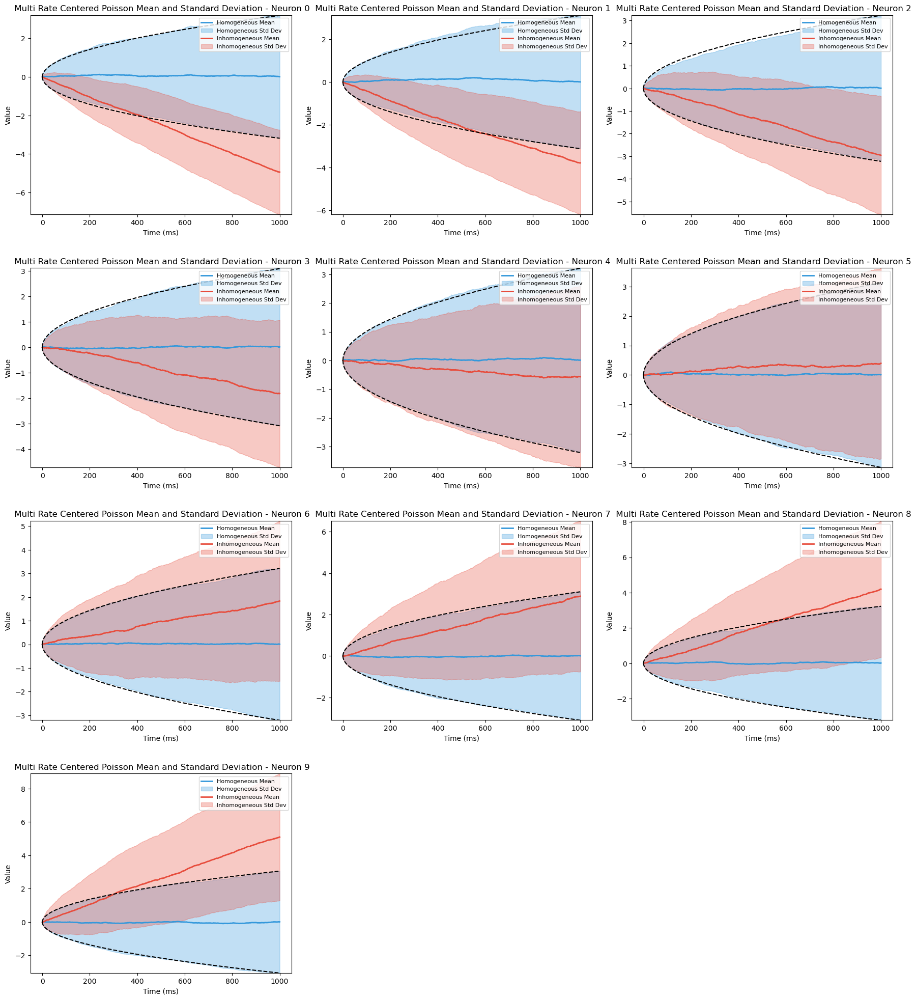

In [62]:
plot_multiple_stats(centers_mean, multi_rate_centers_mean_emp, centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation', show_hline=True, data_type='centered')
# plot_multiple_stats(multi_rate_centers_mean, multi_rate_centers_mean_emp, multi_rate_centers_std_dev, multi_rate_centers_std_dev_emp, title = ' Multi Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

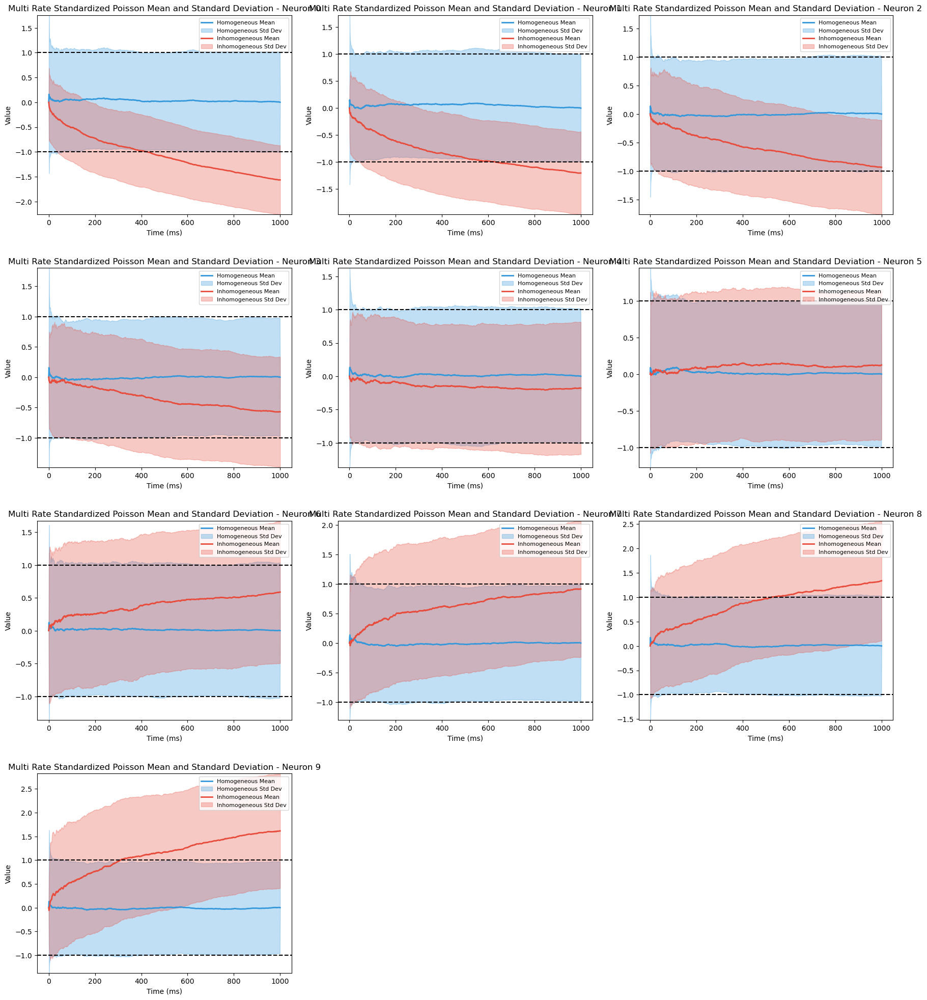

In [63]:
plot_multiple_stats(standardized_mean, multi_rate_standardized_mean_emp, standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation', show_hline=True, data_type='standardized')
# plot_multiple_stats(multi_rate_standardized_mean, multi_rate_standardized_mean_emp, multi_rate_standardized_std, multi_rate_standardized_std_emp, title = 'Multi Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

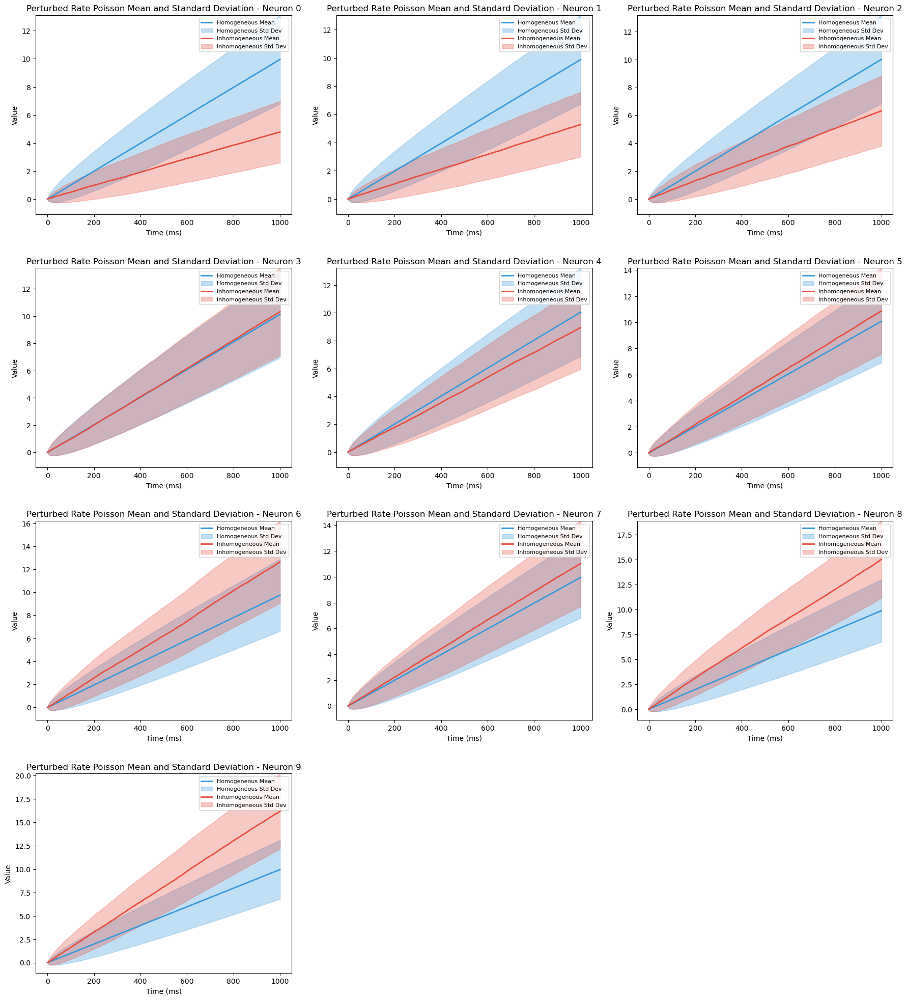

In [64]:
plot_multiple_stats(theoretical_means, perturbed_rate_empirical_mean, theoretical_std_dev, perturbed_rate_empirical_std_dev, title = 'Perturbed Rate Poisson Mean and Standard Deviation', show_hline=False, data_type='standardized')
# plot_multiple_stats(perturbed_rate_theoretical_means, perturbed_rate_empirical_mean, perturbed_rate_theoretical_std_dev, perturbed_rate_empirical_std_dev, title = 'Perturbed Rate Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots. For more precise plots we can go with isoclines.
# Aka lines with fixed probabilities

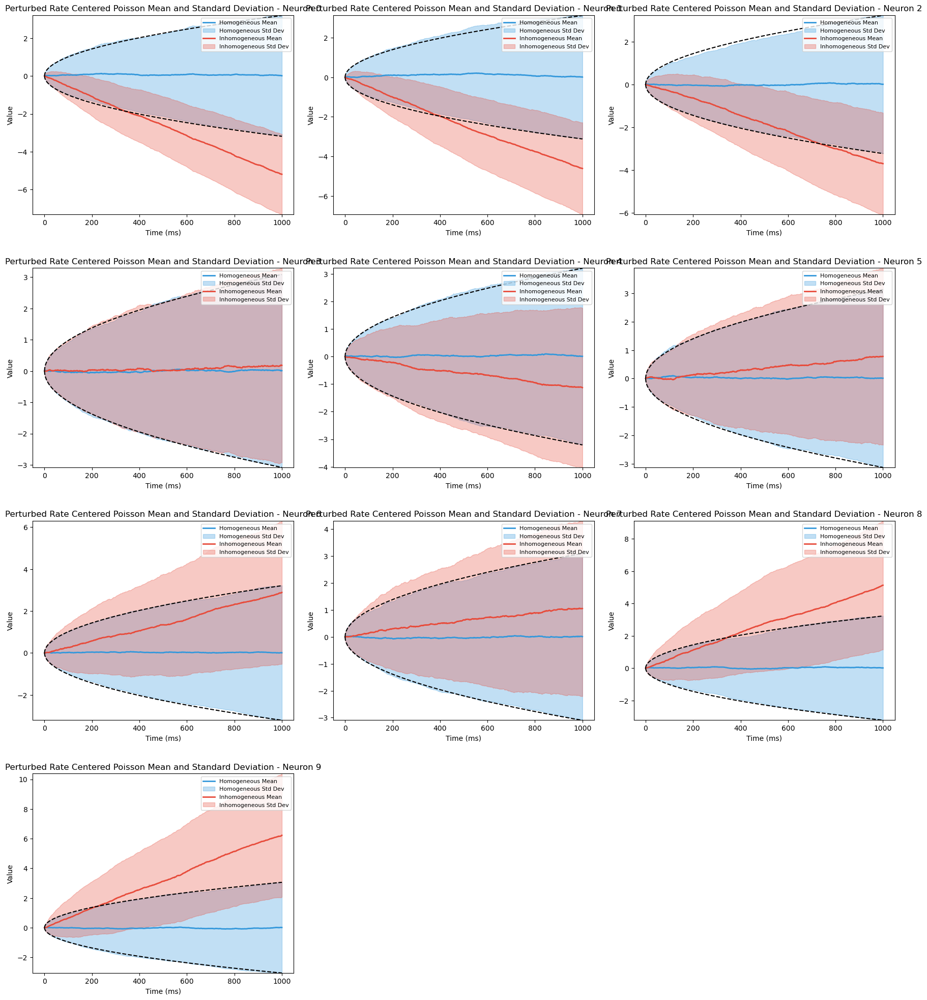

In [65]:
plot_multiple_stats(centers_mean, perturbed_rate_centers_mean_emp, centers_std_dev, perturbed_rate_centers_std_dev_emp, title = 'Perturbed Rate Centered Poisson Mean and Standard Deviation', show_hline=True, data_type='centered')
# plot_multiple_stats(perturbed_rate_centers_mean, perturbed_rate_centers_mean_emp, perturbed_rate_centers_std_dev, perturbed_rate_centers_std_dev_emp, title = 'Perturbed Rate Centered Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

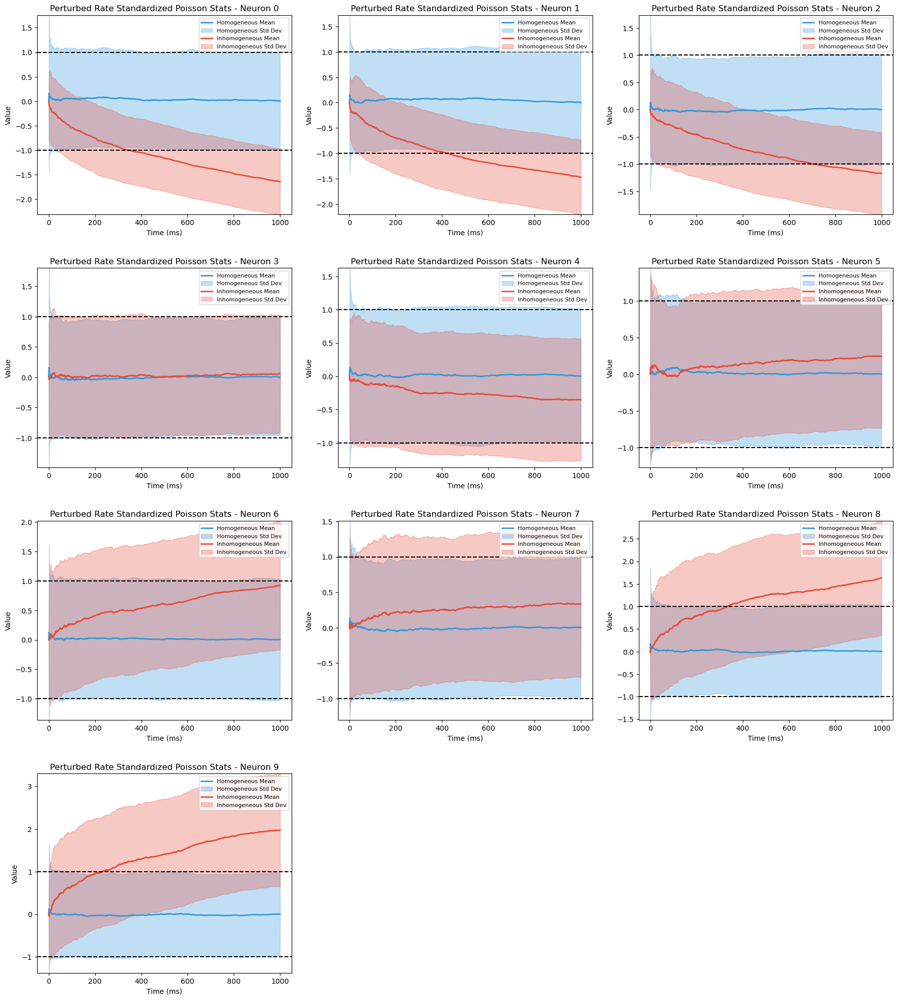

In [66]:
plot_multiple_stats(standardized_mean, perturbed_rate_standardized_mean_emp, standardized_std, perturbed_rate_standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Stats', show_hline=True, data_type='standardized')
# plot_multiple_stats(perturbed_rate_standardized_mean, perturbed_rate_standardized_mean_emp, perturbed_rate_standardized_std, perturbed_rate_standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation')
# Note in presentation highlight the difference y axis values between plots

center with their own mean, scale by the null std

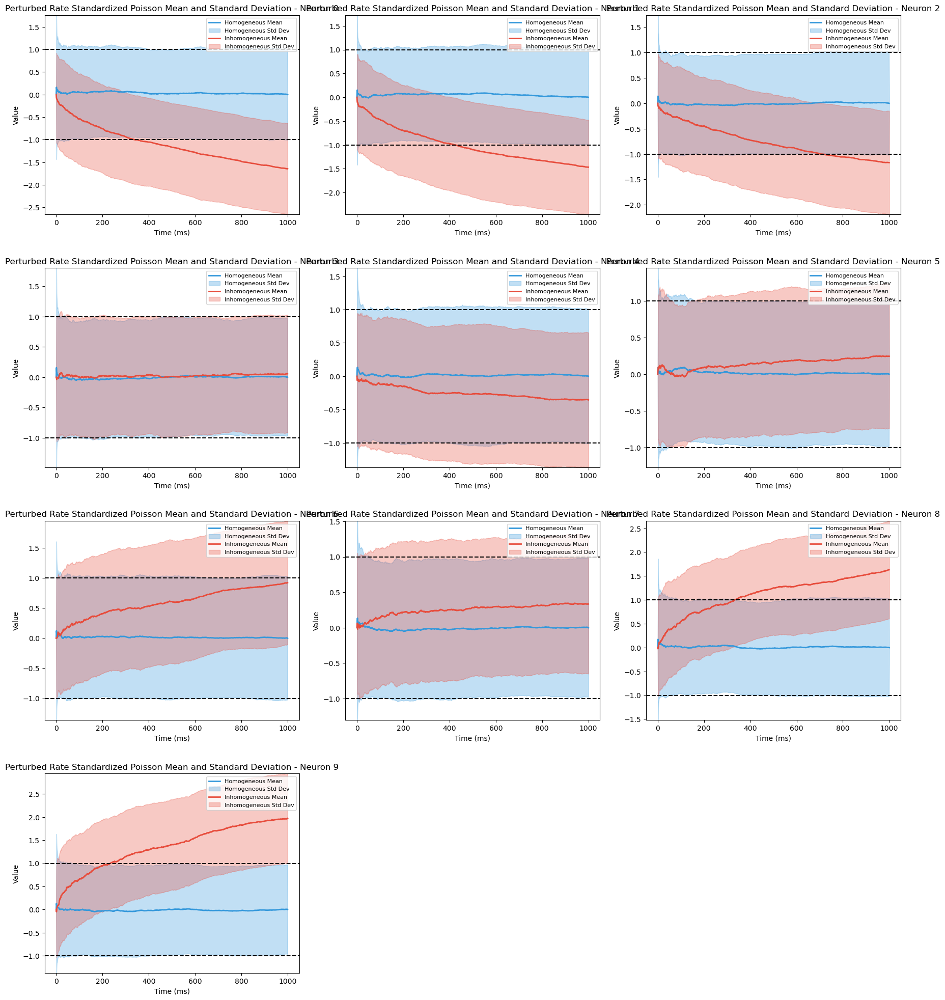

In [68]:
plot_multiple_stats(standardized_mean, perturbed_rate_standardized_mean_emp, standardized_std, standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation', show_hline=True, data_type='standardized')

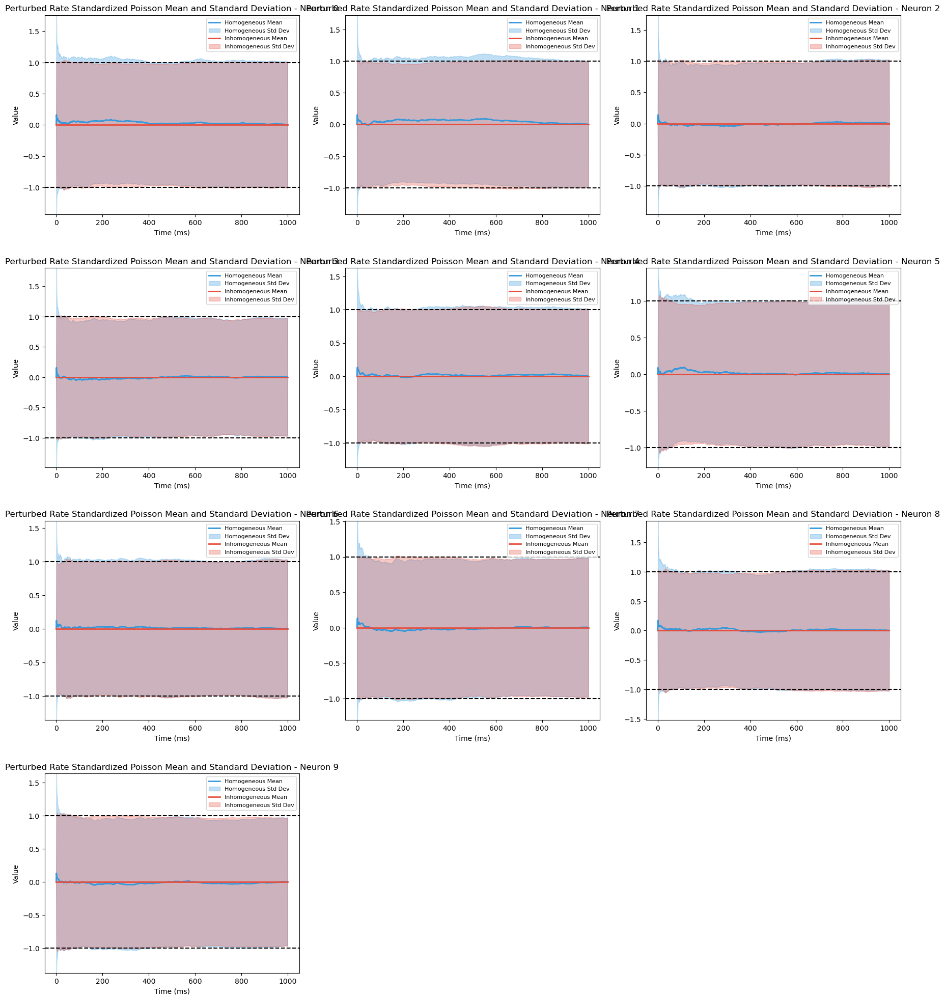

In [69]:
plot_multiple_stats(standardized_mean, perturbed_rate_standardized_mean_emp_test, standardized_std, standardized_std_emp, title = 'Perturbed Rate Standardized Poisson Mean and Standard Deviation', show_hline=True, data_type='standardized')

In [70]:
mean_check = check_mean_with_se(stands, expected_mean=0, confidence=0.95)
#print(mean_check)

mean_check_emp = check_mean_with_se(stands_emp, expected_mean=0, confidence=0.95)
#print(mean_check_emp)

In [71]:
multi_rate_mean_check = check_mean_with_se(multi_rate_stands, expected_mean=0, confidence=0.95)
multi_rate_mean_check_emp = check_mean_with_se(multi_rate_stands_emp, expected_mean=0, confidence=0.95)

In [72]:
perturbed_rate_mean_check = check_mean_with_se(perturbed_rate_stands, expected_mean=0, confidence=0.95)
perturbed_rate_mean_check_emp = check_mean_with_se(perturbed_rate_stands_emp, expected_mean=0, confidence=0.95)

In [73]:
serialized_count = serialize_counts(stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count.shape)
#print(np.mean(serialized_count))
t_stat, p_val_mean = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat)
#print(p_val_mean)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_emp = serialize_counts(stands_emp)
#print(serialized_count_emp.shape)
#print(np.mean(serialized_count_emp))
t_stat_emp, p_val_mean_emp = stats.ttest_1samp(serialized_count, np.mean(serialized_count))
#print(t_stat_emp)
#print(p_val_mean_emp)

In [74]:
multi_rate_serialized_count = serialize_counts(multi_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
multi_rate_t_stat, multi_rate_p_val_mean = stats.ttest_1samp(multi_rate_serialized_count, np.mean(multi_rate_serialized_count))

multi_rate_serialized_count_emp = serialize_counts(multi_rate_stands_emp)

multi_rate_t_stat_emp, multi_rate_p_val_mean_emp = stats.ttest_1samp(multi_rate_serialized_count_emp, np.mean(multi_rate_serialized_count_emp))

In [75]:
perturbed_rate_serialized_count = serialize_counts(perturbed_rate_stands) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
perturbed_rate_t_stat, perturbed_rate_p_val_mean = stats.ttest_1samp(perturbed_rate_serialized_count, np.mean(perturbed_rate_serialized_count))

perturbed_rate_serialized_count_emp = serialize_counts(perturbed_rate_stands_emp)

perturbed_rate_t_stat_emp, perturbed_rate_p_val_mean_emp = stats.ttest_1samp(perturbed_rate_serialized_count_emp, np.mean(perturbed_rate_serialized_count_emp))

In [76]:
#reshaped_stands = np.reshape(stands, (-1, stands.shape[1]), order='F')
# reshaped_stands = stands.transpose(1, 0, 2).reshape(stands.shape[1], -1)
reshaped_stands = np.transpose(stands, (1, 0, 2)).reshape(stands.shape[1], -1)
# transpose_stands = np.transpose(stands, (1, 0, 2))
#print(stands.shape)
#print(reshaped_stands.shape)

#reshaped_stands_emp = np.reshape(stands_emp, (-1, stands_emp.shape[1]), order='F')
# reshaped_stands_emp = stands.transpose(1, 0, 2).reshape(stands_emp.shape[1], -1)
reshaped_stands_emp = np.transpose(stands_emp, (1, 0, 2)).reshape(stands_emp.shape[1], -1)
#print(stands_emp.shape)
#print(reshaped_stands_emp.shape)

In [77]:
multi_rate_reshaped_stands = np.transpose(multi_rate_stands, (1, 0, 2)).reshape(multi_rate_stands.shape[1], -1)
multi_rate_reshaped_stands_emp = np.transpose(multi_rate_stands_emp, (1, 0, 2)).reshape(multi_rate_stands_emp.shape[1], -1)

In [78]:
perturbed_rate_reshaped_stands = np.transpose(perturbed_rate_stands, (1, 0, 2)).reshape(perturbed_rate_stands.shape[1], -1)
perturbed_rate_reshaped_stands_emp = np.transpose(perturbed_rate_stands_emp, (1, 0, 2)).reshape(perturbed_rate_stands_emp.shape[1], -1)

In [79]:
#print(transpose_stands.shape)
#print(transpose_stands[:,:,0])

In [80]:
#print(transpose_stands[:,:,0:3])

In [81]:
#print(reshaped_stands.shape)
#print(reshaped_stands[:,0])

In [82]:
#print(reshaped_stands[:,:5])

In [83]:
#### TESTING #####

In [84]:
test_stand = standardize_per_neuron(count, exclude=global_exclude)


=== Post-standardization checks (excluded t < 0 ) ===
Max |mean|: 1.167e-16 (should be close to 0)
Max |std - 1|: 1.221e-15 (should be close to 0)


In [85]:
#print(test_stand.shape)

In [86]:
cov_matrix = cov_standardized_data(reshaped_stands)
cov_matrix_emp = cov_standardized_data(reshaped_stands_emp)

In [87]:
multi_rate_cov_matrix = cov_standardized_data(multi_rate_reshaped_stands)
multi_rate_cov_matrix_emp = cov_standardized_data(multi_rate_reshaped_stands_emp)

In [88]:
perturbed_rate_cov_matrix = cov_standardized_data(perturbed_rate_reshaped_stands)
perturbed_rate_cov_matrix_emp = cov_standardized_data(perturbed_rate_reshaped_stands_emp)

array([[ 1.01698006e+00,  1.77507067e-02,  1.21699233e-02,
        -8.92042347e-04, -3.32546234e-03,  2.86552076e-02,
         3.01142269e-03, -1.03944320e-02,  1.64221620e-03,
        -1.94968383e-02],
       [ 1.77507067e-02,  1.01255573e+00,  7.22592213e-03,
        -5.42982157e-03, -1.73126823e-02, -1.97913636e-02,
         2.34579195e-02,  1.65953967e-03, -2.16903175e-02,
         6.83082136e-03],
       [ 1.21699233e-02,  7.22592213e-03,  9.83993673e-01,
        -5.23745747e-03, -5.70843875e-03, -3.20213200e-03,
         1.96715153e-02, -2.34619797e-02,  2.31295608e-03,
         1.66543173e-02],
       [-8.92042347e-04, -5.42982157e-03, -5.23745747e-03,
         9.46448993e-01,  5.10895479e-04, -3.44598576e-02,
        -1.50779793e-02,  2.80530152e-02,  9.07677288e-03,
         2.69295562e-02],
       [-3.32546234e-03, -1.73126823e-02, -5.70843875e-03,
         5.10895479e-04,  1.03918962e+00,  1.57969234e-02,
        -1.61837391e-02,  1.30762689e-02,  5.00467221e-02,
         1.

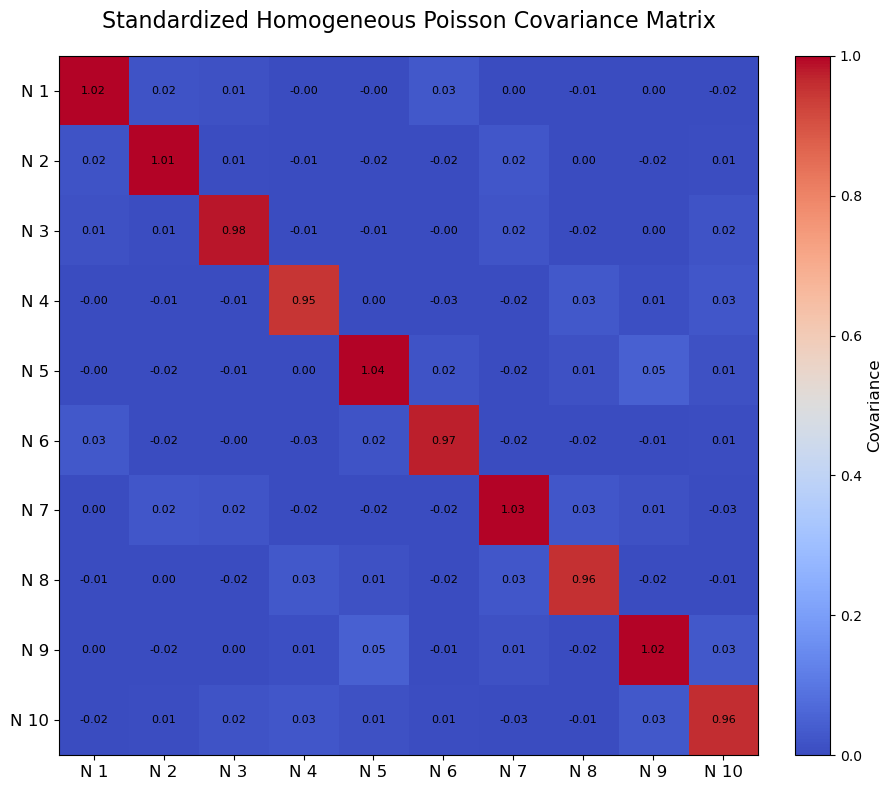

In [89]:
plot_covariance_matrix(cov_matrix, normalize=False, title='Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 9.89156065e-01,  1.56247748e-02,  1.25230848e-02,
        -4.42031140e-04, -3.81015348e-03,  2.77633090e-02,
         2.59415607e-03, -1.00508201e-02,  9.35177221e-04,
        -1.89888108e-02],
       [ 1.56247748e-02,  9.78439881e-01,  7.75048701e-03,
        -5.00258056e-03, -1.75207218e-02, -1.99358114e-02,
         2.23011523e-02,  2.43150894e-03, -2.17035814e-02,
         7.55804581e-03],
       [ 1.25230848e-02,  7.75048701e-03,  9.84977819e-01,
        -5.49023328e-03, -5.73328130e-03, -3.00211075e-03,
         1.95854345e-02, -2.41288608e-02,  2.56949578e-03,
         1.66449486e-02],
       [-4.42031140e-04, -5.00258056e-03, -5.49023328e-03,
         9.48695026e-01,  6.63969199e-04, -3.40193604e-02,
        -1.49989320e-02,  2.80736711e-02,  9.19165644e-03,
         2.70275947e-02],
       [-3.81015348e-03, -1.75207218e-02, -5.73328130e-03,
         6.63969199e-04,  1.02471690e+00,  1.55776950e-02,
        -1.65181518e-02,  1.26564226e-02,  4.94042218e-02,
         1.

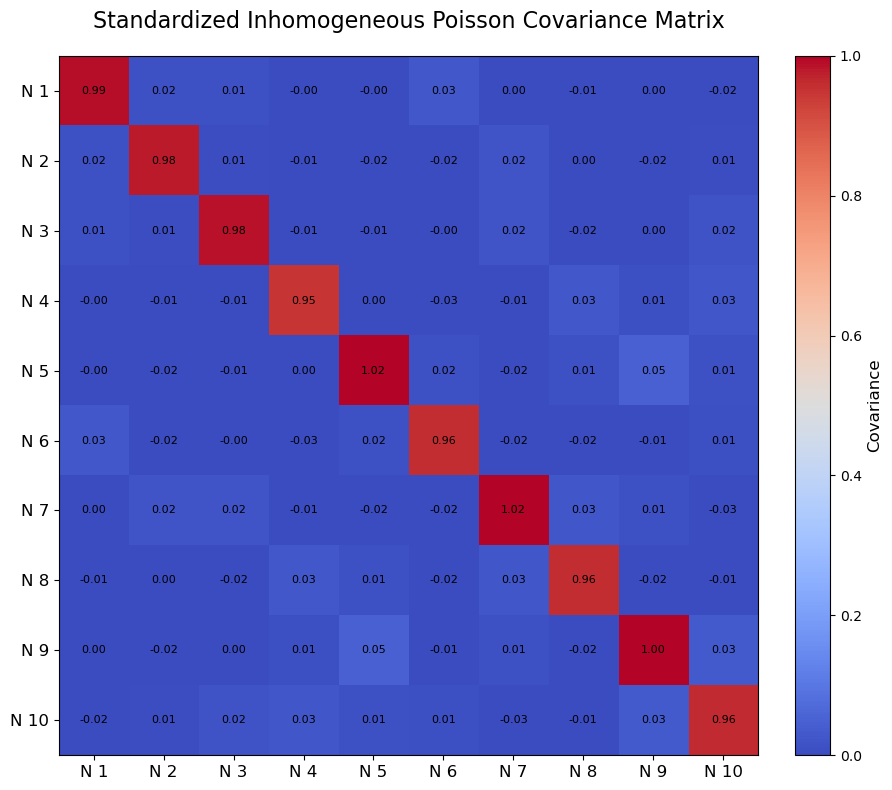

In [90]:
plot_covariance_matrix(cov_matrix_emp, normalize=False, title='Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.70443481,  0.9502886 ,  0.69459861,  0.41952227,  0.14442737,
        -0.11213376, -0.43396987, -0.70267442, -1.04642693, -1.26284165],
       [ 0.9502886 ,  1.33192125,  0.57376696,  0.31180779,  0.11649936,
        -0.1078121 , -0.38155814, -0.55260081, -0.82846763, -1.02425754],
       [ 0.69459861,  0.57376696,  1.13771536,  0.25250628,  0.11791582,
        -0.09983313, -0.25673419, -0.48428072, -0.58600002, -0.75812649],
       [ 0.41952227,  0.31180779,  0.25250628,  0.97080127,  0.03260198,
        -0.03960058, -0.15995362, -0.24978659, -0.37115225, -0.44943401],
       [ 0.14442737,  0.11649936,  0.11791582,  0.03260198,  0.9493982 ,
        -0.06700041, -0.09188801, -0.08853691, -0.14733107, -0.1953303 ],
       [-0.11213376, -0.1078121 , -0.09983313, -0.03960058, -0.06700041,
         1.0825661 ,  0.0670811 ,  0.05398999,  0.11544973,  0.14326846],
       [-0.43396987, -0.38155814, -0.25673419, -0.15995362, -0.09188801,
         0.0670811 ,  1.36178109,  0.24957214

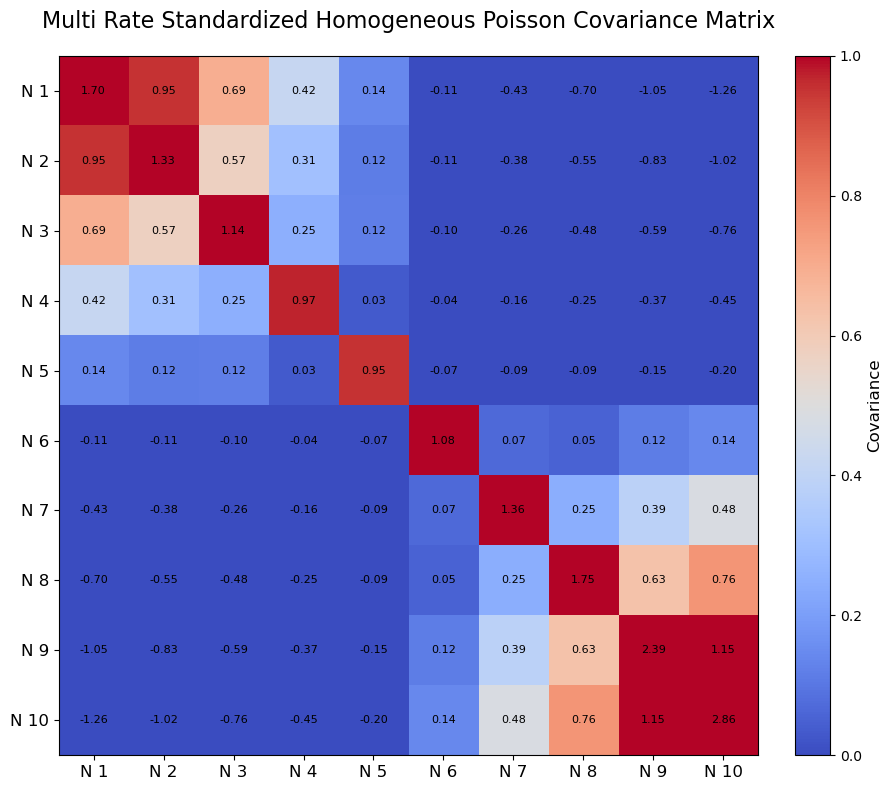

In [91]:
plot_covariance_matrix(multi_rate_cov_matrix, normalize=False, title='Multi Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.73555151,  1.00651497,  0.70391655,  0.42386154,  0.16293431,
        -0.1011391 , -0.42879555, -0.72552251, -1.05193755, -1.30633678],
       [ 1.00651497,  1.37674863,  0.59307017,  0.32252785,  0.13428324,
        -0.10099219, -0.38473418, -0.58410233, -0.85134538, -1.08181438],
       [ 0.70391655,  0.59307017,  1.13623253,  0.2503739 ,  0.12640837,
        -0.09134418, -0.24709709, -0.48781066, -0.5765361 , -0.76622508],
       [ 0.42386154,  0.32252785,  0.2503739 ,  0.97281503,  0.03732725,
        -0.03499583, -0.1541048 , -0.25098632, -0.36532652, -0.45266774],
       [ 0.16293431,  0.13428324,  0.12640837,  0.03732725,  0.94116878,
        -0.0661128 , -0.09566704, -0.09905825, -0.1586803 , -0.21442265],
       [-0.1011391 , -0.10099219, -0.09134418, -0.03499583, -0.0661128 ,
         1.06359928,  0.05979431,  0.04717239,  0.10310219,  0.13023893],
       [-0.42879555, -0.38473418, -0.24709709, -0.1541048 , -0.09566704,
         0.05979431,  1.33437525,  0.24484959

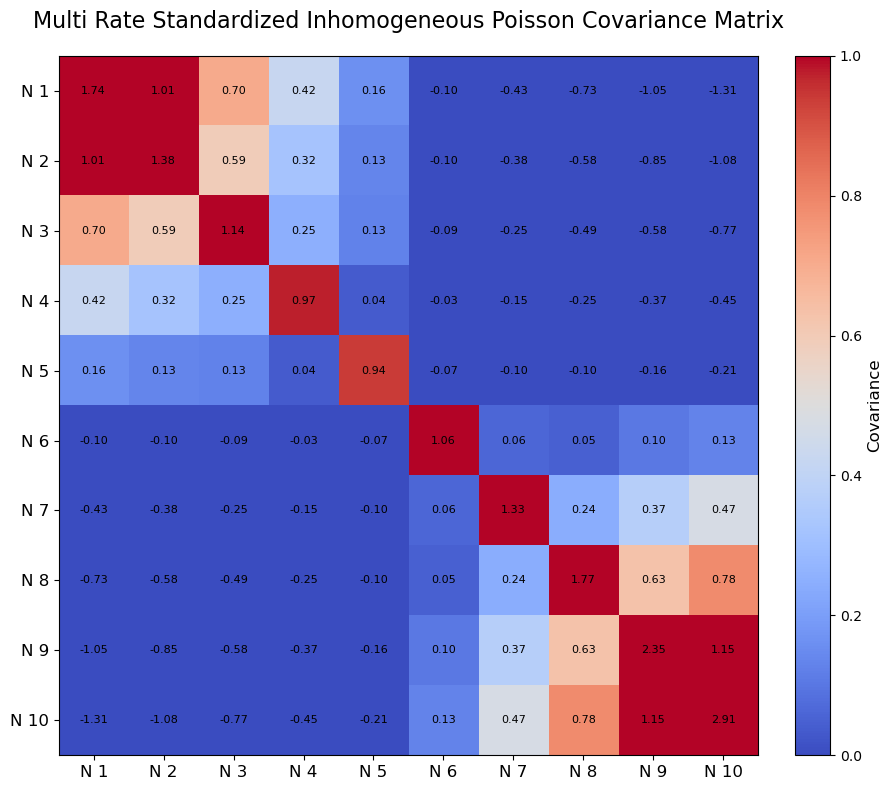

In [92]:
plot_covariance_matrix(multi_rate_cov_matrix_emp, normalize=False, title='Multi Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.81332068e+00,  1.19003668e+00,  9.37615197e-01,
        -5.03121528e-02,  2.70377507e-01, -1.97508016e-01,
        -7.29054865e-01, -3.17701433e-01, -1.39990603e+00,
        -1.65720579e+00],
       [ 1.19003668e+00,  1.61400579e+00,  8.47574014e-01,
        -3.90226196e-02,  2.65609185e-01, -1.66666649e-01,
        -6.92899753e-01, -2.53841270e-01, -1.23114656e+00,
        -1.46417301e+00],
       [ 9.37615197e-01,  8.47574014e-01,  1.25420122e+00,
        -7.14092518e-03,  1.94588586e-01, -1.48920219e-01,
        -5.44641770e-01, -2.28179002e-01, -9.57690268e-01,
        -1.17837130e+00],
       [-5.03121528e-02, -3.90226196e-02, -7.14092518e-03,
         9.72251124e-01, -6.17549118e-02,  3.10876880e-04,
         2.37085100e-02,  4.57919566e-03,  2.07237627e-02,
         1.56230982e-02],
       [ 2.70377507e-01,  2.65609185e-01,  1.94588586e-01,
        -6.17549118e-02,  9.21247072e-01, -4.94513210e-02,
        -1.78116967e-01, -5.39209837e-02, -3.42401931e-01,
        -3.

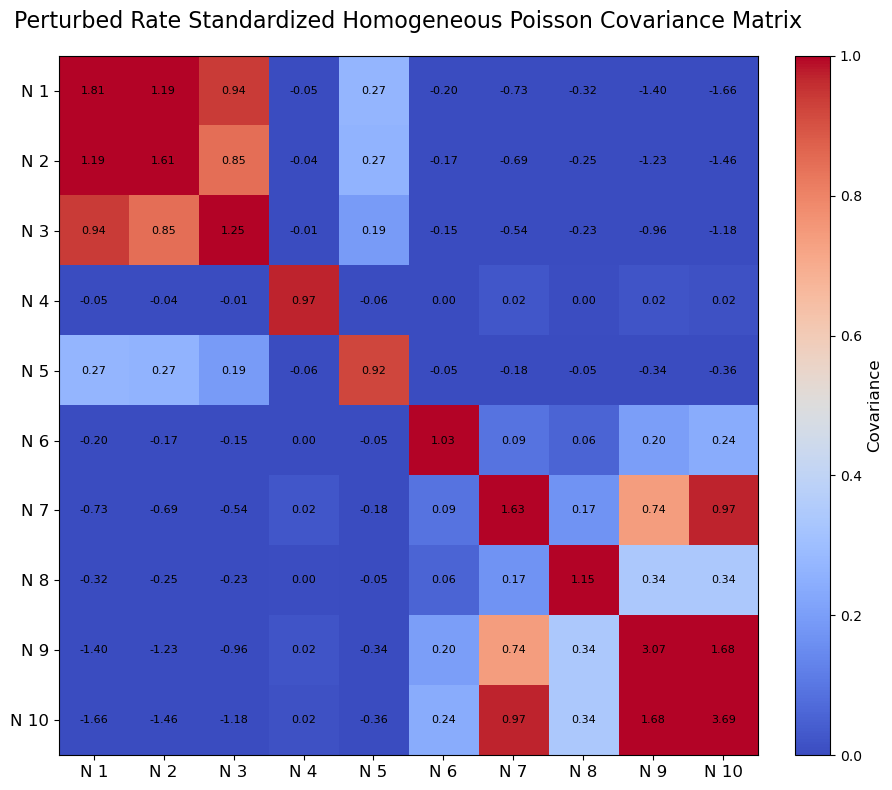

In [93]:
plot_covariance_matrix(perturbed_rate_cov_matrix, normalize=False, title='Perturbed Rate Standardized Homogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.84536384e+00,  1.24959933e+00,  9.49665666e-01,
        -5.33453569e-02,  2.91129283e-01, -1.86014502e-01,
        -7.25471688e-01, -3.32325481e-01, -1.40917927e+00,
        -1.70689274e+00],
       [ 1.24959933e+00,  1.66862602e+00,  8.71542874e-01,
        -4.17901959e-02,  2.88402214e-01, -1.59199269e-01,
        -6.99362801e-01, -2.71502155e-01, -1.25920124e+00,
        -1.53185640e+00],
       [ 9.49665666e-01,  8.71542874e-01,  1.25080712e+00,
        -8.64201870e-03,  2.04885297e-01, -1.38849059e-01,
        -5.31877417e-01, -2.33672587e-01, -9.43867162e-01,
        -1.18965150e+00],
       [-5.33453569e-02, -4.17901959e-02, -8.64201870e-03,
         9.75362306e-01, -6.27896264e-02,  3.85603949e-04,
         2.49141270e-02,  5.49565925e-03,  2.36836860e-02,
         1.95564233e-02],
       [ 2.91129283e-01,  2.88402214e-01,  2.04885297e-01,
        -6.27896264e-02,  9.16035566e-01, -4.86047884e-02,
        -1.83049738e-01, -5.94256700e-02, -3.55191980e-01,
        -3.

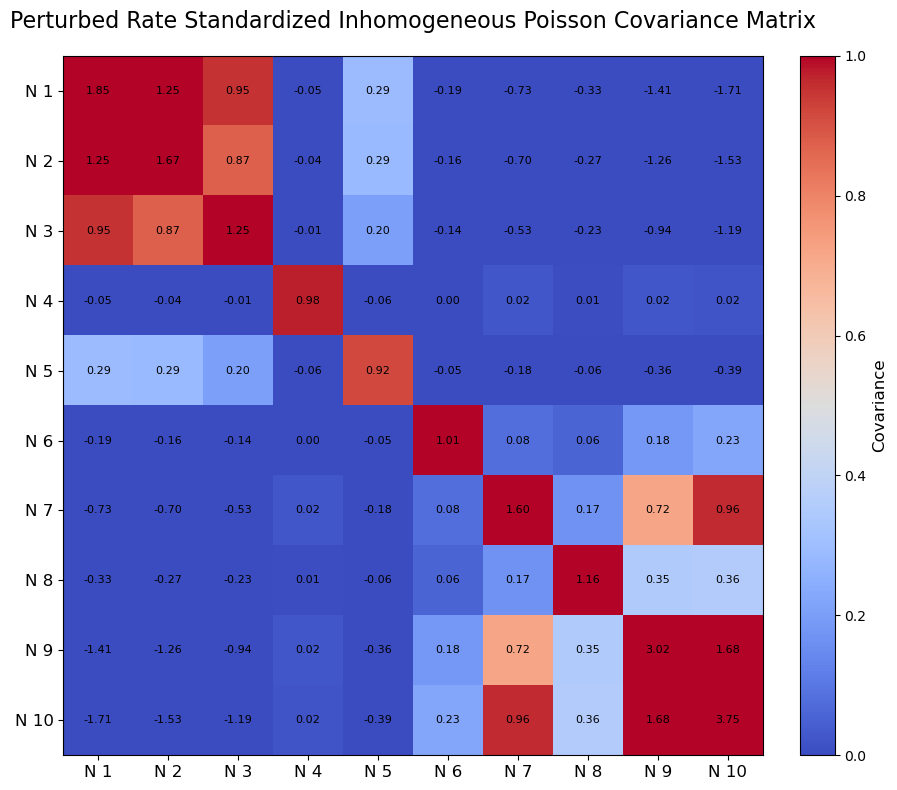

In [94]:
plot_covariance_matrix(perturbed_rate_cov_matrix_emp, normalize=False, title='Perturbed Rate Standardized Inhomogeneous Poisson Covariance Matrix', cmap='coolwarm', annot=True, neuron_labels=None)

In [95]:
#### TESTING END #####

In [96]:
#hotelling_result = hotelling_t2_test(reshaped_stands, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result)
#hotelling_result_emp = hotelling_t2_test(reshaped_stands_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_emp)

In [97]:
#good_result = stats.goodness_of_fit(stats.norm, serialized_count, statistic='ad', n_mc_samples=9999, rng=None)
# Anderson-Darling test (good for normality)
# Number of Monte Carlo samples
# Random number generator (None for fresh results)

#print(f"Statistic: {good_result.statistic}")
#print(f"P-value: {good_result.pvalue}")
#print(f"Location (mean): {good_result.fit_result.params.loc}")
#print(f"Scale (std dev): {good_result.fit_result.params.scale}")

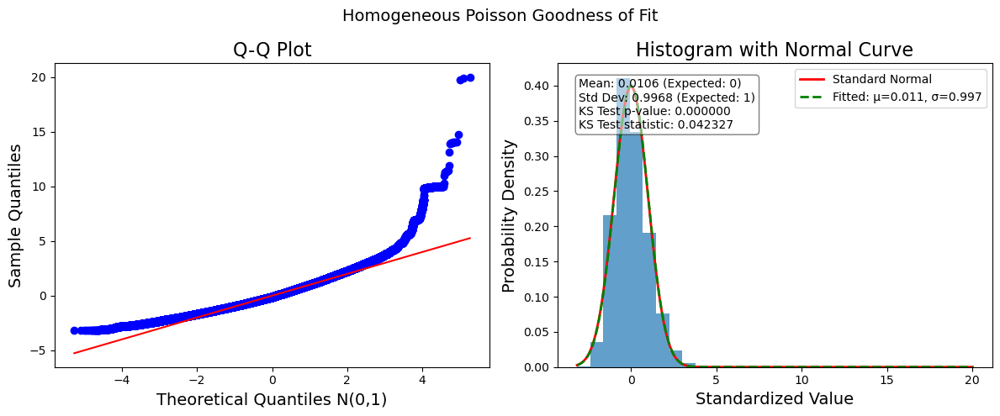

In [98]:
goodness, fig = analyze_poisson_goodness_of_fit(serialized_count, plot_title="Homogeneous Poisson Goodness of Fit", sample_limit=5000)

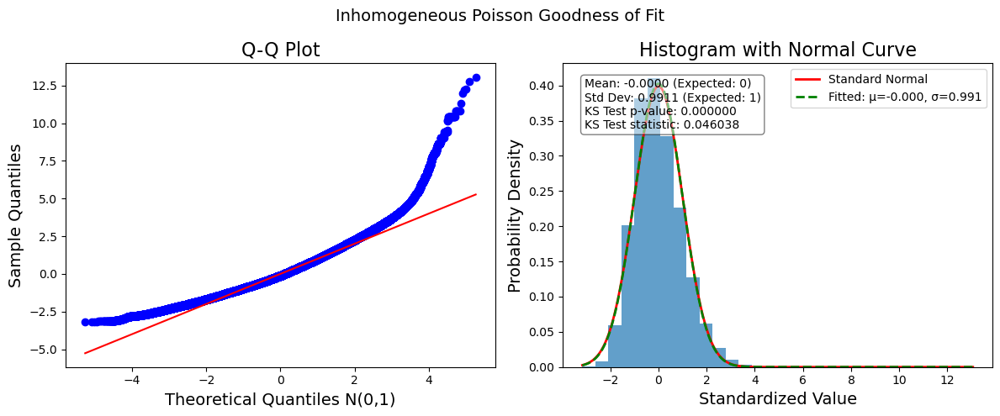

In [99]:
goodness_emp, fig_emp = analyze_poisson_goodness_of_fit(serialized_count_emp, plot_title="Inhomogeneous Poisson Goodness of Fit", sample_limit=5000)

In [100]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)
#rv = multivariate_normal(mean = [0,0], cov = cov_matrix, allow_singular = False)
#rv_emp = multivariate_normal(mean = [0,0], cov = cov_matrix_emp, allow_singular=False)
#print(rv)
#print(rv_emp)

# this is creating its own model, from this we can test if the data has goodness of fit

In [101]:
#cov_matrix, diagonal_ones = covariance_diagonal(reshaped_stands, tol=1e-8)
#print(cov_matrix)
#print(diagonal_ones)
#cov_matrix_emp, diagonal_ones_emp = covariance_diagonal(reshaped_stands_emp, tol=1e-8)
#print(cov_matrix_emp)
#print(diagonal_ones_emp)

In [102]:
#normal_loglikelihood = compute_neural_multivariate_log_likelihood(reshaped_stands)
#print(normal_loglikelihood)

#normal_loglikelihood_emp = compute_neural_multivariate_log_likelihood(reshaped_stands_emp)
#print(normal_loglikelihood_emp)

LogLikelihood experiments, Chi Square statistics, T tests, and zscores

In [104]:
total_log_likelihood, log_likelihood_per_sample = log_likelihood(empirical_mean, theoretical_means)
print(total_log_likelihood)
print(log_likelihood_per_sample)
# normalize data first (so we don't have any negative values, then we can do log likelihood)

#The neural spike patterns that are observed are unlikely to have come from the model...I got around -1600 log likelihood...

-16155.418672475758
[-1622.23177384 -1622.58485246 -1612.00331255 -1616.93925256
 -1620.70815378 -1623.35856808 -1606.86956392 -1609.66964631
 -1612.56404349 -1608.48950548]


In [105]:
perturbed_total_log_likelihood, perturbed_log_likelihood_per_sample = log_likelihood(perturbed_rate_empirical_mean, theoretical_means)
print(perturbed_total_log_likelihood)
print(perturbed_log_likelihood_per_sample)
# normalize data first (so we don't have any negative values, then we can do log likelihood)

#The neural spike patterns that are observed are unlikely to have come from the model...I got around -1600 log likelihood...

-19468.659989858254
[-2109.0907956  -1970.17501235 -1796.49747814 -1623.0751069
 -1594.01291623 -1666.94282987 -1913.48979719 -1695.00128151
 -2418.71252631 -2681.66224575]


In [106]:
test_total_log_likelihood, test_log_likelihood_per_sample = log_likelihood(theoretical_means, theoretical_means)
print(test_total_log_likelihood)
print(test_log_likelihood_per_sample)
# Note: This log likelihood has relative entropy
## Why the log likelihood per sample is different, the data is stochastic! ##
# we are doing this : log_likelihood = k*log(k) - k - log(k!) , so k = λ
#                o.g. log likelihood = k*log(λ) - λ - log(k!)
# even a perfect match is going to vary per sample because each sample is stochastic #

-16119.13139372155
[-1611.57775078 -1607.97959749 -1613.80754279 -1619.15494607
 -1616.02729793 -1617.13344    -1602.08194276 -1611.71740856
 -1608.12027794 -1611.5311894 ]


In [107]:
multivar_log_likelihood, multivar_log_likelihood_per_sample, average_log_likelihood = multivariate_log_likelihood(reshaped_stands, mean = np.nan, cov = np.nan)
print(multivar_log_likelihood)
print(multivar_log_likelihood_per_sample)
print(average_log_likelihood)
len(multivar_log_likelihood_per_sample)

# note, there are 99900 samples and the total sum of those is very large.
#print(multivar_log_likelihood/len(multivar_log_likelihood_per_sample))

-14143681.961020844
[ -9.23924383  -9.28910233  -9.33896083 ... -11.18042795 -11.17489355
 -11.16947004]
-1414368.1961020844


999000

In [108]:
multivar_log_likelihood_emp, multivar_log_likelihood_per_sample_emp, average_log_likelihood_emp = multivariate_log_likelihood(reshaped_stands_emp, mean = np.nan, cov = np.nan)
print(multivar_log_likelihood_emp)
print(multivar_log_likelihood_per_sample_emp)
print(average_log_likelihood_emp)
len(multivar_log_likelihood_per_sample)

reshaped_stands_emp.shape

-14101151.789399816
[ -9.25188533  -9.30688533  -9.36238533 ... -11.17321982 -11.16687077
 -11.1641571 ]
-1410115.1789399816


(10, 1000000)

In [109]:
## Multivariate LogLikelihood with zero vector of len(num_neurons), aka 10) ##
multivar_log_likelihood_zero, multivar_log_likelihood_per_sample_zero, average_log_likelihood_zero = multivariate_log_likelihood(np.zeros((10, 1)), mean = np.nan, cov = np.nan)
print(multivar_log_likelihood_zero)
print(multivar_log_likelihood_per_sample_zero)
print(average_log_likelihood_zero)
len(multivar_log_likelihood_per_sample)

-9.189385332046726
-9.189385332046726
-0.9189385332046726


999000

In [110]:
# difference between multivariate log likelihood of expected - observed data.
diff = multivar_log_likelihood_emp - multivar_log_likelihood
print(diff)

print(diff/len(multivar_log_likelihood_per_sample)) # small difference per sample, less than 1.

42530.171621028334
0.042572744365393725


In [111]:
reshaped_stands_resized, reshaped_stands_emp_resized = match_array_shapes(reshaped_stands, reshaped_stands_emp)
# resized makes sure that the standardized observed and expected data are the same shape

Original shapes: (10, 999000) and (10, 1000000)
Final shapes: (10, 999000) and (10, 999000)


In [112]:
perturbed_reshaped_stands_resized, perturbed_reshaped_stands_emp_resized = match_array_shapes(perturbed_rate_reshaped_stands, perturbed_rate_reshaped_stands_emp)
# resized makes sure that the standardized observed and expected data are the same shape

Original shapes: (10, 999000) and (10, 1000000)
Final shapes: (10, 999000) and (10, 999000)


In [113]:
stands.shape

baseline_10Hz_neuron = stands[:,0,:] / num_neurons
baseline_10Hz_neuron_emp = stands_emp[:,0,:] / num_neurons

baseline_10Hz_neuron.shape
baseline_10Hz_neuron_emp.shape

perturbed_rate_stands_with_self_center.shape

perturbed_5Hz_neuron = perturbed_rate_stands_with_self_center[:, 0, :] / num_neurons
perturbed_15Hz_neuron = perturbed_rate_stands_with_self_center[:, -1, :] / num_neurons

perturbed_5Hz_neuron.shape
perturbed_15Hz_neuron.shape

perturbed_rate_stands_emp_with_self_center.shape

perturbed_5Hz_neuron_emp = perturbed_rate_stands_emp_with_self_center[:, 0, :] / num_neurons
perturbed_15Hz_neuron_emp = perturbed_rate_stands_emp_with_self_center[:, -1, :] / num_neurons

perturbed_5Hz_neuron_emp.shape
perturbed_15Hz_neuron_emp.shape

(1000, 1000)

In [114]:
baseline_resized, baseline_resized_emp = match_array_shapes(baseline_10Hz_neuron, baseline_10Hz_neuron_emp)

Original shapes: (1000, 999) and (1000, 1000)
Final shapes: (1000, 999) and (1000, 999)


In [115]:
perturbed_rate_stands_with_self_center_resized_5, perturbed_rate_stands_emp_with_self_center_resized_5 = match_array_shapes(perturbed_5Hz_neuron, perturbed_5Hz_neuron_emp)

Original shapes: (1000, 999) and (1000, 1000)
Final shapes: (1000, 999) and (1000, 999)


In [116]:
perturbed_rate_stands_with_self_center_resized_15, perturbed_rate_stands_emp_with_self_center_resized_15 = match_array_shapes(perturbed_15Hz_neuron, perturbed_15Hz_neuron_emp)

Original shapes: (1000, 999) and (1000, 1000)
Final shapes: (1000, 999) and (1000, 999)


In [117]:
### Chi square test can have bins and minimum expected input by the user ###
### bins (resolution): more bins show a detailed comparison, fewer bins show a broader comparison ###
### min_expected: check used to empty bins with less than min_expected counts
### 50 bins is considered a moderate resolution, 5 minimum expected counts per bin

In [118]:
proper_chi_square_test(reshaped_stands_resized, reshaped_stands_emp_resized, n_bins=30, min_expected=5)
# 'chi_square_statistic': 244.68781663684993
# 'p_value': 4.777468454985577e-40 (aka statistically significant p < 0.05)
# 'degrees_of_freedom': 21, (22 - 1 = 21)
# 'bins_created': 30
# 'bins_used': 22
# 'bins_removed': 8 (too few expected counts)
# The frequency distributions of observed and expected standardized data are different

{'chi_square_statistic': 4109.37021936784,
 'p_value': 0.0,
 'degrees_of_freedom': 18,
 'bins_created': 30,
 'bins_used': 19,
 'bins_removed': 11}

In [119]:
proper_chi_square_test(reshaped_stands_resized, perturbed_reshaped_stands_emp_resized, n_bins=30, min_expected=5)
# 'chi_square_statistic': 244.68781663684993
# 'p_value': 4.777468454985577e-40 (aka statistically significant p < 0.05)
# 'degrees_of_freedom': 21, (22 - 1 = 21)
# 'bins_created': 30
# 'bins_used': 22
# 'bins_removed': 8 (too few expected counts)
# The frequency distributions of observed and expected standardized data are different

# center with the data's own mean, need zero mean, check please
# but standardize with the null model, theoretical std dev of the null model, estimate std dev afterwards
# might need to do log chi-square

# one perturbation mean above, one perturbation mean below

{'chi_square_statistic': 979073.0619777294,
 'p_value': 0.0,
 'degrees_of_freedom': 17,
 'bins_created': 30,
 'bins_used': 18,
 'bins_removed': 12}

In [120]:
proper_chi_square_test(baseline_resized, baseline_resized_emp, n_bins=30, min_expected=5)

{'chi_square_statistic': 1362.5180609301983,
 'p_value': 1.0027252333070759e-275,
 'degrees_of_freedom': 21,
 'bins_created': 30,
 'bins_used': 22,
 'bins_removed': 8}

In [121]:
proper_chi_square_test(perturbed_rate_stands_with_self_center_resized_5, perturbed_rate_stands_emp_with_self_center_resized_5, n_bins=30, min_expected=5)

{'chi_square_statistic': 249.85881357922358,
 'p_value': 5.811810328390422e-48,
 'degrees_of_freedom': 10,
 'bins_created': 30,
 'bins_used': 11,
 'bins_removed': 19}

In [122]:
proper_chi_square_test(perturbed_rate_stands_with_self_center_resized_15, perturbed_rate_stands_emp_with_self_center_resized_15, n_bins=30, min_expected=5)

{'chi_square_statistic': 648.5557795553158,
 'p_value': 4.314157299780671e-120,
 'degrees_of_freedom': 26,
 'bins_created': 30,
 'bins_used': 27,
 'bins_removed': 3}

In [123]:
### T test can have 'one_sample', 'two_sample', or 'paired' test type ###

In [124]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 2.9680692646417373
# 'p_value': 0.00299683895859134
# 'target_mean': 0.0
# 'sample_mean': 0.003010765946416713

## estimated standardized data compared with the estimated mean.

{'t_statistic': 33.62973325437988,
 'p_value': 6.370018369010358e-248,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': 0.010605759471512986}

In [125]:
t_test(reshaped_stands_emp_resized, reshaped_stands_emp_resized, test_type='one_sample', target_mean=0)
# 't_statistic': 9.031514925174204e-16
# 'p_value': 0.9999999999999993
# 'target_mean': 0.0
# ''sample_mean': 9.10405106879808e-19

## observed standardized data compared with the known mean.

{'t_statistic': -0.9411365045386205,
 'p_value': 0.346634933261488,
 'test_type': 'one_sample_vs_mean',
 'target_mean': 0.0,
 'sample_mean': -0.0002951594860115303}

In [126]:
### Z stat info ###
#data_flat = reshaped_stands_emp.flatten()
#n = len(data_flat)

#sample_std = np.std(data_flat, ddof=1)
#std_error = sample_std / np.sqrt(n)
#std_error

In [127]:
# z_stat = (sample_mean - population_mean) / std_error
#Zstat = (np.mean(reshaped_stands_emp) - 0)/std_error
#Zstat

In [128]:
# Flatten baseline model
data_flat = stands[0,0,:].flatten()/num_neurons
#data_flat = reshaped_stands.flatten()
#data_flat_emp = reshaped_stands_emp.flatten()
data_flat_emp = stands_emp[0,0,:].flatten()/num_neurons
# [trials, num_neurons, time]


# Compute cumulative Z-statistics and p-values for baseline (correct distribution)
z_stats_baseline, p_values_baseline = cumulative_z_test(data_flat, population_mean=0)
z_stats_baseline_emp, p_values_baseline_emp = cumulative_z_test(data_flat_emp, population_mean=0)

# we can choose how many neurons to use, up to n = num_neurons

In [129]:
# Flatten perturbed model
#perturbed_data_flat = perturbed_rate_reshaped_stands.flatten()
#perturbed_data_flat_emp = perturbed_rate_reshaped_stands_emp.flatten()
perturbed_data_flat = perturbed_rate_stands[0,0,:].flatten()/num_neurons
perturbed_data_flat_emp = perturbed_rate_stands_emp[0,0,:].flatten()/num_neurons

# Compute cumulative Z-statistics and p-values for perturbed (incorrect distribution)
z_stats_perturbed, p_values_perturbed = cumulative_z_test(perturbed_data_flat, population_mean=0)
z_stats_perturbed_emp, p_values_perturbed_emp = cumulative_z_test(perturbed_data_flat_emp, population_mean=0)

# we can choose how many neurons to use, up to n = num_neurons


Threshold Crossing Analysis:



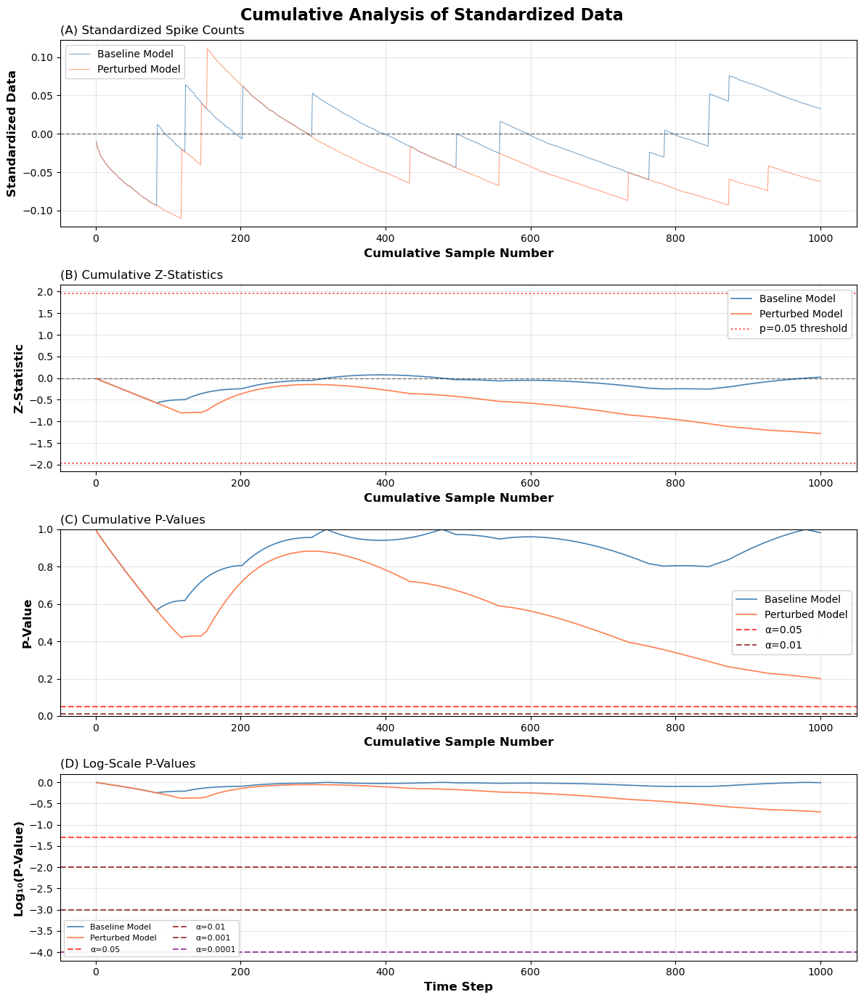

In [130]:
fig, axes, threshold_info = plot_cumulative_analysis(data_flat=data_flat_emp,z_stats_baseline=z_stats_baseline_emp,p_values_baseline=p_values_baseline_emp,data_flat_pert=perturbed_data_flat_emp,z_stats_pert=z_stats_perturbed_emp,p_values_pert=p_values_perturbed_emp,title='Cumulative Analysis of Standardized Data',baseline_label='Baseline Model',perturbed_label='Perturbed Model',threshold=1e-4,save_path=None)
plt.show()

In [131]:
threshold_info

{'alpha_crossings': {}}

In [132]:
# fig, axes = plot_cumulative_analysis(data_flat=data_flat_emp, z_stats_baseline=z_stats_baseline_emp, p_values_baseline=p_values_baseline_emp, title='Cumulative Analysis of Standardized Data', baseline_label='Baseline Model', save_path=None  # or 'path/to/save/figure.png')
#plot_cumulative_analysis(data_flat=data_flat_emp, z_stats_baseline=z_stats_baseline_emp, p_values_baseline=p_values_baseline_emp, title='Cumulative Analysis of Poisson Standardized Data', baseline_label='Baseline Model', save_path=None)
#plt.show()

In [133]:
# fig, axes = plot_cumulative_analysis(data_flat=data_flat_emp, z_stats_baseline=z_stats_baseline_emp, p_values_baseline=p_values_baseline_emp, title='Cumulative Analysis of Standardized Data', baseline_label='Baseline Model', save_path=None  # or 'path/to/save/figure.png')
#plot_cumulative_analysis(data_flat=perturbed_data_flat_emp, z_stats_baseline=z_stats_perturbed_emp, p_values_baseline=p_values_perturbed_emp, title='Cumulative Analysis of Perturbed Standardized Data', baseline_label='Perturbed Model', save_path=None)
#plt.show()

In [134]:
# np.sum(data_flat_emp)

In [135]:
#plot(data_flat)

In [136]:
#plot(np.cumsum(data_flat_emp))

In [137]:
#plot(z_stats_baseline[1:1000])

In [138]:
#plot(p_values_baseline[1:8000])

In [139]:
#plot(p_values_baseline_emp[1:8000])

In [140]:
#plot(log10(p_values_baseline[1:8000]))

In [141]:
#plot(z_stats_perturbed[1:1000])

In [142]:
#plot(log10(p_values_perturbed[1:1000]))

In [143]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='two_sample', target_mean=None)
# Are the group means different?
# 't_statistic': 2.1053251974447873
# 'p_value': 0.03526313467995148 (aka statistically significant p < 0.05)
# The datasets have significantly different means

{'t_statistic': 24.509447384302867,
 'p_value': 1.1767413613380203e-132,
 'test_type': 'two_sample'}

In [144]:
t_test(reshaped_stands_resized, reshaped_stands_emp_resized, test_type='paired', target_mean=None)
# Are the paired differences different from zero
# 't_statistic': 36.627117732234396
# 'p_value': 1.6617750264560706e-293 (aka statistically significant p < 0.05)
# The datasets have significantly paired differences

{'t_statistic': 29.9653653950041,
 'p_value': 2.831985473823581e-197,
 'test_type': 'paired'}

Theoretical and Empirical stats of excitatory counts.

In [146]:
# empirical_mean_ex = empirical_means(count_ex)
empirical_mean_ex = count_ex.mean(axis=0)
#print(empirical_mean_ex)
#print(empirical_mean_ex.shape)
count_rate_ex = empirical_mean_ex[:, -1]

# empirical_std_dev_ex = std_dev_empirical_mean(empirical_mean_ex, num_samples, count_ex)
#empirical_std_dev_ex = count_ex.std(axis=0, ddof=1)
empirical_std_dev_ex = np.sqrt(empirical_mean_ex)
#print(empirical_std_dev_ex)
#print(empirical_std_dev_ex.shape)

empirical_lower_bound_ex, empirical_upper_bound_ex = confidence_intervals(empirical_mean_ex, empirical_std_dev_ex, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_ex)
# print(empirical_upper_bound_sim_ex)

In [147]:
exclude_times_ex, global_exclude_ex = last_zero_std_time(empirical_std_dev_ex, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [148]:
theoretical_means_sim_ex = calculate_theoretical_mean(count_rate_ex, time)
#print(theoretical_means_sim_ex)
#print(theoretical_means_sim_ex.shape)

theoretical_std_dev_sim_ex = calculate_theoretical_std_dev(theoretical_means_sim_ex)
#print(theoretical_std_dev_sim_ex)
#print(theoretical_std_dev_sim_ex.shape)

theoretical_lower_bound_sim_ex, theoretical_upper_bound_sim_ex = confidence_intervals(theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_ex)
# print(theoretical_upper_bound_sim_ex)

In [149]:
res_var_ex = variance_of_residuals(empirical_mean_ex, theoretical_means_sim_ex)
#print(res_var_ex)

In [150]:
stands_ex = standardize_counts_loop(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, num_neurons, exclude = 1)
#print(stands_ex)
#print(stands_ex.shape)

stands_ex_emp = standardize_counts_loop(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, num_neurons, global_exclude_ex)
#print(stands_ex_emp)
#print(stands_ex_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_ex = np.mean(stands_ex)
standardized_std_global_ex = np.std(stands_ex)

standardized_mean_emp_global_ex = np.mean(stands_ex_emp)
standardized_std_emp_global_ex = np.std(stands_ex_emp)

standardized_mean_ex = np.mean(stands_ex, axis=0)
standardized_std_ex = np.std(stands_ex, axis=0, ddof = 1)

standardized_mean_ex_emp = np.mean(stands_ex_emp, axis = 0)
standardized_std_ex_emp = np.std(stands_ex_emp, axis = 0, ddof = 1)

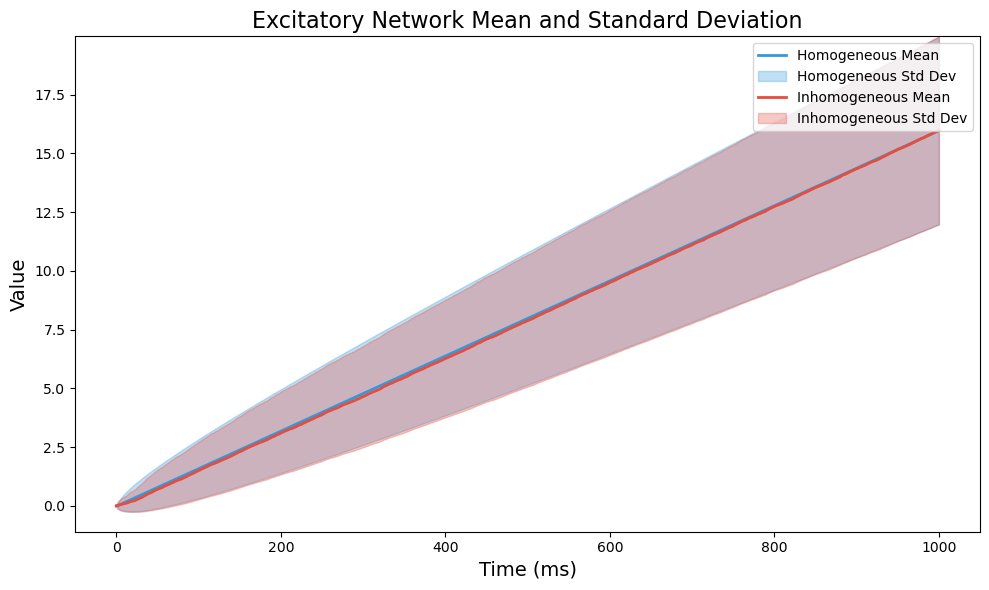

In [151]:
plot_stats(theoretical_means_sim_ex, empirical_mean_ex, theoretical_std_dev_sim_ex, empirical_std_dev_ex, title = 'Excitatory Network Mean and Standard Deviation', show_hline=False, data_type='standardized')

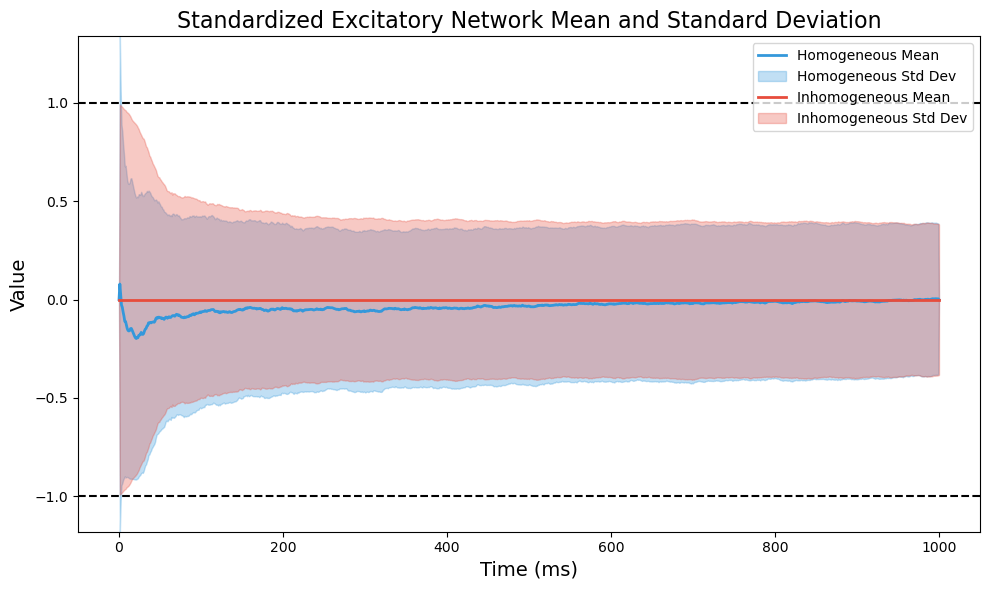

In [152]:
plot_stats(standardized_mean_ex, standardized_mean_ex_emp, standardized_std_ex, standardized_std_ex_emp, title = 'Standardized Excitatory Network Mean and Standard Deviation', show_hline=True, data_type='standardized')

In [153]:
mean_check_ex = check_mean_with_se(stands_ex, expected_mean=0, confidence=0.95)
#print(mean_check_ex)

mean_check_ex_emp = check_mean_with_se(stands_ex_emp, expected_mean=0, confidence=0.95)
#print(mean_check_ex_emp)

In [154]:
serialized_count_ex = serialize_counts(stands_ex) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex.shape)
#print(np.mean(serialized_count_ex))
t_stat_ex, p_val_mean_ex = stats.ttest_1samp(serialized_count_ex, np.mean(serialized_count_ex))
#print(t_stat_ex)
#print(p_val_mean_ex)

    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables

serialized_count_ex_emp = serialize_counts(stands_ex_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_ex_emp.shape)
#print(np.mean(serialized_count_ex_emp))
t_stat_ex_emp, p_val_mean_ex_emp = stats.ttest_1samp(serialized_count_ex_emp, np.mean(serialized_count_ex_emp))
#print(t_stat_ex_emp)
#print(p_val_mean_ex_emp)

In [155]:
#reshaped_stands_ex = np.reshape(stands_ex, (-1, stands_ex.shape[1]), order='F')
reshaped_stands_ex = np.transpose(stands_ex, (1, 0, 2)).reshape(stands_ex.shape[1], -1)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)

#could change the values from num_samples, num_neurons, time to 10 by large number, could transpose it
# make sure coviariance matrix is using row data, don't use np.cov because it throws away the mean
# covariance is the data and the transpose of the data divided sqrt(n-1), lookup how covariance is calculated and make it by hand.
# try to iterate over samples, as in each time point, 

# reshaped_stands_ex_emp = np.reshape(stands_ex_emp, (-1, stands_ex_emp.shape[1]), order='F')
reshaped_stands_ex_emp = np.transpose(stands_ex_emp, (1, 0, 2)).reshape(stands_ex_emp.shape[1], -1)
#print(stands_ex_emp.shape)
#print(stands_ex.shape)
#print(reshaped_stands_ex.shape)
#print(stands_ex[:,:,0])
#print(reshaped_stands[:,0])
#print(stands_ex_emp[:,:,0].shape)
#print(stands_ex_emp[:10,:,0])
#print(reshaped_stands_ex_emp.shape)
#print(reshaped_stands_ex_emp[:10,:])

In [156]:
transpose_stands_ex = np.transpose(stands_ex, (1, 0, 2))
#print(transpose_stands_ex[:,:,0:3])

In [157]:
#print(reshaped_stands_ex[:,:5])

In [158]:
#print("Time point 0:", stands_ex[:,:,0])
#print("Time point 1:", stands_ex[:,:,1])
#print("Time point 100:", stands_ex[:,:,100])

In [159]:
cov_matrix_ex = cov_standardized_data(reshaped_stands_ex)
cov_matrix_ex_emp = cov_standardized_data(reshaped_stands_ex_emp)

array([[ 1.90136738e-01, -1.10441863e-03, -2.06613167e-03,
         1.46250968e-04, -6.20139265e-04,  2.49144152e-03,
         2.15785698e-03,  5.60067780e-03,  4.74496790e-03,
         7.75369422e-03],
       [-1.10441863e-03,  1.76006679e-01,  2.71405227e-03,
         3.89100497e-03,  6.35628141e-03,  3.96932458e-03,
         3.91868872e-03,  5.03692358e-03, -6.47136235e-03,
         3.41756186e-03],
       [-2.06613167e-03,  2.71405227e-03,  1.68762047e-01,
         8.25708634e-03,  4.41227133e-03,  2.55904363e-03,
         1.31185388e-03,  4.34442546e-04,  1.46532267e-03,
         1.36384634e-04],
       [ 1.46250968e-04,  3.89100497e-03,  8.25708634e-03,
         1.35803235e-01,  1.05142760e-03,  9.34604156e-03,
         4.58307960e-03,  2.44234597e-03, -9.08810674e-03,
         6.53368747e-03],
       [-6.20139265e-04,  6.35628141e-03,  4.41227133e-03,
         1.05142760e-03,  2.32519267e-01,  6.93398000e-03,
         2.13522851e-03, -1.35272371e-03,  1.16925803e-02,
         7.

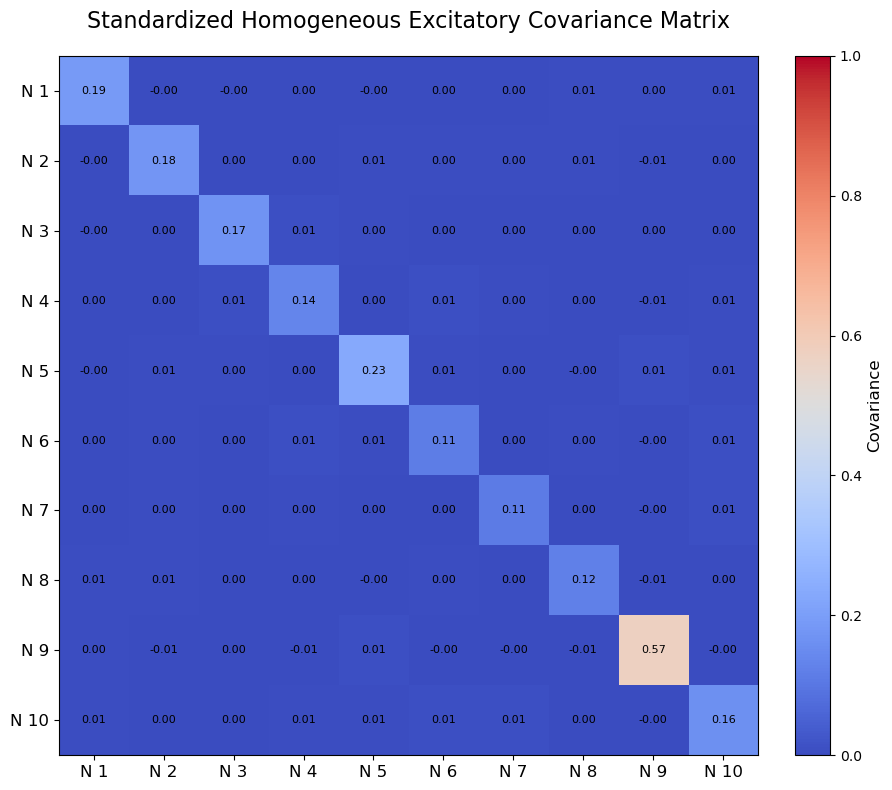

In [160]:
plot_covariance_matrix(cov_matrix_ex, normalize=False, title="Standardized Homogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.99329501e-01, -3.44367534e-03, -4.33438302e-03,
        -2.57392346e-03, -1.96532764e-03,  3.46019982e-04,
         7.70516759e-04,  4.23179666e-03,  4.84860391e-03,
         6.32350423e-03],
       [-3.44367534e-03,  1.86311220e-01,  1.11949631e-03,
         1.65573762e-03,  5.05433670e-03,  1.83026791e-03,
         2.21421471e-03,  3.58646496e-03, -6.53860329e-03,
         1.47477266e-03],
       [-4.33438302e-03,  1.11949631e-03,  1.76278622e-01,
         6.12548634e-03,  3.43549474e-03,  5.38054418e-04,
        -3.71266241e-04, -9.16142103e-04,  1.35583055e-03,
        -1.52017865e-03],
       [-2.57392346e-03,  1.65573762e-03,  6.12548634e-03,
         1.47133905e-01, -2.12723527e-04,  6.65601974e-03,
         2.30434270e-03,  4.81085310e-04, -8.88765479e-03,
         4.66877978e-03],
       [-1.96532764e-03,  5.05433670e-03,  3.43549474e-03,
        -2.12723527e-04,  2.39118300e-01,  5.57056389e-03,
         7.71945256e-04, -2.54566970e-03,  1.17249635e-02,
         6.

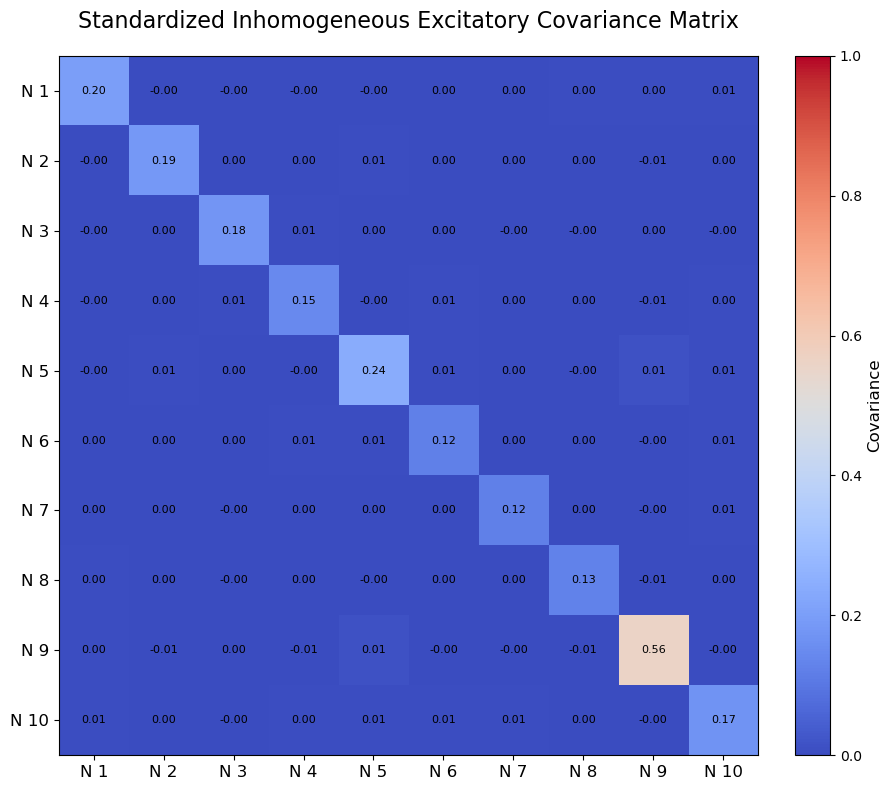

In [161]:
plot_covariance_matrix(cov_matrix_ex_emp, normalize=False, title="Standardized Inhomogeneous Excitatory Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [162]:
#hotelling_result_ex = hotelling_t2_test(reshaped_stands_ex, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex)
#hotelling_result_ex_emp = hotelling_t2_test(reshaped_stands_ex_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_ex_emp)

In [163]:
#cov_matrix_ex, diagonal_ones_ex = covariance_diagonal(reshaped_stands_ex, tol=1e-8)
#print(cov_matrix_ex)
#print(diagonal_ones_ex)
#cov_matrix_ex_emp, diagonal_ones_ex_emp = covariance_diagonal(reshaped_stands_ex_emp, tol=1e-8)
#print(cov_matrix_ex_emp)
#print(diagonal_ones_ex_emp)

In [164]:
#### TESTING #####
#plot_covariance_matrix(reshaped_data, normalize=False, title="Excitatory Theoretical Covariance Matrix", cmap='coolwarm', annot=True)

In [165]:
#### TESTING ####
#plot_covariance_matrix(reshaped_data_emp, normalize=False, title="Excitatory Empirical Covariance Matrix", cmap='coolwarm', annot=True)

In [166]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_ex = multivariate_normal(mean = theoretical_means_sim_ex, cov = cov_matrix_ex, allow_singular=allow_singular)
# rv_ex_emp = multivariate_normal(mean = empirical_mean_ex, cov = cov_matrix_ex_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

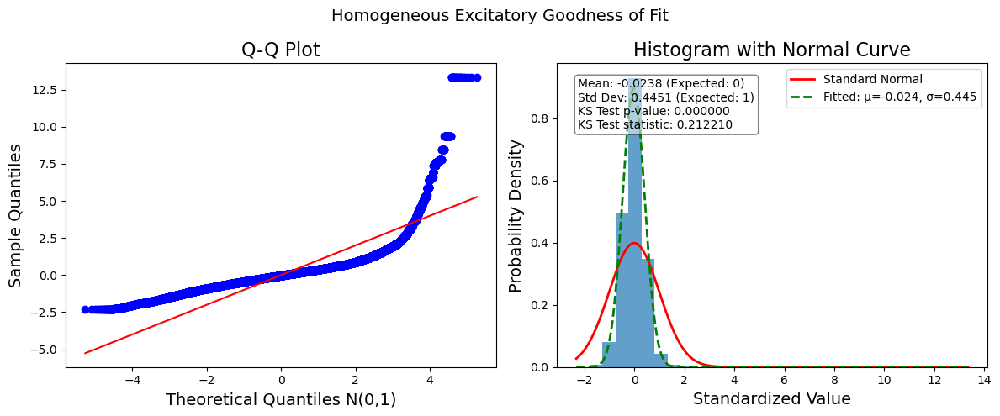

In [167]:
goodness_ex, fig_ex = analyze_poisson_goodness_of_fit(serialized_count_ex, plot_title="Homogeneous Excitatory Goodness of Fit", sample_limit=5000)

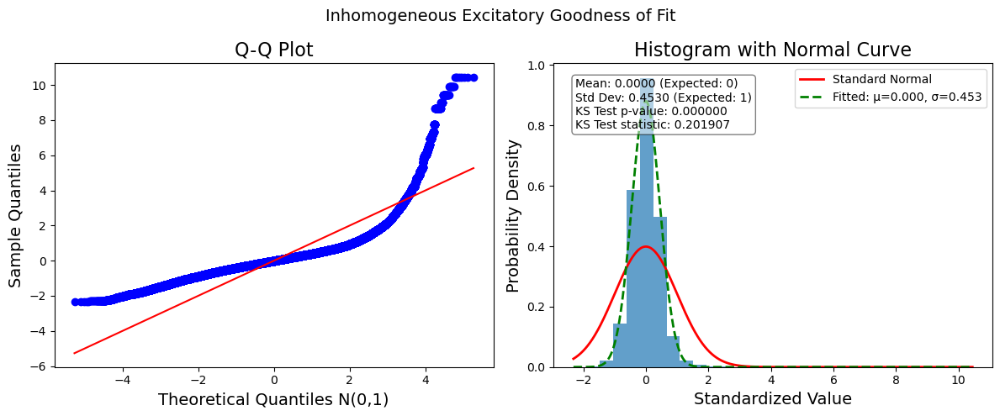

In [168]:
goodness_ex_emp, fig_ex_emp = analyze_poisson_goodness_of_fit(serialized_count_ex_emp, plot_title="Inhomogeneous Excitatory Goodness of Fit", sample_limit=5000)

Theoretical and Empirical stats of inhibitory counts.

In [170]:
# empirical_mean_in = empirical_means(count_in)
empirical_mean_in = count_in.mean(axis=0)
#print(empirical_mean_in)
#print(empirical_mean_in.shape)
count_rate_in = empirical_mean_in[:, -1]

#empirical_std_dev_in = std_dev_empirical_mean(empirical_mean_in, num_samples, count_in)
#empirical_std_dev_in = count_in.std(axis=0, ddof=1)
empirical_std_dev_in = np.sqrt(empirical_mean_in)
#print(empirical_std_dev_in)
#print(empirical_std_dev_in.shape)

empirical_lower_bound_in, empirical_upper_bound_in = confidence_intervals(empirical_mean_in, empirical_std_dev_in, num_samples, confidence_level=0.95)
# print(empirical_lower_bound_sim_in)
# print(empirical_upper_bound_sim_in)

In [171]:
exclude_times_in, global_exclude_in = last_zero_std_time(empirical_std_dev_in, verbose=True)

Neuron 0: last zero std at t=-1, recommended exclude=0
Neuron 1: last zero std at t=-1, recommended exclude=0
Neuron 2: last zero std at t=-1, recommended exclude=0
Neuron 3: last zero std at t=-1, recommended exclude=0
Neuron 4: last zero std at t=-1, recommended exclude=0
Neuron 5: last zero std at t=-1, recommended exclude=0
Neuron 6: last zero std at t=-1, recommended exclude=0
Neuron 7: last zero std at t=-1, recommended exclude=0
Neuron 8: last zero std at t=-1, recommended exclude=0
Neuron 9: last zero std at t=-1, recommended exclude=0

Global exclude (safest): t=0


In [172]:
theoretical_means_sim_in = calculate_theoretical_mean(count_rate_in, time)
#print(theoretical_means_sim_in)
#print(theoretical_means_sim_in.shape)

theoretical_std_dev_sim_in = calculate_theoretical_std_dev(theoretical_means_sim_in)
#print(theoretical_std_dev_sim_in)
#print(theoretical_std_dev_sim_in.shape)

theoretical_lower_bound_sim_in, theoretical_upper_bound_sim_in = confidence_intervals(theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, confidence_level=0.95)
# print(theoretical_lower_bound_sim_in)
# print(theoretical_upper_bound_sim_in)

In [173]:
res_var_in = variance_of_residuals(empirical_mean_in, theoretical_means_sim_in)
#print(res_var_in)

In [174]:
stands_in = standardize_counts_loop(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, num_neurons, exclude = 1)
#print(stands_in)
#print(stands_in.shape)

stands_in_emp = standardize_counts_loop(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, num_neurons, global_exclude_in)
#print(stands_in_emp)
#print(stands_in_emp.shape)

# WHENEVER WE CHANGE TIME, WE NEED TO HAVE IT BE KNOWN, 

# when i do covariance, i should reshape from num_samples, num_neurons, , assume poisson but not assume independent, the variance and covariance should be equal
# time to something with time as replicate. replicate (num_samples) times time in dimension, num_neurons
# covariance, num_neurons by num_neurons, data to produce this should be num_samples times num_neurons
# reformat the current matrix, use reshape with the matrix, maybe with loops 

standardized_mean_global_in = np.mean(stands_in)
standardized_std_global_in = np.std(stands_in)

standardized_mean_emp_global_in = np.mean(stands_in_emp)
standardized_std_emp_global_in = np.std(stands_in_emp)

standardized_mean_in = np.mean(stands_in, axis=0)
standardized_std_in = np.std(stands_in, axis=0, ddof = 1)

standardized_mean_in_emp = np.mean(stands_in_emp, axis = 0)
standardized_std_in_emp = np.std(stands_in_emp, axis = 0, ddof = 1)

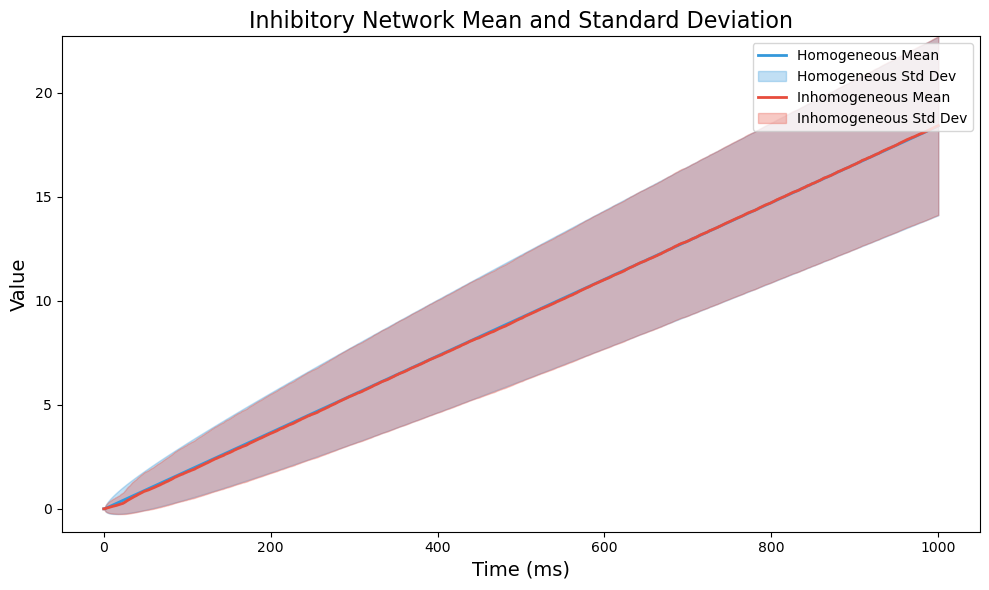

In [175]:
plot_stats(theoretical_means_sim_in , empirical_mean_in, theoretical_std_dev_sim_in, empirical_std_dev_in, title = 'Inhibitory Network Mean and Standard Deviation', show_hline=False, data_type='standardized')

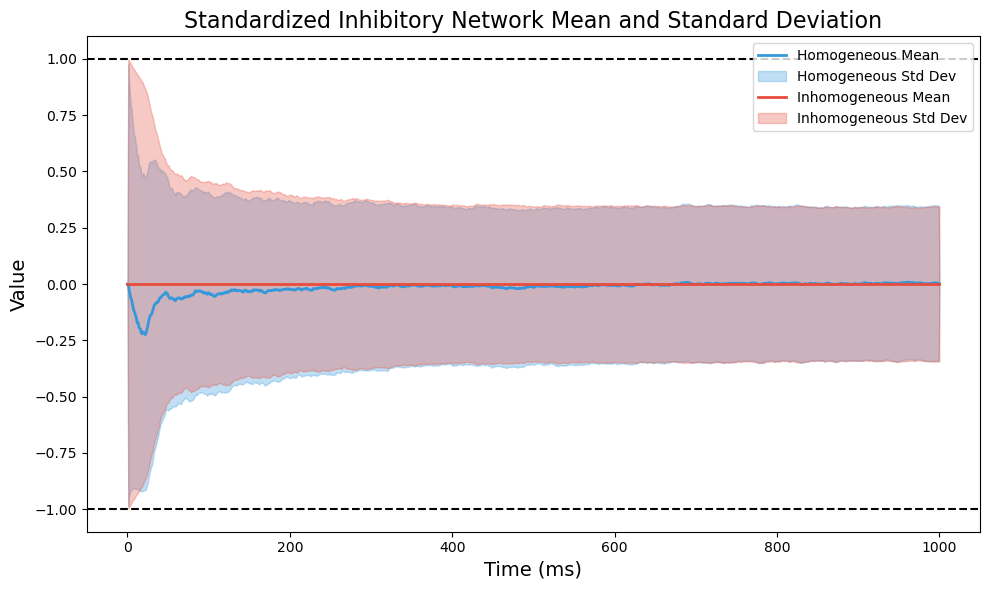

In [176]:
plot_stats(standardized_mean_in, standardized_mean_in_emp, standardized_std_in, standardized_std_in_emp, title = 'Standardized Inhibitory Network Mean and Standard Deviation', show_hline=True, data_type='standardized')

In [177]:
mean_check_in = check_mean_with_se(stands_in, expected_mean=0, confidence=0.95)
#print(mean_check_in)

mean_check_in_emp = check_mean_with_se(stands_in_emp, expected_mean=0, confidence=0.95)
#print(mean_check_in_emp)

In [178]:
serialized_count_in = serialize_counts(stands_in) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in.shape)
#print(np.mean(serialized_count_in))
t_stat_in, p_val_mean_in = stats.ttest_1samp(serialized_count_in, np.mean(serialized_count_in))
#print(t_stat_in)
#print(p_val_mean_in)
    ## per neuron, check that is it doing per neuron
    ## check assumptions if i'm using count, check for data replicate and check for variables


serialized_count_in_emp = serialize_counts(stands_in_emp) # make serialize have an extra parameter that makes you drop the first n units [:,:,10:]
#print(serialized_count_in_emp.shape)
#print(np.mean(serialized_count_in_emp))
t_stat_in_emp, p_val_mean_in_emp = stats.ttest_1samp(serialized_count_in_emp, np.mean(serialized_count_in_emp))
#print(t_stat_in_emp)
#print(p_val_mean_in_emp)

In [179]:
#reshaped_stands_in = np.reshape(stands_in, (-1, stands_in.shape[1]), order='F')
reshaped_stands_in = np.transpose(stands_in, (1, 0, 2)).reshape(stands_in.shape[1], -1)
#print(stands_in.shape)
#print(reshaped_stands_in.shape)

#reshaped_stands_in_emp = np.reshape(stands_in_emp, (-1, stands_in_emp.shape[1]), order='F')
reshaped_stands_in_emp = np.transpose(stands_in_emp, (1, 0, 2)).reshape(stands_in_emp.shape[1], -1)
#print(stands_in_emp.shape)
#print(reshaped_stands_in_emp.shape)

In [180]:
cov_matrix_in = cov_standardized_data(reshaped_stands_in)
cov_matrix_in_emp = cov_standardized_data(reshaped_stands_in_emp)

array([[ 0.15208858,  0.00163251, -0.00216034,  0.0108865 ,  0.00127853,
        -0.00040444, -0.00507565,  0.01097982,  0.00076955,  0.00479843],
       [ 0.00163251,  0.12524534,  0.00367701,  0.00077148,  0.00185381,
         0.00581103,  0.00405002,  0.0008875 ,  0.00110956,  0.0006563 ],
       [-0.00216034,  0.00367701,  0.18349134,  0.00372535, -0.00233087,
         0.00561249, -0.00957374, -0.0021909 ,  0.00802168,  0.00067064],
       [ 0.0108865 ,  0.00077148,  0.00372535,  0.21702464,  0.00660776,
         0.00380207, -0.00240805,  0.00034179, -0.0019783 ,  0.00742089],
       [ 0.00127853,  0.00185381, -0.00233087,  0.00660776,  0.19938836,
        -0.00325654,  0.00128867, -0.00275894, -0.00254006,  0.00213804],
       [-0.00040444,  0.00581103,  0.00561249,  0.00380207, -0.00325654,
         0.15371657,  0.00466967, -0.00049247, -0.00055226,  0.01006417],
       [-0.00507565,  0.00405002, -0.00957374, -0.00240805,  0.00128867,
         0.00466967,  0.22973653,  0.00483057

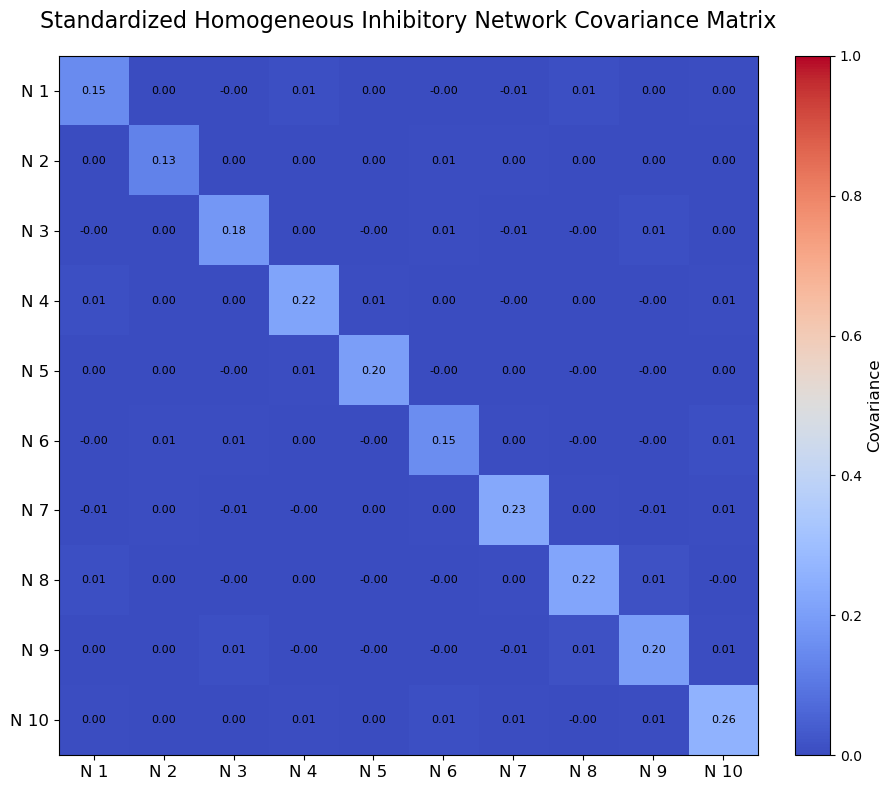

In [181]:
plot_covariance_matrix(cov_matrix_in, normalize=False, title="Standardized Homogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

array([[ 1.60331691e-01,  1.25911927e-04, -3.92782984e-03,
         1.00930072e-02,  1.29869752e-04, -2.02551673e-03,
        -6.41129241e-03,  9.90529335e-03, -6.64002925e-04,
         3.80576544e-03],
       [ 1.25911927e-04,  1.33219129e-01,  2.09047556e-03,
        -9.57981766e-04,  3.70457776e-04,  4.15699817e-03,
         2.51700597e-03, -9.50084180e-04, -5.45760696e-04,
        -1.39838087e-03],
       [-3.92782984e-03,  2.09047556e-03,  1.92631352e-01,
         2.26942871e-03, -4.07442144e-03,  4.28467481e-03,
        -1.15678073e-02, -4.03591699e-03,  6.18046369e-03,
        -5.28719012e-04],
       [ 1.00930072e-02, -9.57981766e-04,  2.26942871e-03,
         2.25194255e-01,  5.34697781e-03,  2.17111500e-03,
        -3.85730790e-03, -1.31047565e-03, -3.62577948e-03,
         6.33114093e-03],
       [ 1.29869752e-04,  3.70457776e-04, -4.07442144e-03,
         5.34697781e-03,  2.06153862e-01, -4.87652681e-03,
        -2.08311165e-04, -4.53086060e-03, -4.33159621e-03,
         7.

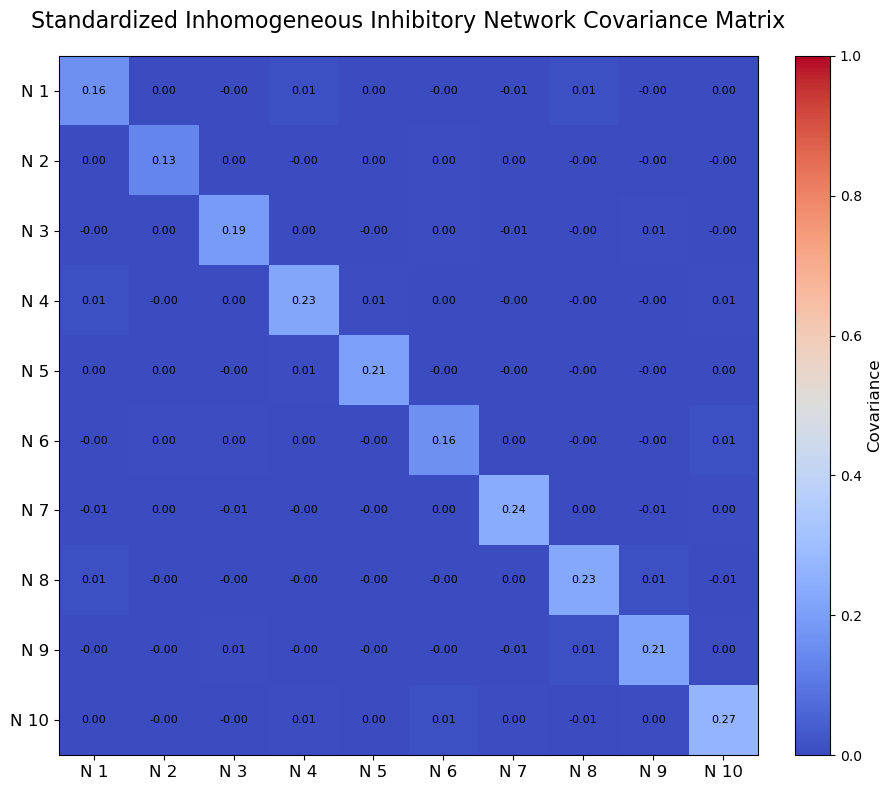

In [182]:
plot_covariance_matrix(cov_matrix_in_emp, normalize=False, title="Standardized Inhomogeneous Inhibitory Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=None)

In [183]:
#hotelling_result_in = hotelling_t2_test(reshaped_stands_in, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in)
#hotelling_result_in_emp = hotelling_t2_test(reshaped_stands_in_emp, np.arange(num_neurons), bessel=True, S=None)
#print(hotelling_result_in_emp)

In [184]:
#cov_matrix_in, diagonal_ones_in = covariance_diagonal(reshaped_stands_in, tol=1e-8)
#print(cov_matrix_in)
#print(diagonal_ones_in)
#cov_matrix_in_emp, diagonal_ones_in_emp = covariance_diagonal(reshaped_stands_in_emp, tol=1e-8)
#print(cov_matrix_in_emp)
#print(diagonal_ones_in_emp)

In [185]:
# MULTIVARIATE ANALYSIS
# rv = multivariate_normal(mean=mean, cov=cov, allow_singular=allow_singular)

# rv_in = multivariate_normal(mean = theoretical_means_sim_in, cov = cov_matrix_in, allow_singular=allow_singular)
# rv_in_emp = multivariate_normal(mean = empirical_mean_in, cov = cov_matrix_in_emp, allow_singular=allow_singular)

# this is creating its own model, from this we can test if the data has goodness of fit

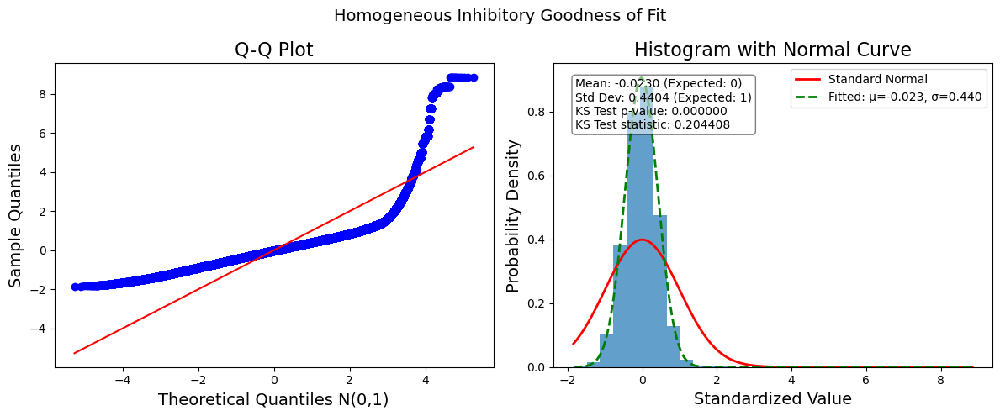

In [186]:
goodness_in, fig_in = analyze_poisson_goodness_of_fit(serialized_count_in, plot_title="Homogeneous Inhibitory Goodness of Fit", sample_limit=5000)

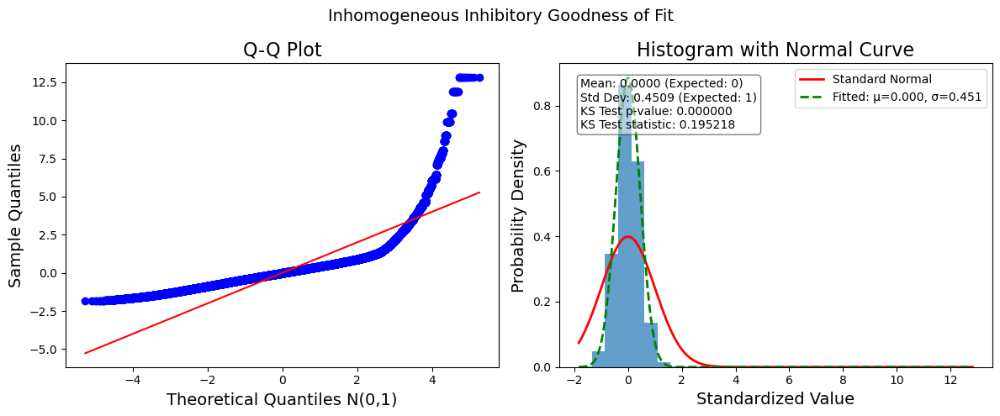

In [187]:
goodness_in_emp, fig_in_emp = analyze_poisson_goodness_of_fit(serialized_count_in_emp, plot_title="Inhomogeneous Inhibitory Goodness of Fit", sample_limit=5000)

Balanced Excitatory and Inhibitory Experiments

In [189]:
# Original excitatory and inhibitory data shapes
print(reshaped_stands_ex.shape)
print(reshaped_stands_in.shape)

print(reshaped_stands_ex_emp.shape)
print(reshaped_stands_in_emp.shape)

(10, 999000)
(10, 999000)
(10, 1000000)
(10, 1000000)


In [190]:
balanced_data, labels, types = create_balanced_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
print(f"\nBalanced dataset shape: {balanced_data.shape}")
print(f"Neuron labels: {labels}")
print(f"Neuron types: {types}")

balanced_data_emp, labels_emp, types_emp = create_balanced_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
print(f"\nBalanced Empirical dataset shape: {balanced_data_emp.shape}")
print(f"Neuron Empirical labels: {labels_emp}")
print(f"Neuron Empirical types: {types_emp}")
# Balanced = Joint, don't use balance because it could be interpreted as something it isn't
# add option to randomize joint excitatory and inhibitory neurons
# Get neuron id from spike train instead of label


Balanced dataset shape: (10, 999000)
Neuron labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']

Balanced Empirical dataset shape: (10, 1000000)
Neuron Empirical labels: ['E0', 'E1', 'E2', 'E3', 'E4', 'I0', 'I1', 'I2', 'I3', 'I4']
Neuron Empirical types: ['E', 'E', 'E', 'E', 'E', 'I', 'I', 'I', 'I', 'I']


In [191]:
cov_matrix_balance = cov_standardized_data(balanced_data)
cov_matrix_balance_emp = cov_standardized_data(balanced_data_emp)

array([[ 1.90136738e-01, -1.10441863e-03, -2.06613167e-03,
         1.46250968e-04, -6.20139265e-04,  1.26802170e-03,
        -6.71555319e-03, -1.76978226e-03, -1.28210302e-03,
        -5.37106855e-03],
       [-1.10441863e-03,  1.76006679e-01,  2.71405227e-03,
         3.89100497e-03,  6.35628141e-03, -5.96909131e-04,
         4.11519025e-03,  9.10497857e-03,  5.61263168e-03,
         6.71779715e-03],
       [-2.06613167e-03,  2.71405227e-03,  1.68762047e-01,
         8.25708634e-03,  4.41227133e-03, -3.55599512e-03,
         3.82792749e-03,  6.73511849e-04,  1.28418283e-03,
         4.04496646e-03],
       [ 1.46250968e-04,  3.89100497e-03,  8.25708634e-03,
         1.35803235e-01,  1.05142760e-03,  1.43930874e-03,
         3.23850548e-03,  4.69459446e-03,  6.06849270e-03,
        -2.77727519e-03],
       [-6.20139265e-04,  6.35628141e-03,  4.41227133e-03,
         1.05142760e-03,  2.32519267e-01, -8.13925928e-04,
        -5.24616948e-03,  5.39472643e-03,  1.51220739e-03,
         9.

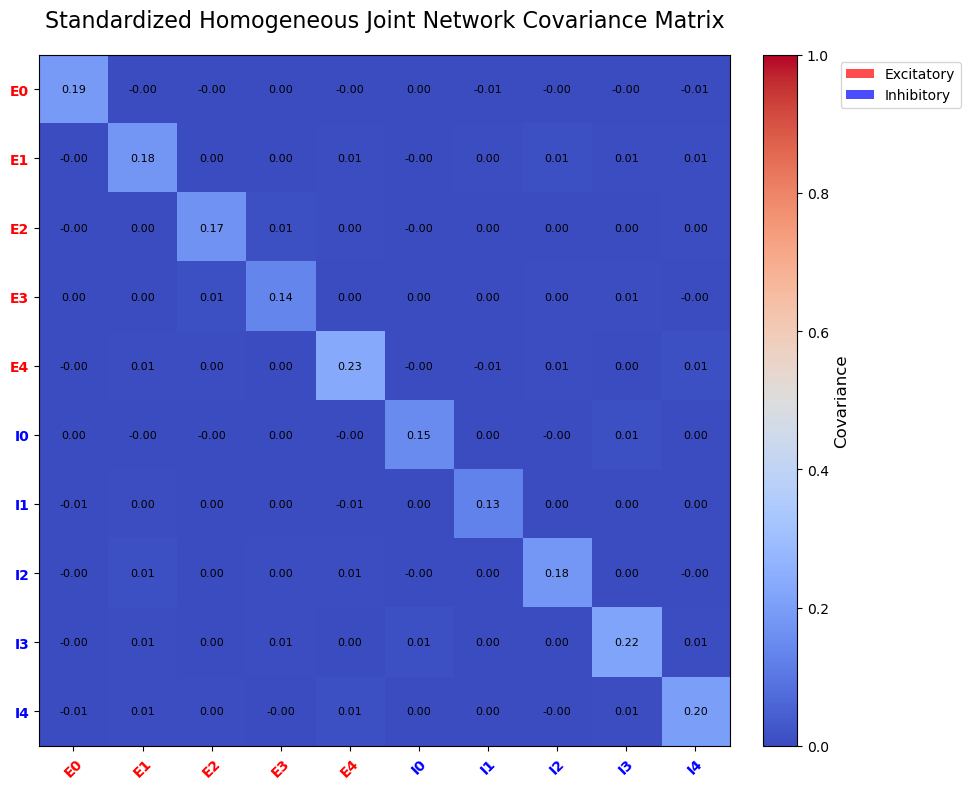

In [192]:
plot_covariance_matrix(cov_matrix_balance, normalize=False, title="Standardized Homogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels)

array([[ 1.99329501e-01, -3.44367534e-03, -4.33438302e-03,
        -2.57392346e-03, -1.96532764e-03, -1.43817300e-04,
        -9.28255970e-03, -3.44699983e-03, -2.78014912e-03,
        -7.41232988e-03],
       [-3.44367534e-03,  1.86311220e-01,  1.11949631e-03,
         1.65573762e-03,  5.05433670e-03, -1.74538812e-03,
         1.87302997e-03,  7.35642411e-03,  4.13165421e-03,
         5.01112661e-03],
       [-4.33438302e-03,  1.11949631e-03,  1.76278622e-01,
         6.12548634e-03,  3.43549474e-03, -4.94588633e-03,
         2.34408962e-03, -8.18921473e-04, -2.08456161e-04,
         2.46981427e-03],
       [-2.57392346e-03,  1.65573762e-03,  6.12548634e-03,
         1.47133905e-01, -2.12723527e-04, -7.12957694e-04,
         6.71642597e-04,  2.79670642e-03,  4.21460342e-03,
        -4.66952732e-03],
       [-1.96532764e-03,  5.05433670e-03,  3.43549474e-03,
        -2.12723527e-04,  2.39118300e-01, -2.16305533e-03,
        -7.03147949e-03,  4.34854404e-03,  4.14842069e-04,
         8.

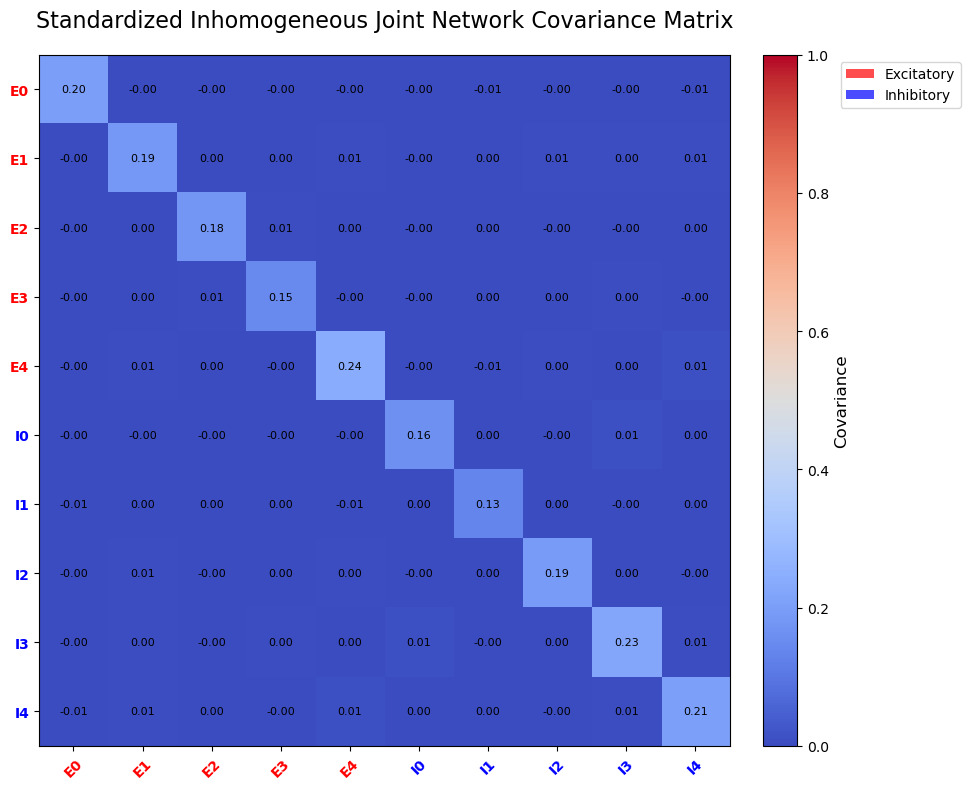

In [193]:
plot_covariance_matrix(cov_matrix_balance_emp, normalize=False, title="Standardized Inhomogeneous Joint Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=labels_emp)

In [194]:
#interleaved_data, int_labels, int_types = create_interleaved_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nInterleaved dataset shape: {interleaved_data.shape}")
#print(f"Neuron labels: {int_labels}")
#print(f"Neuron types: {int_types}")

#interleaved_data_emp, int_labels_emp, int_types_emp = create_interleaved_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nInterleaved Empirical dataset shape: {interleaved_data_emp.shape}")
#print(f"Neuron Empirical labels: {int_labels_emp}")
#print(f"Neuron Empirical types: {int_types_emp}")

In [195]:
#cov_matrix_interleaved = cov_standardized_data(interleaved_data)
#cov_matrix_interleaved_emp = cov_standardized_data(interleaved_data_emp)

In [196]:
#plot_covariance_matrix(cov_matrix_interleaved, normalize=False, title="Standardized Homogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels)

In [197]:
#plot_covariance_matrix(cov_matrix_interleaved_emp, normalize=False, title="Standardized Inhomogeneous Interleaved Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=int_labels_emp)

In [198]:
#random_data, rand_labels, rand_types = create_random_ei_dataset(reshaped_stands_ex, reshaped_stands_in, n_neurons_each=5)
#print(f"\nRandom dataset shape: {random_data.shape}")
#print(f"Neuron labels: {rand_labels}")
#print(f"Neuron types: {rand_types}")

#random_data_emp, rand_labels_emp, rand_types_emp = create_random_ei_dataset(reshaped_stands_ex_emp, reshaped_stands_in_emp, n_neurons_each=5)
#print(f"\nRandom Empirical dataset shape: {random_data_emp.shape}")
#print(f"Neuron Empirical labels: {rand_labels_emp}")
#print(f"Neuron Empirical types: {rand_types_emp}")

In [199]:
#cov_matrix_random = cov_standardized_data(random_data)
#cov_matrix_random_emp = cov_standardized_data(random_data_emp)

In [200]:
#plot_covariance_matrix(cov_matrix_random, normalize=False, title="Standardized Homogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels)

In [201]:
#plot_covariance_matrix(cov_matrix_random_emp, normalize=False, title="Standardized Inhomogeneous Random Network Covariance Matrix", cmap='coolwarm', annot=True, neuron_labels=rand_labels_emp)

Plots of raw counts, excitatory counts, and inhibitory counts centered and standardized.

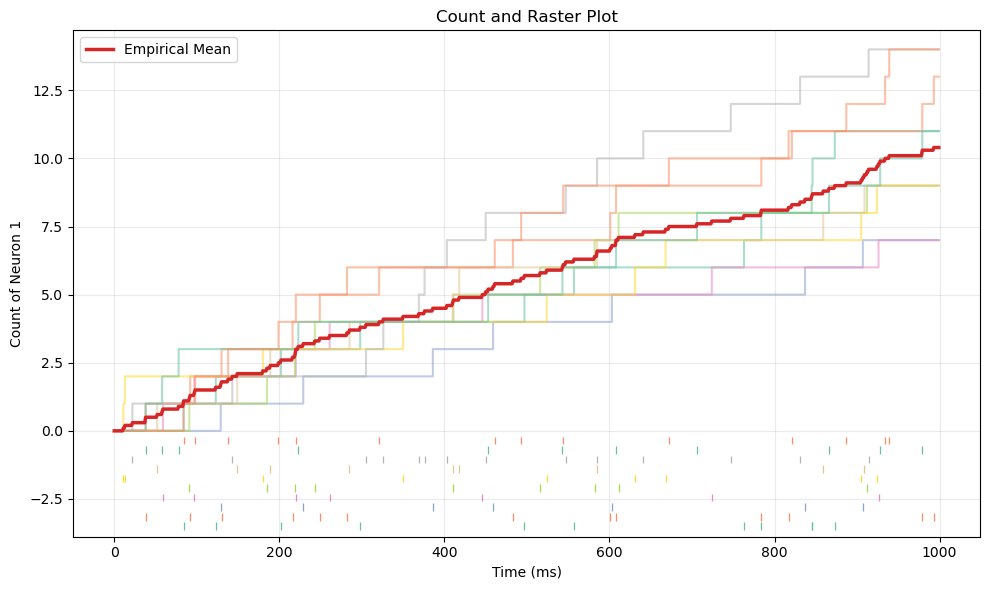

In [466]:
count_and_raster_plot(count[:10, :, :], num_samples, title='Count and Raster Plot', theoretical_mean=None)

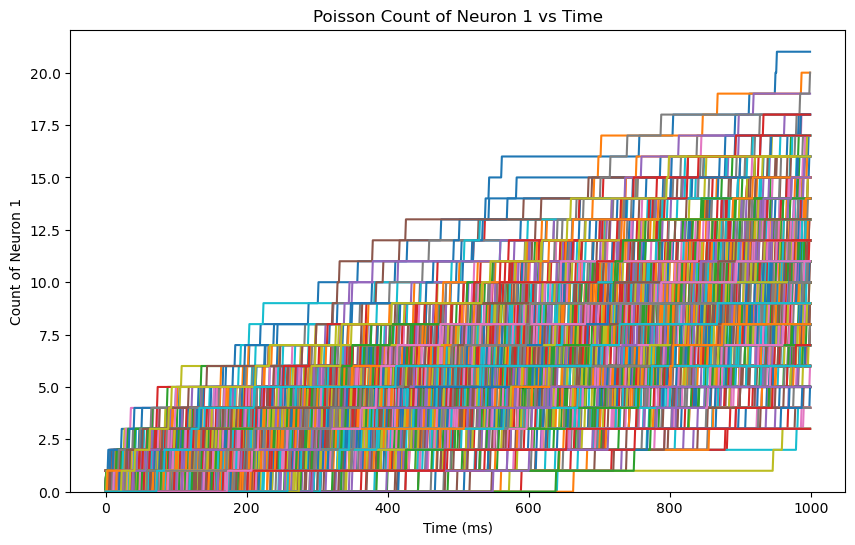

In [204]:
# plot_count_neuron1_vs_time(random_samples, num_samples = 5)
plot_count_neuron1_vs_time(count, num_samples, title = 'Poisson Count of Neuron 1 vs Time')

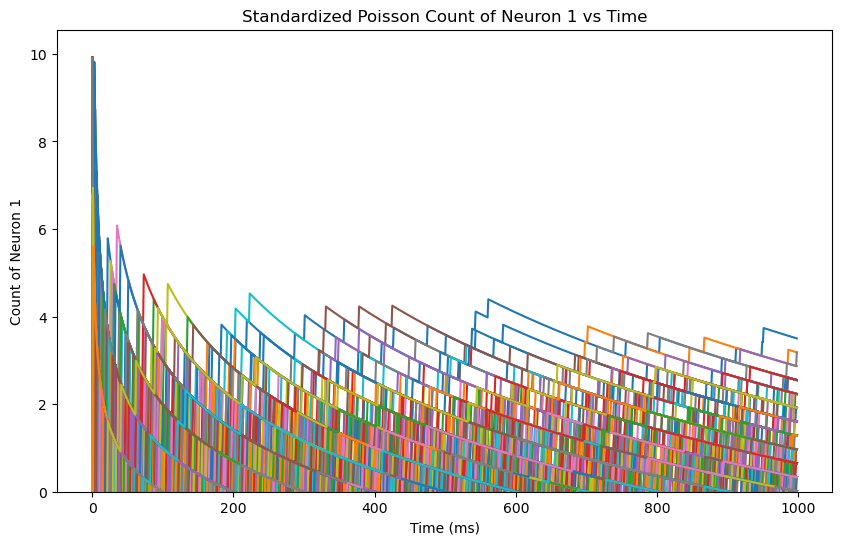

In [205]:
plot_count_neuron1_vs_time(stands, num_samples, title = 'Standardized Poisson Count of Neuron 1 vs Time')

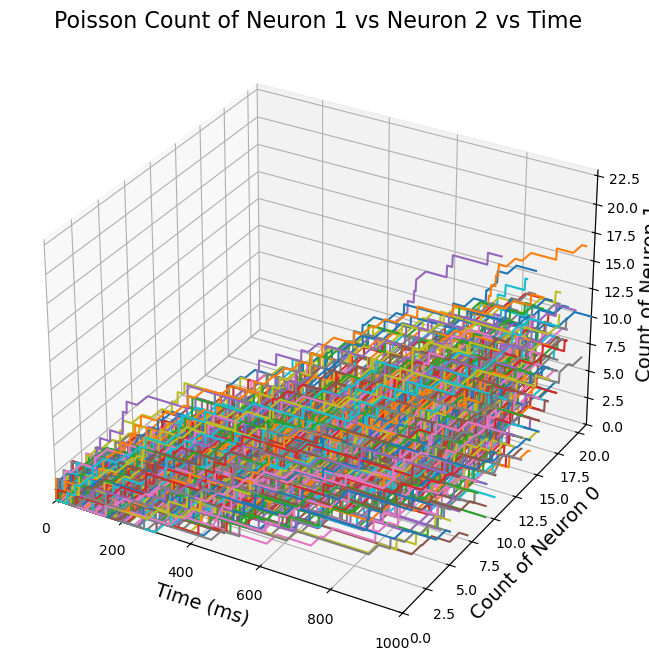

In [206]:
plot_count_neuron1_vs_neuron2_vs_time(count, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Poisson Count of Neuron 1 vs Neuron 2 vs Time' )

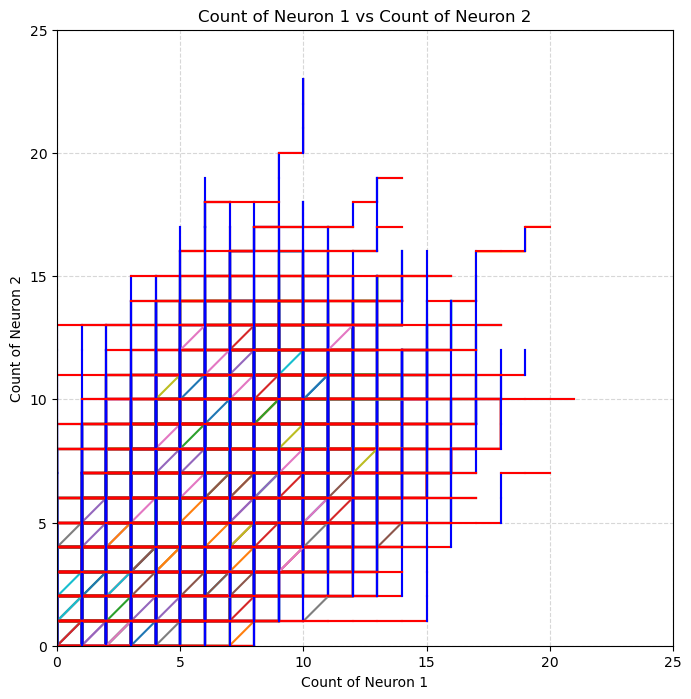

In [207]:
plot_count_neuron1_vs_count_neuron2(count, num_samples)

In [208]:
# plot_count_neuron1_vs_count_neuron2_vs_count_neuron3(count, num_samples)

In [209]:
# combined_poisson_plot(spike_train, count, theoretical_means, empirical_mean, colors=None, figsize=(12, 10))

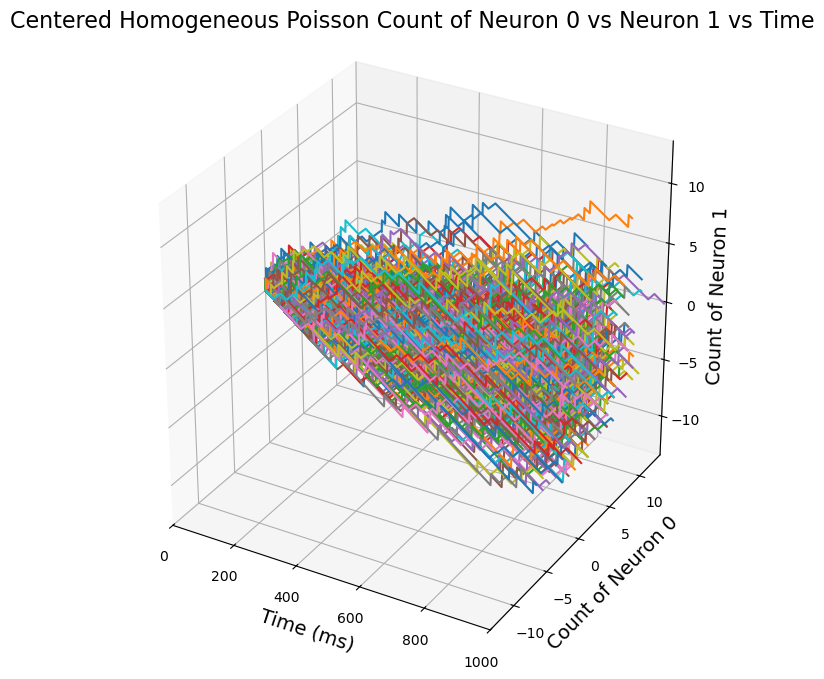

In [210]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
plot_centered_staircase_3d(count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time' )

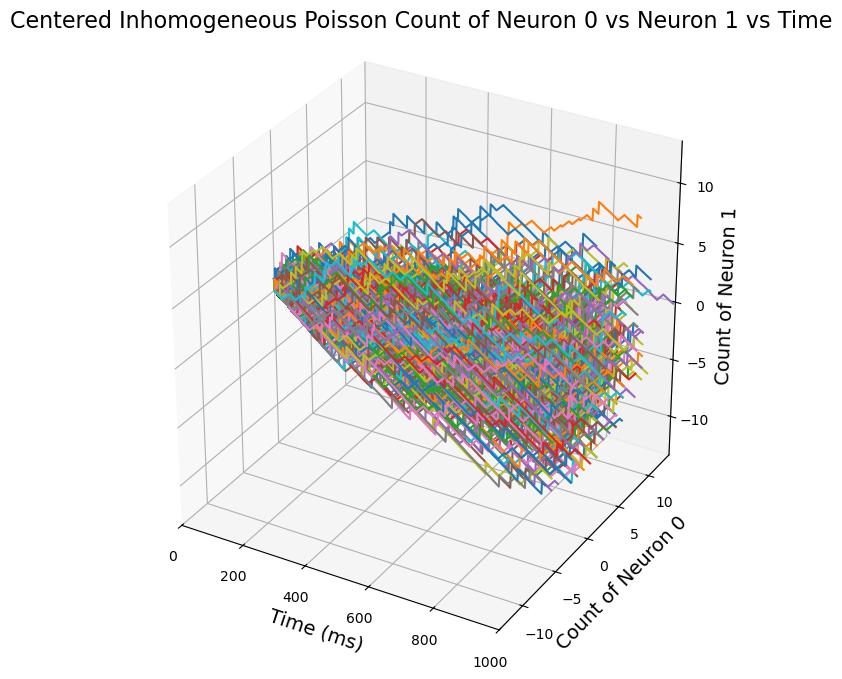

In [211]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
plot_centered_staircase_3d(count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: invalid value encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: invalid value encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:345: RuntimeWarning: divide by zero encountered in divide
  neuron1_data = (count[i][neuron1_idx] - theoretical_means[neuron1_idx]) / (theoretical_std_dev[neuron1_idx])
 [py.warnings]
WARNING    C:\Users\agreg\neural_simulation_functions.py:346: RuntimeWarning: divide by zero encountered in divide
  neuron2_data = (count[i][neuron2_idx] - theoretical_means[neuron2_idx]) / (theoretical_std_dev[neuron2_idx])
 [py.warnings]


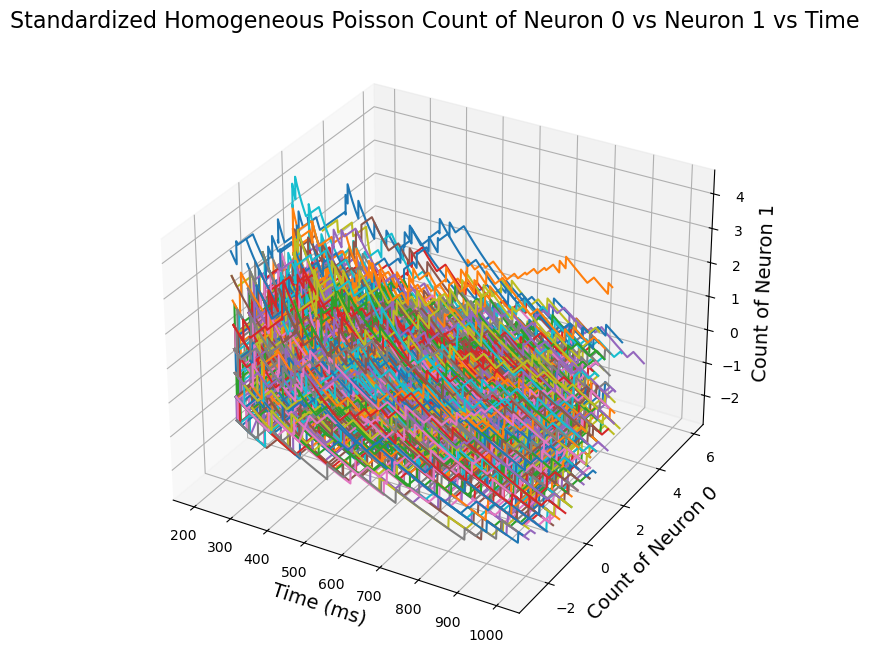

In [212]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

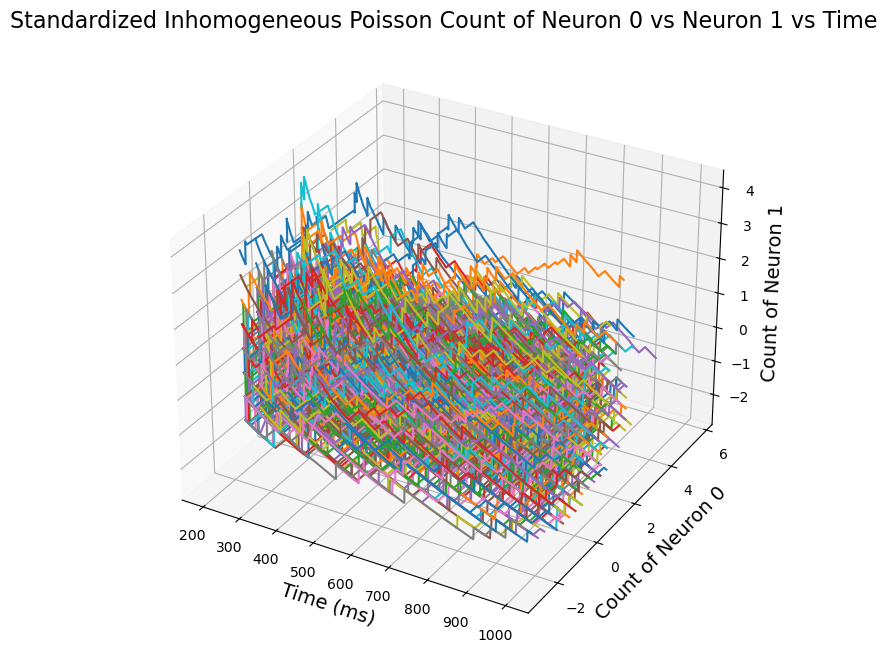

In [213]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
plot_standardized_staircase_3d(count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 1 vs Time')

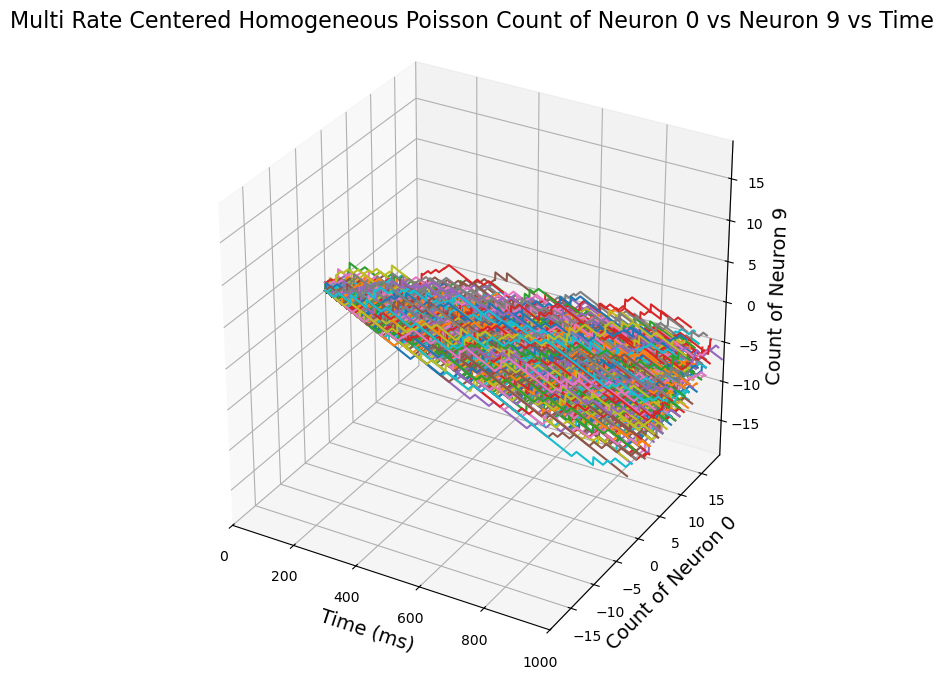

In [214]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
# plot_centered_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )
plot_centered_staircase_3d(multi_rate_count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

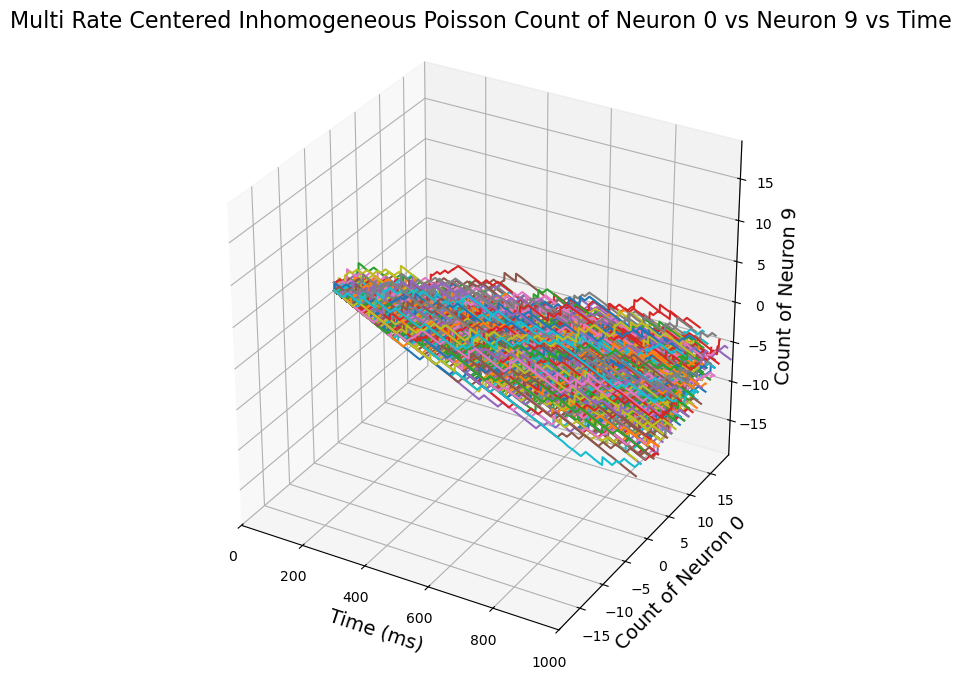

In [215]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
# plot_centered_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_centered_staircase_3d(multi_rate_count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

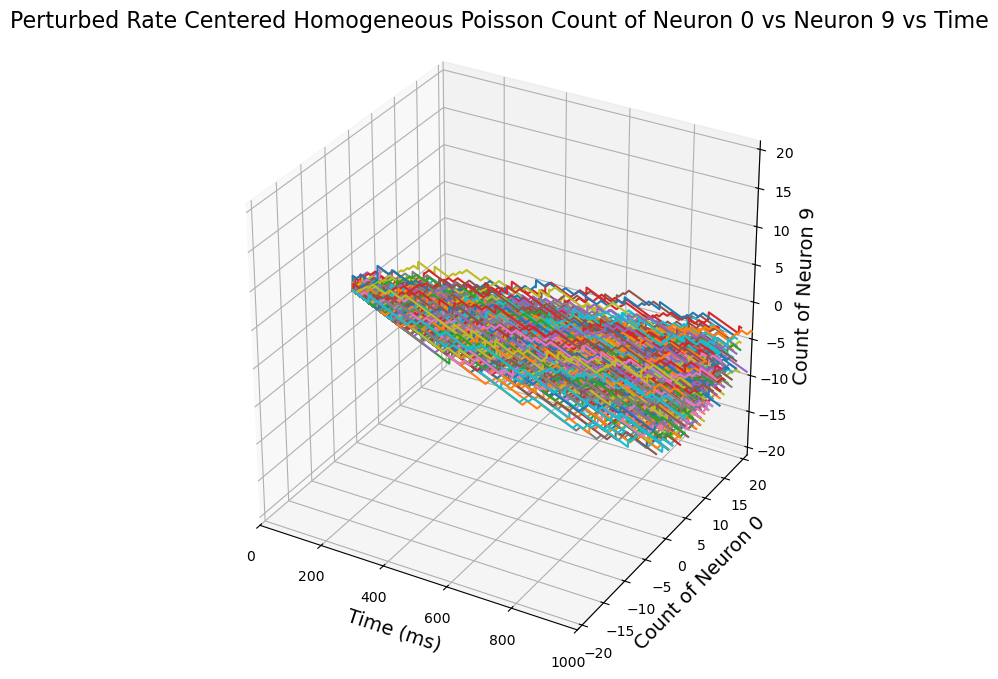

In [216]:
#plot_centered_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, num_samples=5)
# plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )
plot_centered_staircase_3d(perturbed_rate_count, theoretical_means, theoretical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time' )

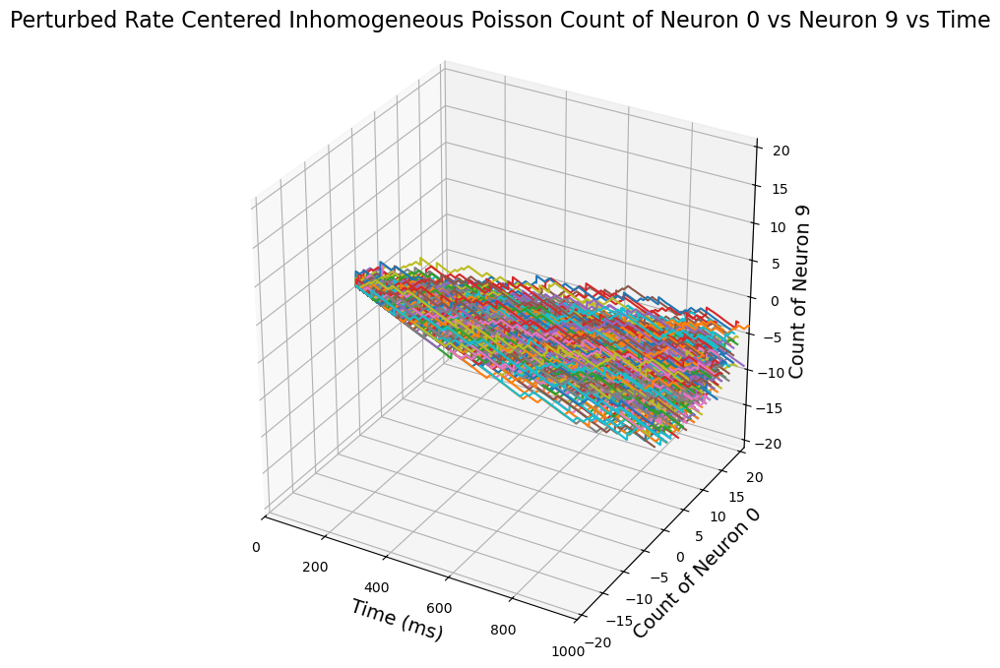

In [217]:
#plot_centered_staircase_3d(random_samples, empirical_mean, empirical_std_dev, num_samples= 5)
# plot_centered_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_centered_staircase_3d(perturbed_rate_count, empirical_mean, empirical_std_dev, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Centered Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

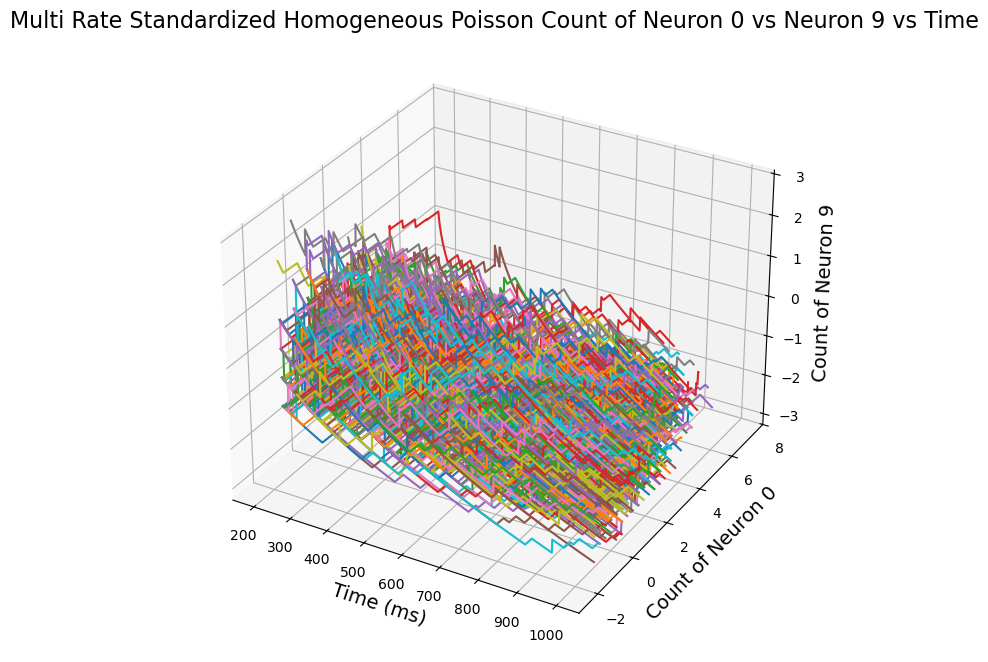

In [218]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(multi_rate_count, multi_rate_theoretical_means, multi_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(multi_rate_count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

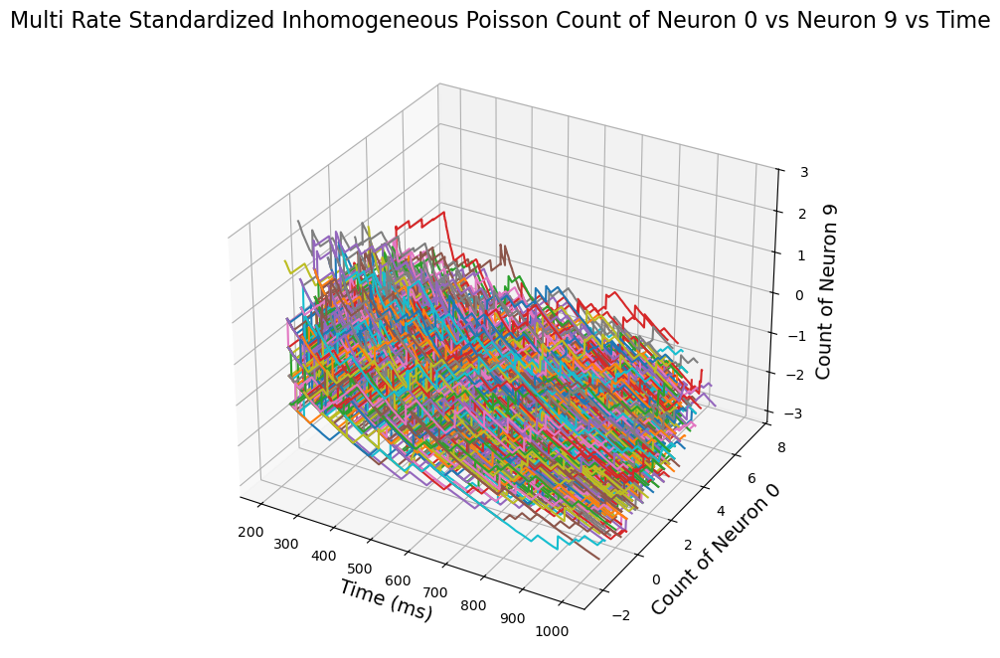

In [219]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(multi_rate_count, multi_rate_empirical_mean, multi_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(multi_rate_count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Multi Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

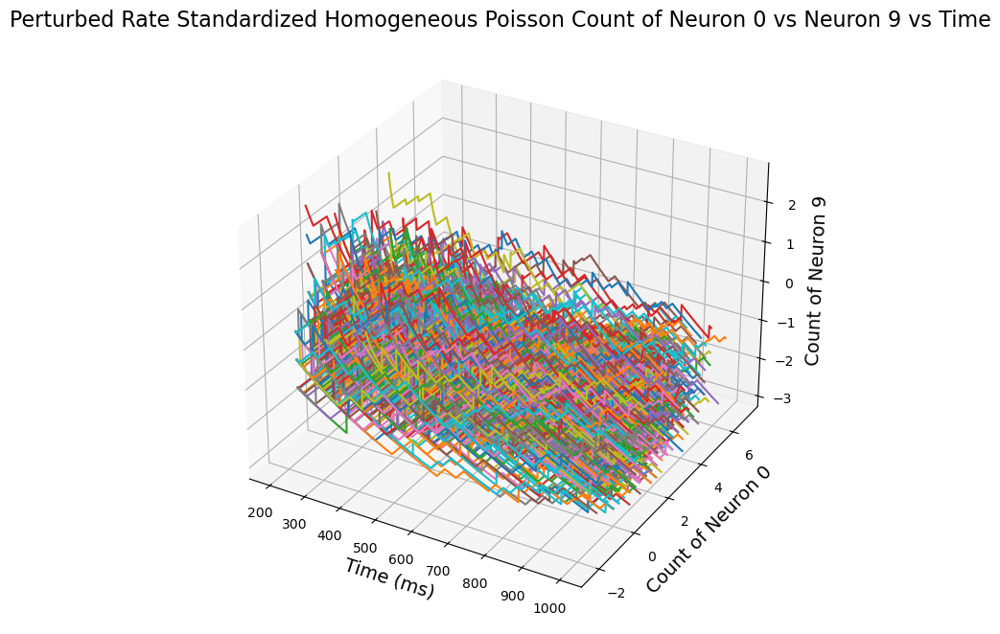

In [220]:
#plot_standardized_staircase_3d(random_samples, theoretical_means, theoretical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_theoretical_means, perturbed_rate_theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(perturbed_rate_count, theoretical_means, theoretical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Homogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

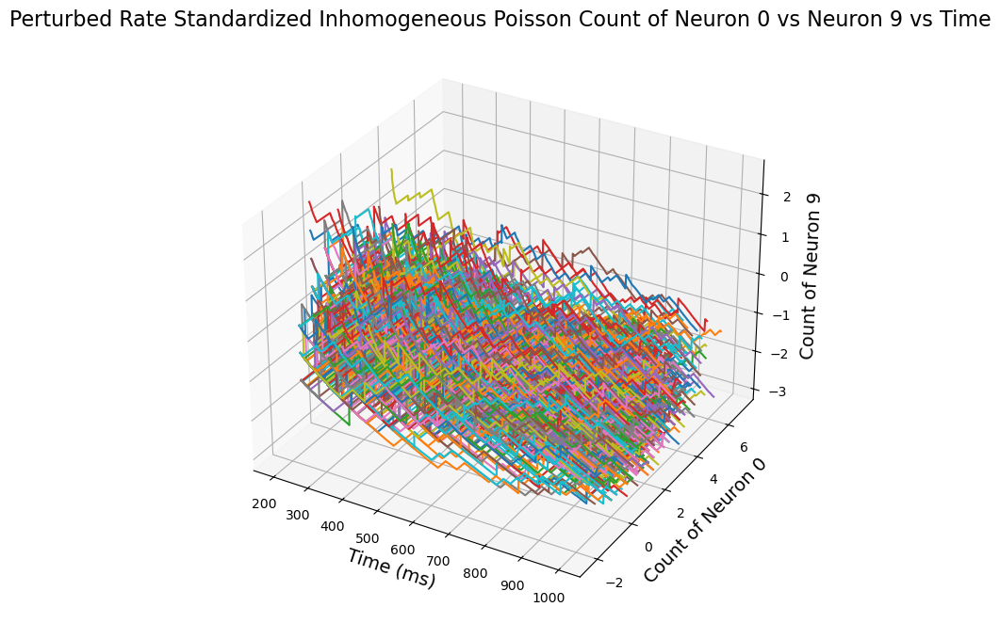

In [221]:
#plot_standardized_staircase_3d(random_samples, empirical_mean, empirical_std_dev, t0, num_samples=5)
# plot_standardized_staircase_3d(perturbed_rate_count, perturbed_rate_empirical_mean, perturbed_rate_empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')
plot_standardized_staircase_3d(perturbed_rate_count, empirical_mean, empirical_std_dev, t0, num_samples, neuron1_idx=0, neuron2_idx=9, title = 'Perturbed Rate Standardized Inhomogeneous Poisson Count of Neuron 0 vs Neuron 9 vs Time')

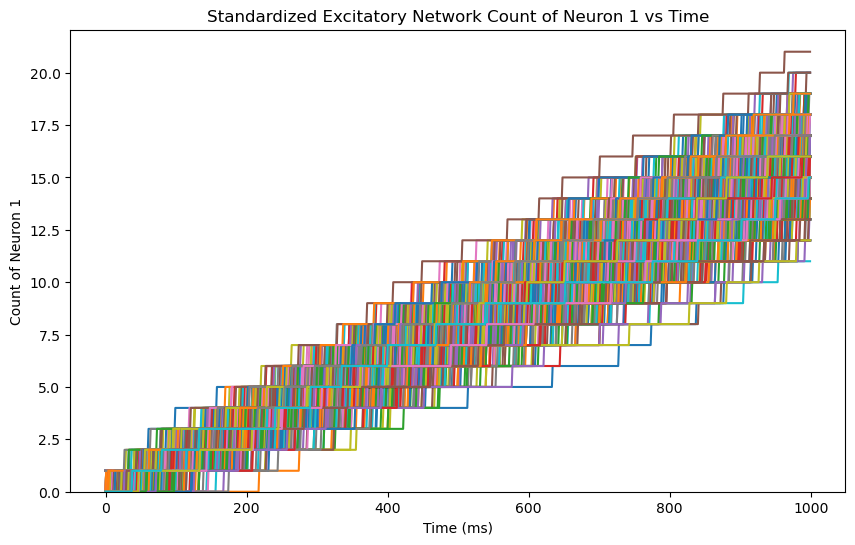

In [222]:
#plot_count_neuron1_vs_time(random_samples_ex, num_samples = 5)
plot_count_neuron1_vs_time(count_ex, num_samples, title = 'Standardized Excitatory Network Count of Neuron 1 vs Time')

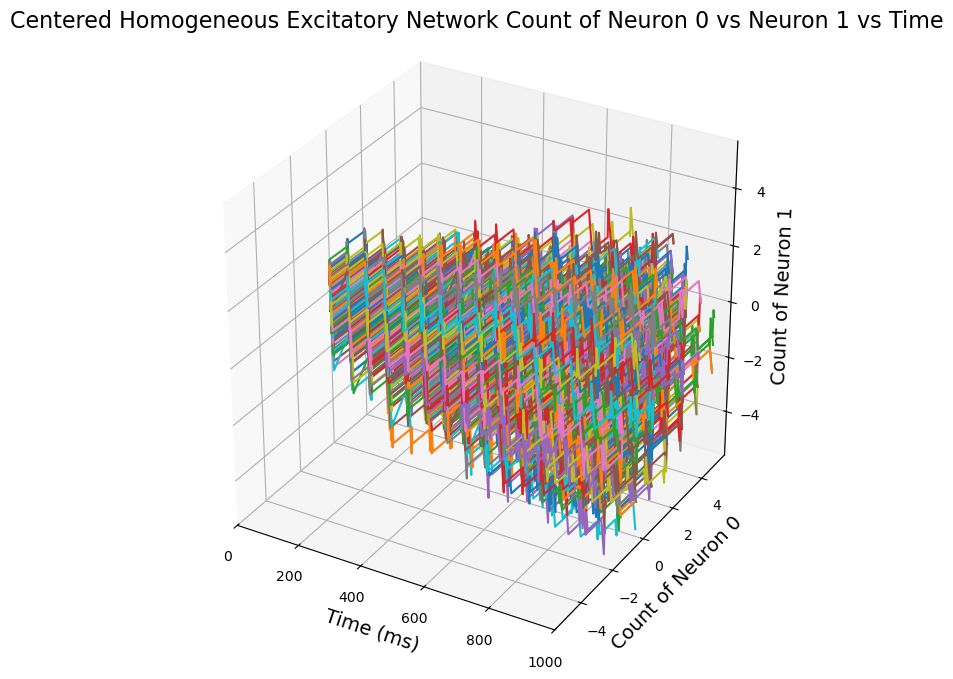

In [223]:
#plot_centered_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

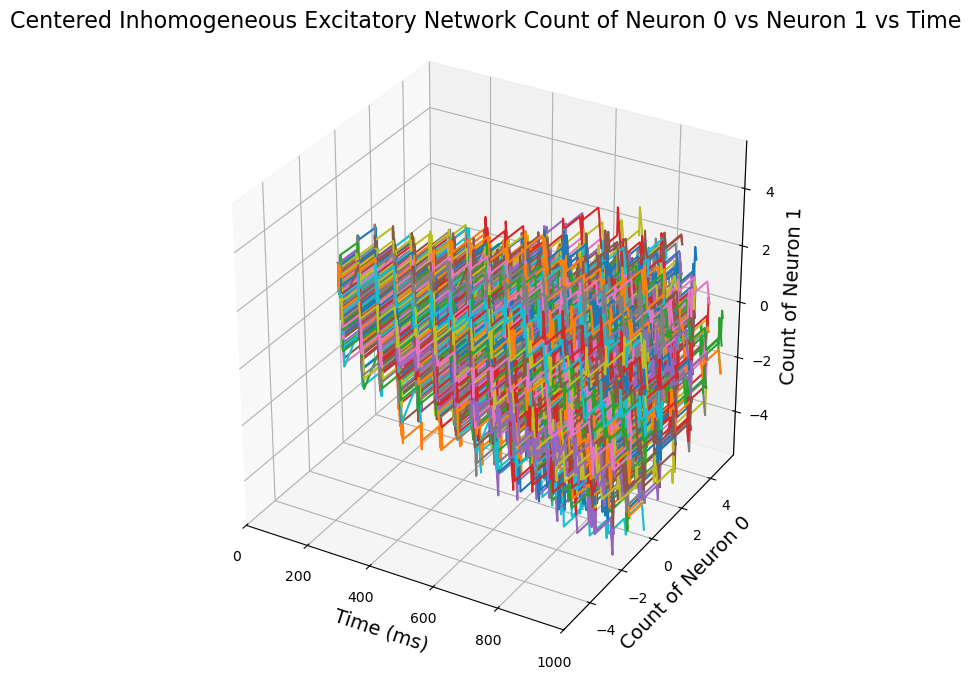

In [224]:
#plot_centered_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples= 5)
plot_centered_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

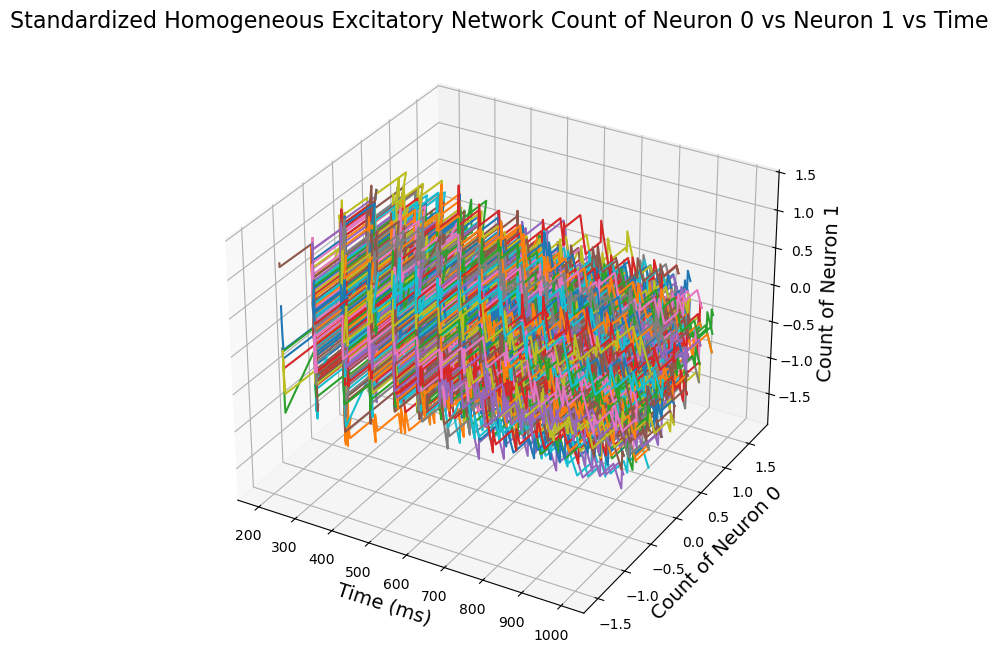

In [225]:
#plot_standardized_staircase_3d(random_samples_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, theoretical_means_sim_ex, theoretical_std_dev_sim_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

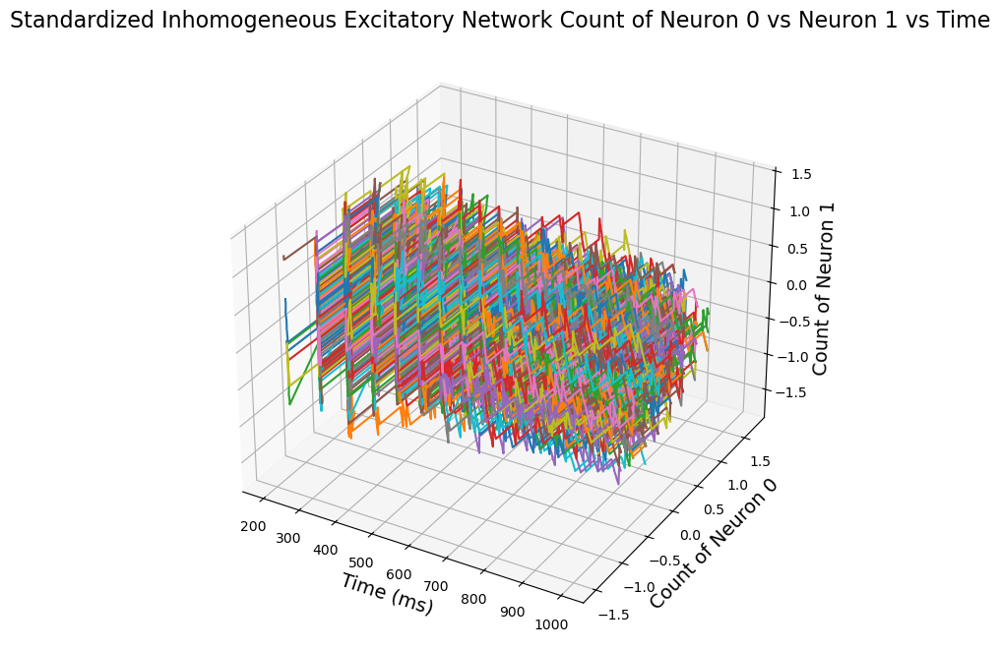

In [226]:
#plot_standardized_staircase_3d(random_samples_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples=5)
plot_standardized_staircase_3d(count_ex, empirical_mean_ex, empirical_std_dev_ex, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Excitatory Network Count of Neuron 0 vs Neuron 1 vs Time')

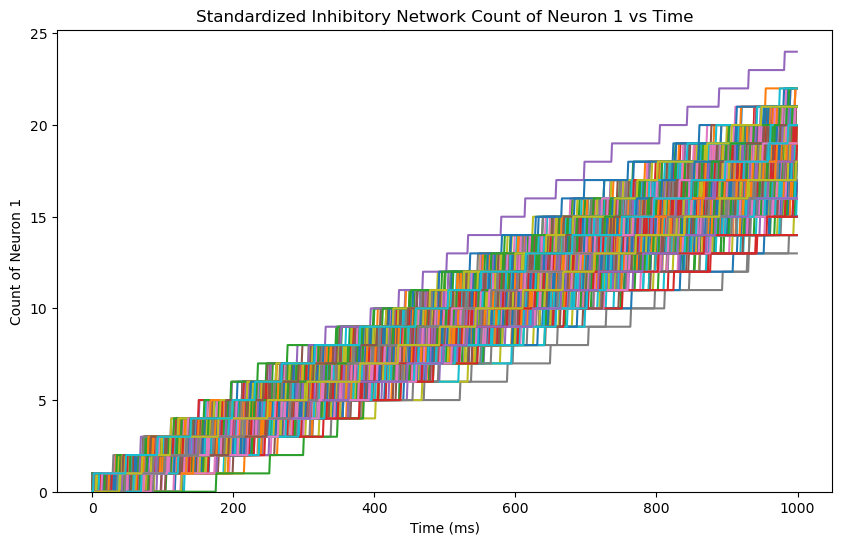

In [227]:
#plot_count_neuron1_vs_time(random_samples_in, num_samples = 5)
plot_count_neuron1_vs_time(count_in, num_samples, title = 'Standardized Inhibitory Network Count of Neuron 1 vs Time')

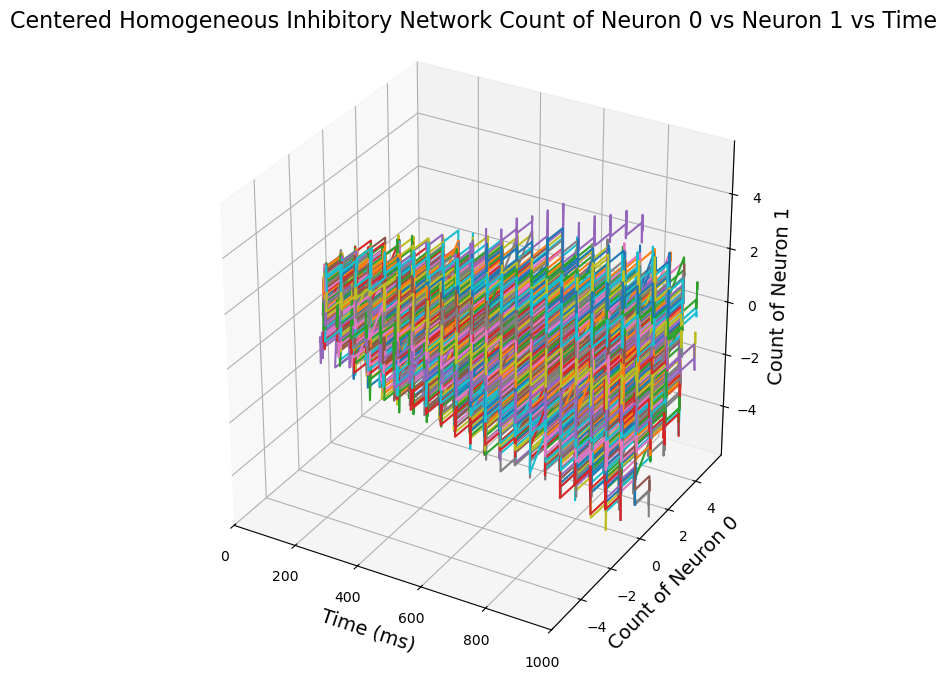

In [228]:
#plot_centered_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples= 5)
plot_centered_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

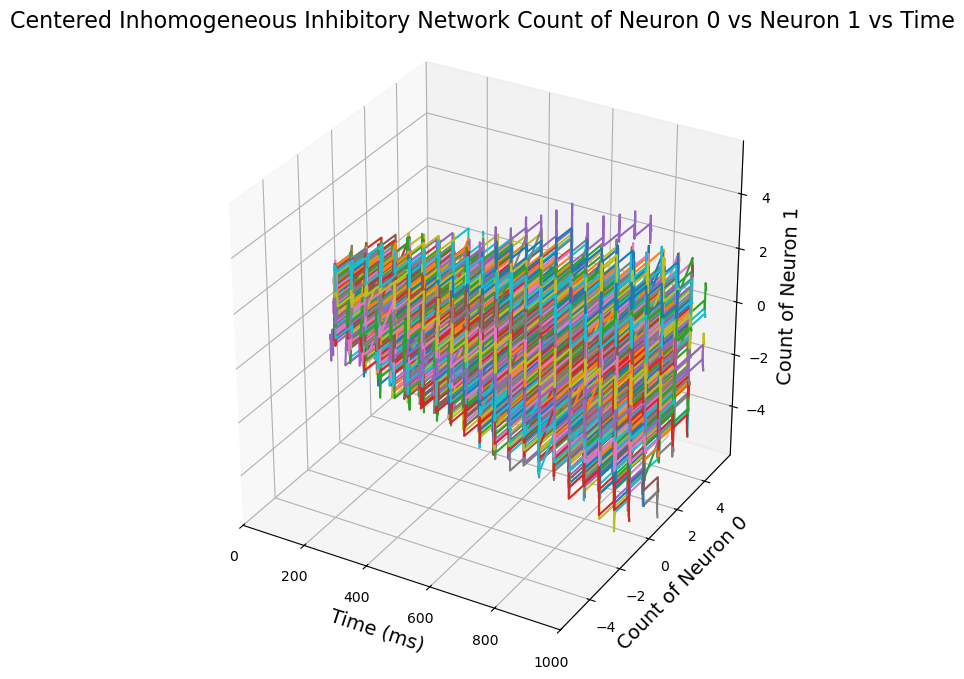

In [229]:
#plot_centered_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, num_samples= 5)
plot_centered_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Centered Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

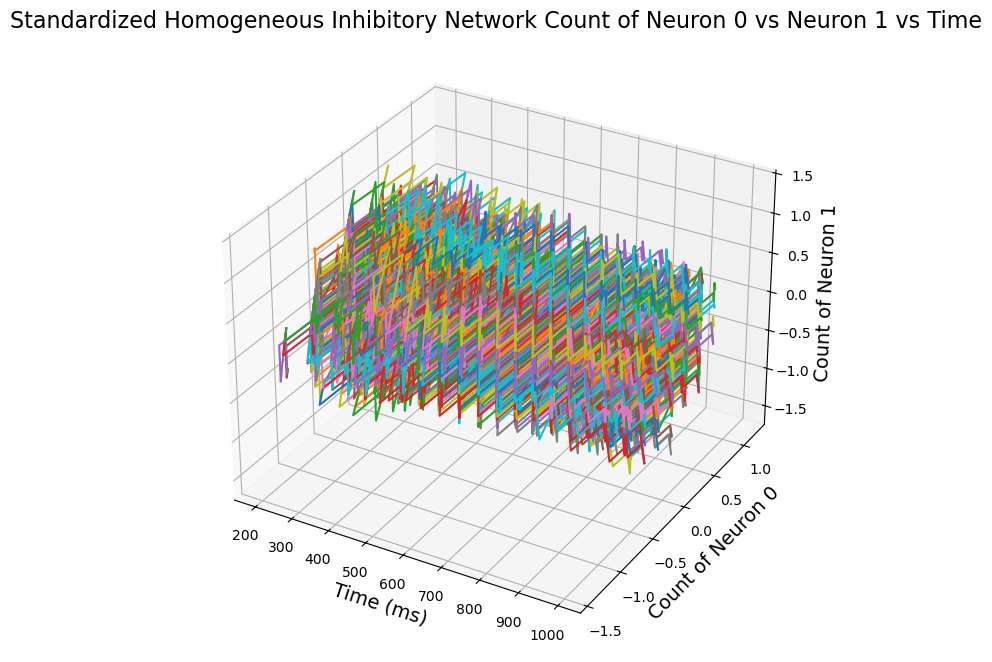

In [230]:
#plot_standardized_staircase_3d(random_samples_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, theoretical_means_sim_in, theoretical_std_dev_sim_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Homogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

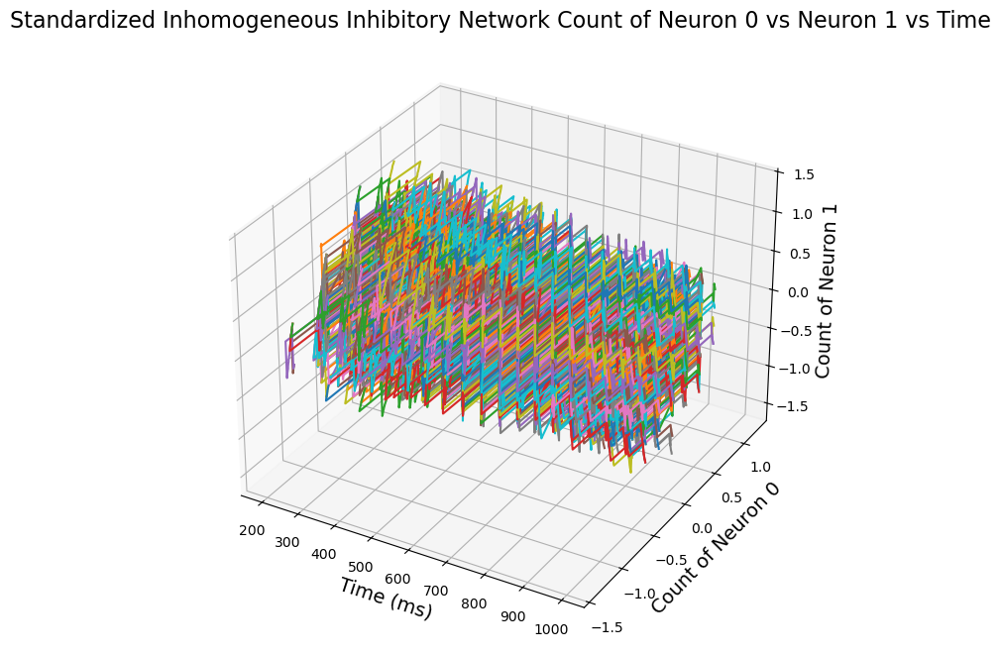

In [231]:
#plot_standardized_staircase_3d(random_samples_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples=5)
plot_standardized_staircase_3d(count_in, empirical_mean_in, empirical_std_dev_in, t0, num_samples, neuron1_idx=0, neuron2_idx=1, title = 'Standardized Inhomogeneous Inhibitory Network Count of Neuron 0 vs Neuron 1 vs Time')

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Poisson Count with Mean and Standard Deviation'}, xlabel='Time (ms)', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

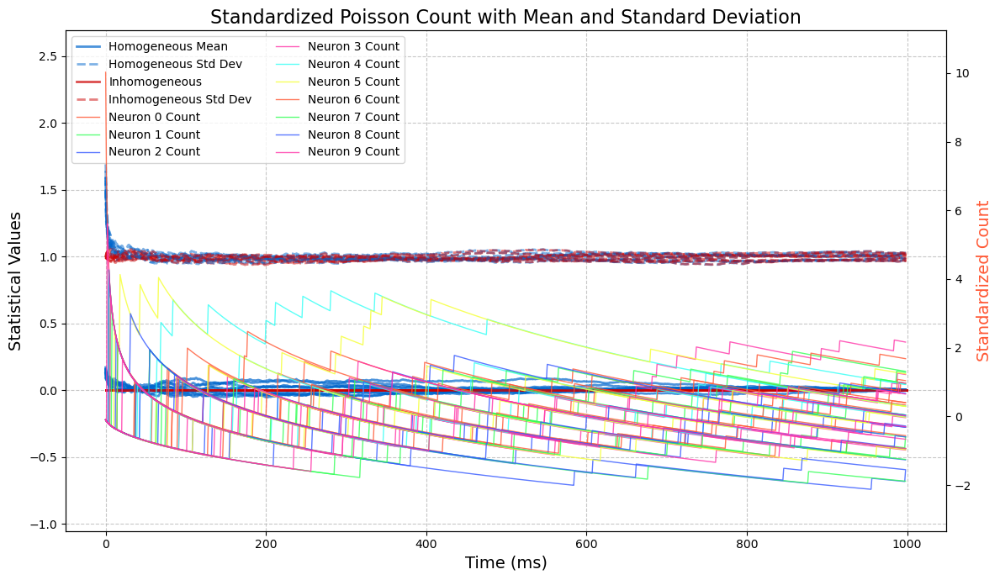

In [232]:
data_plot(stands, num_samples, standardized_mean, standardized_mean_emp, 
              standardized_std, standardized_std_emp, num_neurons, title= 'Standardized Poisson Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Exctitatory Count with Mean and Standard Deviation'}, xlabel='Time (ms)', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

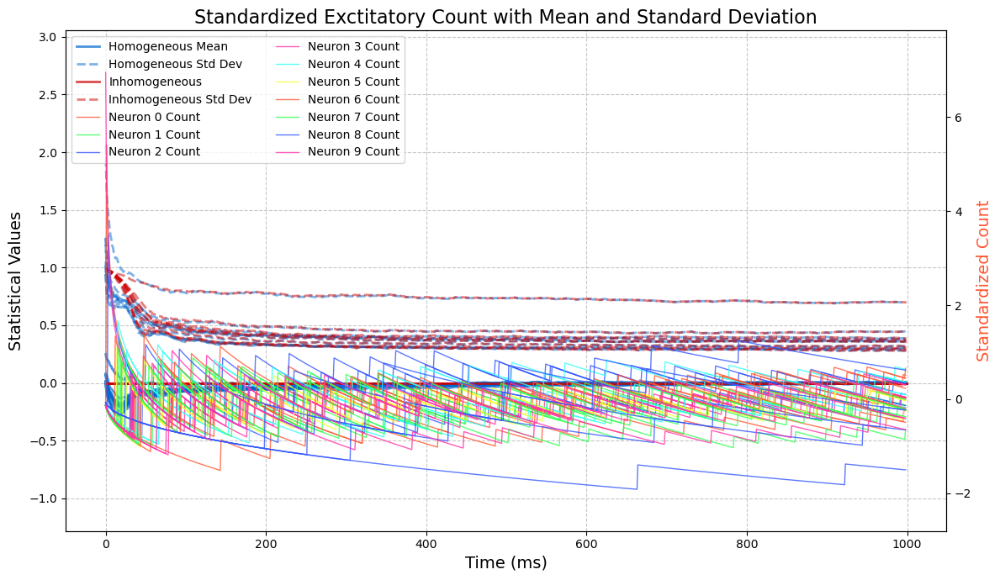

In [233]:
data_plot(stands_ex, num_samples, standardized_mean_ex, standardized_mean_ex_emp, 
              standardized_std_ex, standardized_std_ex_emp, num_neurons, title='Standardized Exctitatory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)

(<Figure size 1200x700 with 2 Axes>,
 <Axes: title={'center': 'Standardized Inhibitory Count with Mean and Standard Deviation'}, xlabel='Time (ms)', ylabel='Statistical Values'>,
 <Axes: ylabel='Standardized Count'>)

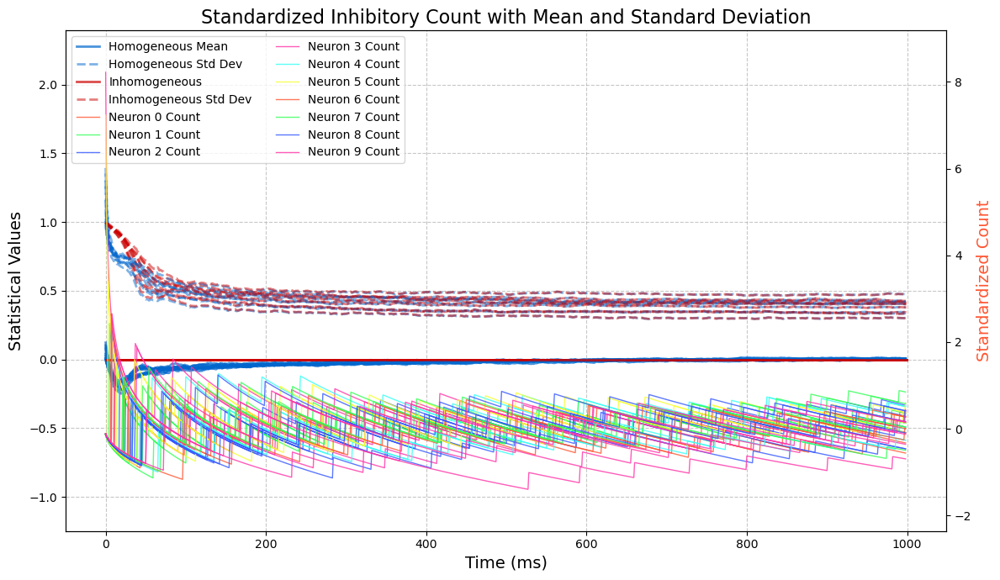

In [234]:
data_plot(stands_in, num_samples, standardized_mean_in, standardized_mean_in_emp, 
              standardized_std_in, standardized_std_in_emp, num_neurons, title='Standardized Inhibitory Count with Mean and Standard Deviation',
              figsize=(12, 7), max_samples_to_show=5)